In [2]:
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from scipy import interpolate
from datetime import datetime as dt
import cmocean
import datetime
from matplotlib.dates import DateFormatter
import glob
import math
# from astropy.convolution import convolve
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib as mpl
import matplotlib.dates as mdates
from scipy.optimize import curve_fit
from scipy import stats
import pandas as pd
import csv
myFmt = mdates.DateFormatter('%m-%d')

from ICECAPS_support_functions import *


### General functions

In [3]:
def round_up_to_even(f):
    if np.isnan(f):
        return np.nan
    else:
        return math.ceil(f / 2.) * 2

def round_down_to_even(f):
    # if np.isnan(f):
    #     return np.nan
    # else:
    #     return 2 * (f // 2)
    return 2 * (f // 2)

In [4]:
def calc_sw_ext(sw_sfc, kappa, depths_in, f_nir=0.5):
    """ swc_sfc is net SW from the atmosphere (SWD-SWU) 
    kappa is snow extinction coefficient, which is going to be used as a tuning parameter
    f_nir is the fraction of SW that is assumed to be NIR (as opposed to visible)
    depths is assumed to be centimeters below the surface with intervals of 2cm, i.e., 2, 4, 6 etc 
    should depths start at 0 or 2? """

    ## so that absorbed SW, clacluated as the difference between levels, covers the temperature
    # depths_in += .01

    ## transmitted SW at each level
    print('SWT shapes',  np.shape(sw_sfc), np.shape(kappa), np.shape(depths_in))
    sw_t = (1-f_nir)*sw_sfc*np.ma.exp(-kappa*np.abs(depths_in))
    print('SWT out shape', sw_t.shape)

    ## absorbed SW at each level
    # indexing will need to change to use SWN timeseries
    sw_a = sw_t[:,:-1] - sw_t[:,1:]

    sfc_sw_a = sw_sfc[:,0]-sw_t[:,1]

    sw_a = np.concatenate((sfc_sw_a[:, np.newaxis], sw_a), axis=1)
    
    return sw_a, sw_t

In [5]:
def nearest(items, pivot):
    return min(items, key=lambda x: abs(x - pivot))

In [6]:
def get_percentile_bin_vals(x_in, y_in, bins_in, p=90):
    bins_xs = []
    bins_ys = []
    # print('input', bins_in)
    for b0, b1 in zip(bins_in[:-1], bins_in[1:]):
        bin_idx = np.where((x_in>=b0)&(x_in<b1))[0]
        # get median of upper quartile (check impact of that choice)

        y_in_bin = y_in[bin_idx]

        # original version of only taking the mean/median
        bins_xs.append( np.median([b0,b1]) )
        
        if y_in_bin.shape[0]<1:
            bins_ys.append(np.nan)
            continue
            
        bin_upper_quart_val = np.percentile(y_in_bin[~y_in_bin.mask], p)
        bin_upper_quart_idx = np.ma.where(y_in_bin>=bin_upper_quart_val)
        
        bin_med = np.ma.median(y_in_bin[bin_upper_quart_idx])
        bins_ys.append(bin_med)

        ## new version using all the data
        
        # if y_in_bin.shape[0]<1:
        #     # bins_ys.append(np.nan)
        #     # bins_xs.append(np.nan)
            
        #     if b0==bins_in[0]:
        #         # print('making nan arrays')
        #         bins_xs = np.array([np.nan])
        #         bins_ys = np.array([np.nan])

        #     continue
            
        # bin_upper_quart_val = np.percentile(y_in_bin[~y_in_bin.mask], p)
        # bin_upper_quart_idx = np.ma.where(y_in_bin>=bin_upper_quart_val)

        # y_bin_vals = y_in_bin[bin_upper_quart_idx]
        # x_bin_vals = x_in[bin_idx][bin_upper_quart_idx]

        # if b0==bins_in[0]:
        #     bins_xs = x_bin_vals
        #     bins_ys = y_bin_vals
        # else:
        #     bins_xs = np.ma.concatenate((bins_xs, x_bin_vals))
        #     bins_ys = np.ma.concatenate((bins_ys, y_bin_vals))

    
    bins_xs = np.ma.masked_invalid(bins_xs)
    bins_ys = np.ma.masked_invalid(bins_ys)
    
    return bins_xs, bins_ys

In [7]:
def get_percentile_bin_data(x_in, y_in, bins_in, p=90):
    # bins_xs = []
    # bins_ys = []
    # print('input', bins_in)
    
    for b0, b1 in zip(bins_in[:-1], bins_in[1:]):
        bin_idx = np.where((x_in>=b0)&(x_in<b1))[0]
        # get median of upper quartile (check impact of that choice)

        y_in_bin = y_in[bin_idx]

        
        if y_in_bin.shape[0]<1:
            bins_ys.append(np.nan)
            continue
            
        bin_upper_quart_val = np.percentile(y_in_bin[~y_in_bin.mask], p)
        bin_upper_quart_idx = np.ma.where(y_in_bin>=bin_upper_quart_val)
        
        bin_med = np.ma.median(y_in_bin[bin_upper_quart_idx])

        y_bin_vals = y_in_bin[bin_upper_quart_idx]
        x_bin_vals = x_in[bin_idx][bin_upper_quart_idx]
        
        if b0==bins_in[0]:
            bins_xs = x_bin_vals
            bins_ys = y_bin_vals
        else:
            bins_xs = np.ma.concatenate((bins_xs, x_bin_vals))
            bins_ys = np.ma.concatenate((bins_ys, y_bin_vals))
    
    bins_xs = np.ma.masked_invalid(bins_xs).flatten()
    bins_ys = np.ma.masked_invalid(bins_ys).flatten()

    return bins_xs, bins_ys

In [8]:
def get_max_bin_vals(x_in, y_in, bins_in):
    bins_xs = []
    bins_ys = []

    # x_in = x_in[y_in.mask]
    # y_in = y_in[y_in.mask]

        
    # if len(y_in)<1:
    #     bins_xs.append( np.mean([b0,b1]) )
    #     bins_ys.append(np.nan)
    # print('input counts', x_in.count(), y_in.count())
    # for b0, b1 in zip(percentiles[:-1], percentiles[1:]):
    for b0, b1 in zip(bins_in[:-1], bins_in[1:]):
        
        bin_idx = np.ma.where((x_in>=b0)&(x_in<b1))[0]
        # print('bin len', len(bin_idx))
        bins_xs.append( np.mean([b0,b1]) )
        if len(bin_idx)<1:
            bins_ys.append(np.nan)
        else:
            bin_max = y_in[bin_idx].max()
            bins_ys.append(bin_max)
    
    bins_xs = np.ma.masked_invalid(bins_xs)
    bins_ys = np.ma.masked_invalid(bins_ys)
    
    return bins_xs, bins_ys

def inverse_hyperbolic_sine(x, theta):
    return np.arcsinh(x / theta)

In [9]:
def inverse_hyperbolic_sine(x, theta):
    # return 0.01*np.arcsinh(x ** (1./theta))
    # return np.arcsinh( (x**(1./theta)) * theta)
    return np.arcsinh( x* theta)

In [10]:
def arctan_func(x, a, b, c, d):
    return a * np.arctan(b * (x - c)) + d

In [11]:
def func(x, a, b):
  # return 1 - 1/(1 + a*x)
  return b*(x / (a + x))


In [12]:
def linear_func(x, m, b):
    return m*x + b

In [13]:
def exponential_func(x, a, b, c):
    return a * np.exp(b * x) + c

In [14]:
def calc_func_temp_correct(sw_in, wspd_in, params_from_wind, fit='spline'):

    
    if fit=='linear':
        par_a = params_from_wind['a']['slope']*wspd_in + params_from_wind['a']['intercept']
        par_b = params_from_wind['b']['slope']*wspd_in + params_from_wind['b']['intercept']
    elif fit=='spline':
        par_a = params_from_wind['a']['spline'](wspd_in)
        par_b = params_from_wind['b']['spline'](wspd_in)

    temp_corrs = func(sw_in, par_a, par_b)

    
    return temp_corrs

In [15]:
def calc_func_temp_correct_nowspd(sw_in, params):

    
    # if fit=='linear':
    #     par_a = params_from_wind['a']['slope']*wspd_in + params_from_wind['a']['intercept']
    #     par_b = params_from_wind['b']['slope']*wspd_in + params_from_wind['b']['intercept']
    # elif fit=='spline':
    #     par_a = params_from_wind['a']['spline'](wspd_in)
    #     par_b = params_from_wind['b']['spline'](wspd_in)

    temp_corrs = func(sw_in, params[0], params[1])

    
    return temp_corrs

In [16]:
def calc_func_correct_bins(sw_in, wspd_in, params_from_wind):
    xs = np.linspace(0,100,21)

    temp_corrs = np.zeros(sw_in.shape)

    sw_mask = sw_in.mask.copy()
    sw_in[np.where(sw_in<0)] = 0
    
    for (wl, wh) in params_from_wind.keys():
        w_idx = np.where((wspd_in>=wl)&(wspd_in<wh))
        wind_temp_corrs = func(sw_in, params_from_wind[(wl, wh)][0], params_from_wind[(wl, wh)][1])
        temp_corrs[w_idx] = wind_temp_corrs[w_idx]

        
        print((wl, wh), np.ma.max(wind_temp_corrs[w_idx]), np.ma.max(sw_in[w_idx]))
        # plt.plot(xs, func(xs, params_from_wind[(wl, wh)][0], params_from_wind[(wl, wh)][1]), label=wl)

    # plt.legend(loc='best')
    # plt.show()
    temp_corrs = np.ma.masked_array(temp_corrs, mask=sw_mask)
    sw_in = np.ma.masked_array(sw_in, mask=sw_mask)
    return temp_corrs

In [17]:
def calc_ihs_temp_correct(sw_in, wspd_in, ihs_param_from_wind, fit='spline'):

    if fit=='linear':
        theta = ihs_param_from_wind['slope']*wspd_in+ihs_param_from_wind['intercept']
        temp_corrs = abs(inverse_hyperbolic_sine(sw_in, theta))
    elif fit=='spline':
        theta = ihs_param_from_wind['spline'](wspd_in)
        temp_corrs = abs(inverse_hyperbolic_sine(sw_in, theta))
    elif fit=='bin':
        temp_corrs = np.zeros(sw_in.shape)
    
        sw_mask = sw_in.mask.copy()
        sw_in[np.where(sw_in<0)] = 0
        
        for (wl, wh) in ihs_param_from_wind.keys():
            w_idx = np.where((wspd_in>=wl)&(wspd_in<wh))
            wind_temp_corrs = inverse_hyperbolic_sine(sw_in, ihs_param_from_wind[(wl, wh)])
            temp_corrs[w_idx] = wind_temp_corrs[w_idx]
    
    return temp_corrs

In [18]:
def calc_ihs_temp_correct_nowspd(sw_in, ihs_param, fit='spline'):

    # if fit=='linear':
    #     theta = ihs_param_from_wind['slope']*wspd_in+ihs_param_from_wind['intercept']
    # elif fit=='spline':
    #     theta = ihs_param_from_wind['spline'](wspd_in)
        
    temp_corrs = abs(inverse_hyperbolic_sine(sw_in, ihs_param))

    
    return temp_corrs

### Load data

simba_filepath = '/psd3data/arctic/sledd/Raven_simba/out_sleigh/'
lev1_files = glob.glob(simba_filepath+'*bottom.nc')
lev1_files.sort()
# print(lev1_files)
## on our server the simba files include some days from march during testing; this gets rid of those files
lev1_files = lev1_files[5:]

## these are the only variables I've used so far from the SIMBA
varnames = ['temperature','initial_height','time']

season_data_og = {}

for fname in lev1_files[:]:
    fdic = load_netcdf(fname, varnames)

    fstart_time = dt.strptime(fdic['time_unit'][-19:], '%Y-%m-%d %H:%M:%S')
    fdic['dates'] = np.asarray([fstart_time+datetime.timedelta(minutes=int(m)) for m in fdic['time']])

    for var in ['temperature','dates']:
        if var not in season_data_og:
            season_data_og[var] = fdic[var]
        else:
            season_data_og[var] = np.ma.concatenate( (season_data_og[var], fdic[var]), axis=0 )

    ## only want one height:
    if 'initial_height' not in season_data_og:
        season_data_og['initial_height'] = fdic['initial_height']
        

In [211]:
simba_filepath = '/psd3data/arctic/sledd/Raven_simba/'
## new adjusted temps (no smoothing)
# simba_fname = 'firnprofile-combined-corrected.sled.level2.beta.15min.20240517-20240814.nc'
# simba_fname = 'firnprofile-combined-corrected.sled.level2.beta.15min.20240517-20240814_created_Apr8_2025.nc'
simba_fname = 'firnprofile-combined-corrected-at38.sled.level2.beta.15min.20240517-20240821_created_June26_2025.nc'

season_data = {}
varnames = ['temperature','initial_height','time']
fdic = load_netcdf(simba_filepath+simba_fname, varnames)

fstart_time = dt.strptime(fdic['time_unit'], 'minutes since %Y-%m-%d')

fdic['dates'] = np.asarray([fstart_time+datetime.timedelta(minutes=int(m)) for m in fdic['time']])

for var in ['temperature','dates','initial_height']:
    season_data[var] = fdic[var]

IDK why, but having the depth variables reversed, compared to other versions, messes up the SW transmission calculation

In [212]:
season_data['initial_height'] = season_data['initial_height'][::-1]
season_data['temperature'] = season_data['temperature'][:,::-1]

In [213]:
## new surface from SIMBA_surface_detection_v3.2_most-negative.ipynb
## has same shape/time steps as season_data['dates']
# df = pd.read_csv('/home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_+4cm_v2_20250710.csv')

# sfc_fname = 'Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_first-0.2-var-above-max_20250722.csv'
# sfc_fname = 'Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_first-0.2-var-above-max_v2_20250722.csv'
# sfc_fname = 'Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_first-0.2-var-above-max_combined-with-centered-smoothed-24hrolling-dTdz-variance_+4cm_20250722.csv'
# print(df)
# simba_sfc = df['0'].values

## needs to be interpolated
# df = pd.read_csv('/home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_median-daytime-bin_20250710.csv')

# df = pd.read_csv('/home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_mean-daytime-bin_v2_20250711.csv')
# df = pd.read_csv('/home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_median-daytime-bin_v2_20250711.csv')
# df = pd.read_csv('/home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_mean-daytime-bin_5T-mask_v2.1_20250711.csv')
# sfc_fname = 'Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_median-daytime-bin_5T-mask_v2.1_20250711.csv'


# var_version = 'v3_20250724'
# var_version = 'v2_20250723'
# var_version = 'v4_20250726'

# var_version = 'v4.1_20250729'
# var_version = 'v4.2_20250730'
var_version = 'v4.3_20250815'

# sfc_fname = 'Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_v2_20250723.csv'
sfc_fname = f'Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_{var_version}.csv'

df = pd.read_csv('/home/asledd/ICECAPS/'+sfc_fname)

simba_sfc_dates = np.array([dt.strptime(d, '%Y-%m-%d %H:%M:%S') for d in df['datetime'].values])       
simba_sfc_in = df['surface [cm]'].values


mean_early_sfc_idx = np.where((simba_sfc_dates>datetime.datetime(2024,5,17))&(simba_sfc_dates<datetime.datetime(2024,5,18)))[0]
simba_sfc_in[np.where(simba_sfc_dates<datetime.datetime(2024,5,18))] = np.nanmean( simba_sfc_in[mean_early_sfc_idx])

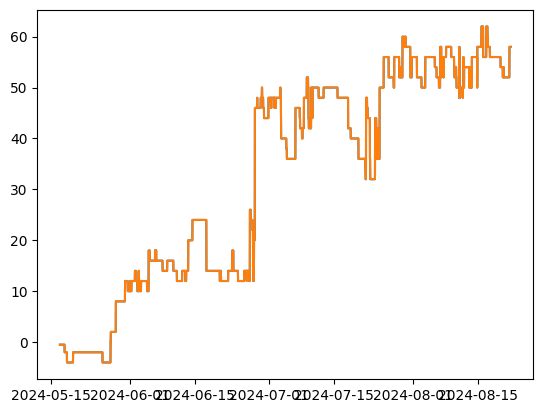

In [214]:
## interpolate simba_sfc to have same timesteps as rest of simba data
sfc_seconds_all = np.asarray([(t-dt(1970,1,1)).total_seconds() for t in simba_sfc_dates])
simba_seconds_all = np.asarray([(t-dt(1970,1,1)).total_seconds() for t in season_data['dates']])

## surface looks too low here
plt.plot(simba_sfc_dates, simba_sfc_in, label='og')
# simba_sfc_in = np.ma.masked_where((simba_sfc_dates>=dt(2024,7,4,1))&(simba_sfc_dates<dt(2024,7,7,2)), simba_sfc_in)
# simba_sfc_in = np.ma.masked_where((simba_sfc_dates>=dt(2024,7,17,1))&(simba_sfc_in<45), simba_sfc_in)

plt.plot(simba_sfc_dates, simba_sfc_in, label='og masked')

f_sfc = interpolate.interp1d(sfc_seconds_all, simba_sfc_in, fill_value=-999, bounds_error=False)
simba_sfc_all = f_sfc(simba_seconds_all)
simba_sfc_all = np.ma.masked_equal(simba_sfc_all, -999)

## need to round
simba_sfc_all = round_down_to_even(np.squeeze(simba_sfc_all))
plt.show()

In [215]:
sleigh_vars = ['up_short_hemisp_qc','up_long_hemisp_qc','down_short_hemisp_qc','down_long_hemisp_qc','subsurface_heat_flux_A_qc',
                  'subsurface_heat_flux_B_qc','skin_temp_surface_qc','temp_qc','snow_depth_qc','zenith_true_qc',
                  'down_short_diffuse','down_short_direct','up_short_hemisp','up_long_hemisp','down_short_hemisp','down_long_hemisp',
                  'snow_depth','temp','brightness_temp_surface','skin_temp_surface','subsurface_heat_flux_A','subsurface_heat_flux_B',
                  'subsurface_heat_flux_C','zenith_true','snow_gpr_dist','base_time','time']

asfs_data_lev2 = load_raven_sleigh_data(sleigh_vars)

In [216]:
data = np.genfromtxt('/home/asledd/ICECAPS/preliminary_raven_winds_icecaps_2024May20th_2024July23rd.csv', delimiter=',',
                         usecols=(0,5), dtype=None, encoding='utf-8')
raw_wind_spd = np.array(data[1:,1])
raw_wind_spd[np.where(raw_wind_spd=='')] = -999
raw_wind_spd = raw_wind_spd.astype(np.float32)

raw_wind_dates = np.asarray([dt.strptime(d, '%Y-%m-%d %H:%M:%S') for d in data[1:,0]])


## It's annoying to have the winds with different time steps, make it match the sleigh dates

wind_spd = []

for date in asfs_data_lev2['dates']:
    
    if date in raw_wind_dates:
        wind_spd.append(raw_wind_spd[np.where(date==raw_wind_dates)[0]][0])
    else:
        wind_spd.append(-999)

wind_spd_all = np.ma.masked_equal(wind_spd, -999)

### Set up data that gets reused and the indices for comparisons

In [217]:
simba_depths = season_data['initial_height']
simba_dates_all = season_data['dates']
sleigh_dates_all = asfs_data_lev2['dates']

sleigh_seconds_all = datetimes_to_seconds(sleigh_dates_all)
simba_seconds_all = datetimes_to_seconds(simba_dates_all)

simba_temps_all = season_data['temperature']
swn_all = asfs_data_lev2['net_short_hemisp']
sleigh_skin_all = asfs_data_lev2['skin_temp']

In [218]:
## get same time intervals
sleigh_idx = np.where((sleigh_dates_all>dt(2024,5,20))&(sleigh_dates_all<dt(2024,7,24)))[0]
imb_idx = np.where((simba_dates_all>dt(2024,5,20))&(simba_dates_all<dt(2024,7,24)))[0]


# print('LIMITING TO CONTINUOUS DATA')
# sleigh_idx = np.where((sleigh_dates>dt(2024,5,18))&(sleigh_dates<dt(2024,7,17)))[0]
# imb_idx = np.where((simba_dates>dt(2024,5,18))&(simba_dates<dt(2024,7,17)))[0]

In [219]:
simba_dates = simba_dates_all.copy()[imb_idx]
simba_temps = simba_temps_all.copy()[imb_idx,:]
simba_sfc = simba_sfc_all.copy()[imb_idx]

sleigh_dates = sleigh_dates_all.copy()[sleigh_idx]

sleigh_seconds = sleigh_seconds_all.copy()[sleigh_idx]
simba_seconds = simba_seconds_all.copy()[imb_idx]

swn = swn_all.copy()[sleigh_idx]
wind_spd = wind_spd_all.copy()[sleigh_idx]
sleigh_skin = sleigh_skin_all.copy()[sleigh_idx]

In [220]:
## the surface looks wrong on these dates
# masking_idx = np.where((simba_dates>=dt(2024,6,25))&(simba_dates<dt(2024,6,27)))
# filling_idx = np.where((simba_dates>=dt(2024,6,24))&(simba_dates<dt(2024,6,25)))
# simba_sfc[masking_idx] = simba_sfc[filling_idx].mean()

# masking_idx = np.where((simba_dates>=dt(2024,7,4))&(simba_dates<dt(2024,7,7)))
# filling_idx = np.where((simba_dates>=dt(2024,6,24))&(simba_dates<dt(2024,6,25)))
# simba_sfc[masking_idx] = simba_sfc[filling_idx].mean()

In [221]:
## for interpolating data that goes into correction
f_swn = interpolate.interp1d(sleigh_seconds[~swn.mask], swn[~swn.mask], 
                             fill_value=-999, bounds_error=False)

f_ws = interpolate.interp1d(sleigh_seconds[~wind_spd.mask], wind_spd[~wind_spd.mask], 
                            fill_value=-999, bounds_error=False)

### Functions that are specific to temp correction

In [29]:
def get_swt_for_correction(ks, fnir, swn_in, wspd_in, plt_fig=False):
    """ ks: extinction coefficient for visible radiation in snow
        fnir: fraction of SW that's in NIR range, as opposed to visible
        swn_in: SWN; 1D
        wspd: wind speed; 1D
    """
    
    # setup sw arrays
    dpths = np.arange(0,4.0,.02)
    dpths_2d = np.repeat(dpths[np.newaxis,:], swn_in.shape[0], axis=0)
    
    simba_swn_2d = np.repeat(swn_in[:,np.newaxis], dpths.shape[0], axis=1)
    simba_swn_2d = np.ma.masked_less(simba_swn_2d, 0)

    ## adding simba_skin in not properly just in order to see what it looks like in figure instead of depth below surface
    simba_skin_2d = np.repeat(simba_skin[:,np.newaxis], dpths.shape[0], axis=1)
    # simba_skin_2d = np.repeat(simba_albedo[:,np.newaxis], dpths.shape[0], axis=1)

    

    simba_wspd_2d = np.repeat(wspd_in[:,np.newaxis], dpths.shape[0], axis=1)

    ## calculate transmitted SW below surface
    if isinstance(ks, float):
        ks_vis = ks
    else:
        ks_vis = np.linspace(ks[0], ks[1], simba_swn_2d.shape[0])[:,np.newaxis]
        
    sw_abs, sw_trans = calc_sw_ext(simba_swn_2d, ks_vis, dpths_2d, f_nir=fnir)
    sw_trans = np.ma.masked_array(sw_trans, mask=simba_swn_2d.mask)

    if plt_fig:
        plt.plot(sw_trans[1020,:], -dpths_2d[0,:], marker='o')
        plt.ylabel('Distance form surface [m]')
        plt.xlabel('SW transmitted [Wm-2]')
        plt.grid(ls='--', alpha=.5)
        # plt.title('$\kappa_s$={:.0f}; NIR={:.2f}'.format(ks, fnir))
        plt.show()

    return sw_trans, simba_wspd_2d, simba_skin_2d

In [30]:
 def get_subsfc_above_zero_vals(dpths_in, swt_in, wspd2_in, sfc_in, sfc_dif, temp_in, melt_idx_in=False):
    
    sfc_used = sfc_in + sfc_dif
    
    ## could rewrite this to not use a for loop, would probably look like calc_temp_corrections()
    if isinstance(melt_idx_in, bool):
        indices = range(temp_in.shape[0])
    else:
        indices = melt_idx_in

    # print("now getting points above 0.5C")
    for idx in indices:
        
        example_profile = temp_in[idx,:]
    
        idx_sfc = sfc_used[idx]
        
        subsfc_idx = np.where(simba_depths[:-1]<=idx_sfc)[0] 
        example_profile = np.squeeze(example_profile[subsfc_idx])

        
        too_warm_idx = np.where(example_profile>0)[0]
    
        sw_abs_warm = swt_in[idx,:][too_warm_idx]
        wspd_warm = wspd2_in[idx,:][too_warm_idx]
        temp_warm = example_profile[too_warm_idx]

        simba_skin_warm = simba_skin_2d[idx,:][too_warm_idx]
        
        # if len(too_warm_idx)>5:
        #     plt.plot(example_profile, simba_depths[subsfc_idx], marker='o')
        #     plt.plot(temp_warm, simba_depths[subsfc_idx][too_warm_idx], c='r')
        #     plt.show()
        # print(abs(idx_sfc)-simba_depths[:-1][subsfc_idx][too_warm_idx][1:])
        ## still removing surface value
        if idx==indices[0]:
            all_subsfc_temps_above_f = temp_warm[1:]
            all_subsfc_swabs_above_f = sw_abs_warm[1:]
            all_subsfc_depths_f = abs(idx_sfc)-simba_depths[:-1][subsfc_idx][too_warm_idx][1:]
            # all_subsfc_depths_f = simba_depths[:-1][subsfc_idx][too_warm_idx][1:]+abs(idx_sfc)

            all_subsfc_wspd_f = wspd_warm[1:]
            all_simba_skin_f = simba_skin_warm[1:]

        else:
            all_subsfc_temps_above_f = np.ma.concatenate((all_subsfc_temps_above_f, temp_warm[1:]))
            all_subsfc_swabs_above_f = np.ma.concatenate((all_subsfc_swabs_above_f, sw_abs_warm[1:]))
            all_subsfc_depths_f = np.ma.concatenate((all_subsfc_depths_f, abs(idx_sfc)-simba_depths[:-1][subsfc_idx][too_warm_idx][1:]))
            # all_subsfc_depths_f = np.ma.concatenate((all_subsfc_depths_f, simba_depths[:-1][subsfc_idx][too_warm_idx][1:]+abs(idx_sfc)))
            all_subsfc_wspd_f = np.ma.concatenate((all_subsfc_wspd_f, wspd_warm[:-1]))
            all_simba_skin_f = np.ma.concatenate((all_simba_skin_f, simba_skin_warm[:-1]))

    return all_subsfc_temps_above_f, all_subsfc_swabs_above_f, all_subsfc_depths_f, all_subsfc_wspd_f, all_simba_skin_f

In [31]:
def get_ihs_correction(all_subsfc_wspd_in, all_subsfc_swabs_above_in, all_subsfc_temps_above_in, \
                       all_subsfc_depths_in, ks_in, wind_ranges=[0,5,10,25], plt_figs=False, curve='ihs', binval='max', p=90):
    max_wspd = []
    ihs_vals = []

    func_vals_a = []
    func_vals_b = []
    ihs_param_wind_regressions = {'bin':{} }
    
    # ## the sensitivity of these bins should be tested!!!!
    # sw_bin_params = {'width0':{15:1, 20:2, 25:1, 40:.1, 35:1, 30:1}, 
    #                  'width1':{15:10, 20:10, 25:15, 40:10, 35:10, 30:10}, 
    #                  'midpt':{15:15, 20:15, 25:10, 40:5, 35:10, 30:10}}
    
    # bins = np.ma.concatenate( (np.arange(0, sw_bin_params['midpt'][ks_in]+.01, sw_bin_params['width0'][ks_in]), 
    #                        np.arange(sw_bin_params['midpt'][ks_in], 70.01, sw_bin_params['width1'][ks_in])) ) # bins for absorbed SW at depth

    bins = np.percentile(all_subsfc_swabs_above_in[~all_subsfc_swabs_above_in.mask], np.arange(0,101,5))
    

    ## added this to be able to have overlapping bins of wind speed
    if not isinstance(wind_ranges[0], tuple):
        loop_winds = [(wl, wh) for wl, wh in zip(wind_ranges[:-1],wind_ranges[1:])]
    else:
        loop_winds = wind_ranges

    ## add plots to check!
    if plt_figs:
        # cmap = plt.cm.turbo
        cmap = cmocean.cm.haline
        color_list = ['r','gold','mediumorchid','skyblue', 'yellowgreen']

        subf = len(loop_winds)
        fig, axs = plt.subplots(1,subf, figsize=(1+3*subf,4), constrained_layout=True, sharey=True, sharex=True)
        fig2, ax2 = plt.subplots(1, constrained_layout=True, figsize=(4,4))
        
    # for i,(w_lo, w_hi) in enumerate(zip(wind_ranges[:-1],wind_ranges[1:])):
    for i,(w_lo, w_hi) in enumerate(loop_winds):

        w_idx = np.where((all_subsfc_wspd_in>=w_lo)&(all_subsfc_wspd_in<w_hi))
        sw_wind = all_subsfc_swabs_above_in[w_idx]
        temp_wind = all_subsfc_temps_above_in[w_idx]

        ## mask values at depths where there isn't SW
        # print(temp_wind.count())
        # temp_wind = np.ma.masked_where(sw_wind<0.01, temp_wind)

        ## exact choice of percentiles vs max vs whatever can be tested
        if binval=='max':
            bin_xs, bin_ys = get_max_bin_vals(sw_wind, temp_wind, bins)
        elif binval=='percentile':
            bin_xs, bin_ys = get_percentile_bin_vals(sw_wind, temp_wind, bins, p=p)

        ## force (0,0) point
        bin_xs = np.ma.concatenate( ([0],bin_xs) )
        bin_ys = np.ma.concatenate( ([0],bin_ys) )
    
        bin_xs = np.squeeze(bin_xs[~bin_ys.mask])
        bin_ys = np.squeeze(bin_ys[~bin_ys.mask])

        # if curve=='ihs':
        # IHS fit
        popt, pcov = curve_fit(inverse_hyperbolic_sine, bin_xs, bin_ys)
        
        # Extract the fitted parameter
        theta_fit = popt[0]
        ihs_vals.append(theta_fit)
        # print(w_lo, theta_fit)
        # max_wspd.append(w_lo)   
        max_wspd.append(np.ma.median(all_subsfc_wspd_in[w_idx]))

        ihs_param_wind_regressions['bin'][(w_lo, w_hi)] = theta_fit

        # another curve equation
        popt, pcov = curve_fit(func, bin_xs, bin_ys)
    
        # Extract the fitted parameter
        a_fit = popt[0]
        b_fit = popt[1]
    
        func_vals_a.append(a_fit)
        func_vals_b.append(b_fit)
        
        y_fit = func(bin_xs, a_fit, b_fit)

        ## exponential fit
        # popt, pcov = curve_fit(exponential_func, bin_xs, bin_ys, p0=[1, 1, 1])
        # y_fit = exponential_func(bin_xs, popt[0], popt[1], popt[2])


        if plt_figs:
            cb = axs[i].scatter(sw_wind, temp_wind, 
                    c=all_subsfc_depths_in[w_idx], vmin=-20, vmax=0, cmap=cmap)
            axs[i].plot(bin_xs, bin_ys, c='k', marker='o')

            # y_fit = inverse_hyperbolic_sine(bin_xs, theta_fit)
            axs[i].plot(bin_xs, y_fit, c='r', marker='^')
            # axs[i].plot(bin_xs, y_fit, c='k', marker='*')
            col = plt.cm.turbo(i/len(wind_ranges))
            ax2.plot(bin_xs, y_fit, marker='o', label='{:.0f}-{:.0f} m/s'.format(w_lo, w_hi), c=col)
        
            
            axs[i].set_title('wind speed: {:.0f}-{:.0f} m/s'.format(w_lo, w_hi))
            axs[i].grid(alpha=.5, ls='--')
            axs[i].set_xlabel('Transmitted SW [W m-2]')
            axs[i].set_ylabel('Temperature [C]')
    
    ## now take those curves and generalize to all wind speeds

    # save for later
    par = np.polyfit(max_wspd, ihs_vals, 1, full=True)
    ihs_param_wind_regressions['slope'] = par[0][0]
    ihs_param_wind_regressions['intercept'] = par[0][1]
    
    try:
        t, c, k = interpolate.splrep(max_wspd, ihs_vals, k=1)
        spline = interpolate.BSpline(t, c, k, extrapolate=True)
        ihs_param_wind_regressions['spline'] = spline
    except:
        ihs_param_wind_regressions['spline'] = None

    # generalize to all wind speeds
    func_param_wind_regressions = {}
    labels = ['a','b']
    for yvals, yl in zip([func_vals_a, func_vals_b], labels):
        # save for later
        par = np.polyfit(max_wspd, yvals, 1, full=True)
        func_param_wind_regressions[yl] = {'slope':par[0][0], 'intercept':par[0][1]}

        try:
            t, c, k = interpolate.splrep(max_wspd, yvals, k=2)
            spline = interpolate.BSpline(t, c, k, extrapolate=True)
            func_param_wind_regressions[yl]['spline'] = spline
        except:
            func_param_wind_regressions[yl]['spline'] = None

    if plt_figs:
        plt.colorbar(cb, label='Depth below surface [cm]', ax=axs[-1])
        # fig.suptitle('$\kappa_s$={:.0f}'.format(ks_in))
        
        ax2.grid(alpha=.5, ls='--')
        ax2.set_xlabel('Transmitted SW [W m-2]')
        ax2.set_ylabel('Temperature [C]')
        ax2.legend(loc='best')#, bbox_to_anchor=(1.,.6))
        # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig1_20ks_0.5nir_-6sfc.png', dpi=250)
        # fig.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig5_20ks_0.5nir_-6sfc.png', dpi=250)
        # fig.savefig(sfc_fig_savepath+f'solar_correction_SWT-temp-wspd-bins_{sfc_dif_i}sfcdif_{ks_i}ks_{fnir_i}nir_sfc-{var_version}.png', dpi=250)
        plt.show()

    if curve=='ihs':
        exmaple_sw = np.arange(0,60)

        fig, axs = plt.subplots(1,2, figsize=(8,4), constrained_layout=True, sharey=True)
        
        for wspd in range (0,18,2):
            
            # linear fit for theta parameters
            theta = ihs_param_wind_regressions['slope']*wspd+ihs_param_wind_regressions['intercept']  
            # print(wspd, theta)
            col = plt.cm.viridis(wspd/16.)
            axs[0].plot(exmaple_sw, np.abs(inverse_hyperbolic_sine(exmaple_sw, theta)), label='{:.0f} m/s'.format(wspd), c=col, lw=2)
        
            # spline fit for theta parameters
            theta = ihs_param_wind_regressions['spline'](wspd)
            # print(theta)
            # print()
            col = plt.cm.viridis(wspd/16.)
            axs[1].plot(exmaple_sw, np.abs(inverse_hyperbolic_sine(exmaple_sw, theta)), label='{:.0f} m/s ({:.1f})'.format(wspd, theta), c=col, lw=2)
            
        ## how to remove negative output???
        axs[1].legend(loc='center left', bbox_to_anchor=(1,.6))
        
        for ax, fit in zip(axs.ravel(),['linear', 'spline']):
            # ax.set_ylim(0,5.5)
            ax.grid(alpha=.5, ls='--')
            ax.set_xlabel('Transmitted SW [W m-2]')
            ax.set_ylabel('Temperature correction [deg]')
            ax.set_title(fit)
            
        fig.suptitle('Inverse Hyperbolic Sine Fit')
        # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig2_20ks_0.5nir_-6sfc.png', dpi=250)
        # fig.savefig(sfc_fig_savepath+f'solar_correction_wspd-correction-curves_{sfc_dif_i}sfcdif_{ks_i}ks_{fnir_i}nir_sfc-{var_version}.png', dpi=250)

        # plt.tight_layout()
        plt.show()

        ## scatter plot of theta/ihs parameter vs wind speed
        fig, ax = plt.subplots(1, figsize=(3,3))
        ax.scatter(max_wspd, ihs_vals)
        ax.grid(alpha=.5, ls='--')
        ax.set_xlabel('Median wind speed in bin [m/s]')
        ax.set_ylabel('IHS parameter')
        plt_par = np.polyfit(max_wspd, ihs_vals, 1, full=True)
        try:
            plt_t, plt_c, plt_k = interpolate.splrep(max_wspd, ihs_vals, k=2)
            plt_spline = interpolate.BSpline(plt_t, plt_c, plt_k, extrapolate=True)
            plt.plot(max_wspd, plt_par[0][0]*np.array(max_wspd)+plt_par[0][1], c='r')
            ax.plot(max_wspd, plt_spline(max_wspd), c='purple')
        except:
            print('incorrect wind speed bins for spline!')
        
        # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig3_20ks_0.5nir_-6sfc.png', dpi=250)

        plt.show()
        # print(ihs_param_wind_regressions)
        return ihs_param_wind_regressions
    
        
    elif curve=='func':
        exmaple_sw = np.arange(0,60)
        fig, axs = plt.subplots(1,2, figsize=(8,4), constrained_layout=True, sharey=True)
        
        
        for wspd in range (0,6,2):
        # for wspd in range (0,18,2):
            log_a = func_param_wind_regressions['a']['slope']*wspd+func_param_wind_regressions['a']['intercept']
            log_b = func_param_wind_regressions['b']['slope']*wspd+func_param_wind_regressions['b']['intercept']
        
            col = plt.cm.viridis(wspd/16.)
            axs[0].plot(exmaple_sw, func(exmaple_sw, log_a, log_b), label='{:.0f} m/s'.format(wspd), c=col, lw=2)
        
        
            # spline fit for theta parameters
            par_a = func_param_wind_regressions['a']['spline'](wspd)
            par_b = func_param_wind_regressions['b']['spline'](wspd)
        
            col = plt.cm.viridis(wspd/16.)
            # axs[1].plot(exmaple_sw, np.abs(inverse_hyperbolic_sine(exmaple_sw, theta)), label='{:.0f} m/s'.format(wspd), c=col, lw=2)
            axs[1].plot(exmaple_sw, func(exmaple_sw, par_a, par_b), label='{:.0f} m/s'.format(wspd), c=col, lw=2)
        
        
        axs[1].legend(loc='center left', bbox_to_anchor=(1,.6))
        
        for ax, fit in zip(axs.ravel(),['linear', 'spline']):
            # ax.set_ylim(0,5.5)
            ax.grid(alpha=.5, ls='--')
            ax.set_xlabel('Transmitted SW [W m-2]')
            ax.set_ylabel('Temperature correction [deg]')
            ax.set_title(fit)
            
        # plt.tight_layout()
        fig.suptitle('f(x)=b*x/(a+x) fit')
        plt.show()

    # elif curve=='arctan':
        

        return func_param_wind_regressions

In [32]:
def get_linear_correction(all_subsfc_wspd_in, all_subsfc_swabs_above_in, all_subsfc_temps_above_in, \
                       all_subsfc_depths_in, ks_in, wind_ranges=[0,5,10,25], plt_figs=False, curve='ihs', binval='max', p=90):
    max_wspd = []
    ihs_vals = []

    func_vals_a = []
    func_vals_b = []

    lin_vals_m = []
    lin_vals_b = []
    
    ihs_param_wind_regressions = {'bin':{} }

    bins = np.percentile(all_subsfc_swabs_above_in[~all_subsfc_swabs_above_in.mask], np.arange(0,101,20))
    

    ## added this to be able to have overlapping bins of wind speed
    if not isinstance(wind_ranges[0], tuple):
        loop_winds = [(wl, wh) for wl, wh in zip(wind_ranges[:-1],wind_ranges[1:])]
    else:
        loop_winds = wind_ranges

    ## add plots to check!
    if plt_figs:
        # cmap = plt.cm.turbo
        cmap = cmocean.cm.haline
        color_list = ['r','gold','mediumorchid','skyblue', 'yellowgreen']

        subf = len(loop_winds)
        fig, axs = plt.subplots(1,subf, figsize=(1+3*subf,4), constrained_layout=True, sharey=True, sharex=True)
        fig2, ax2 = plt.subplots(1, constrained_layout=True, figsize=(4,4))
        
    # for i,(w_lo, w_hi) in enumerate(zip(wind_ranges[:-1],wind_ranges[1:])):

    for i,(w_lo, w_hi) in enumerate(loop_winds):

        w_idx = np.where((all_subsfc_wspd_in>=w_lo)&(all_subsfc_wspd_in<w_hi))
        sw_wind = all_subsfc_swabs_above_in[w_idx]
        temp_wind = all_subsfc_temps_above_in[w_idx]

        ## exact choice of percentiles vs max vs whatever can be tested
        bin_xs, bin_ys = get_percentile_bin_vals(sw_wind, temp_wind, bins, p=p)

        ## force (0,0) point
        bin_xs = np.ma.concatenate( ([0],bin_xs) )
        bin_ys = np.ma.concatenate( ([0],bin_ys) )
    
        bin_xs = np.squeeze(bin_xs[~bin_ys.mask])
        bin_ys = np.squeeze(bin_ys[~bin_ys.mask])

        # if curve=='ihs':
        # IHS fit
        popt, pcov = curve_fit(inverse_hyperbolic_sine, bin_xs, bin_ys)
        
        # Extract the fitted parameter
        theta_fit = popt[0]
        ihs_vals.append(theta_fit)
  
        max_wspd.append(np.ma.median(all_subsfc_wspd_in[w_idx]))

        ihs_param_wind_regressions['bin'][(w_lo, w_hi)] = theta_fit


        popt, pcov = curve_fit(linear_func, bin_xs, bin_ys)

        
        # another curve equation
        popt, pcov = curve_fit(func, bin_xs, bin_ys)
    
        # Extract the fitted parameter
        m_fit = popt[0]
        b_fit = popt[1]
    
        lin_vals_m.append(m_fit)
        lin_vals_b.append(b_fit)
        
        y_fit = linear_func(bin_xs, m_fit, b_fit)
        print('linear', popt, bin_ys.max())

        ## exponential fit
        # popt, pcov = curve_fit(exponential_func, bin_xs, bin_ys, p0=[1, 1, 1])
        # y_fit = exponential_func(bin_xs, popt[0], popt[1], popt[2])


        if plt_figs:
            # cb = axs[i].scatter(sw_wind, temp_wind, 
            #         c=all_subsfc_depths_in[w_idx], vmin=-20, vmax=0, cmap=cmap)
            cb = axs[i].scatter(bin_xs, bin_ys, )
                    # c=all_subsfc_depths_in[w_idx], vmin=-20, vmax=0, cmap=cmap)
            
            axs[i].plot(bin_xs, bin_ys, c='k', marker='o')

            # y_fit = inverse_hyperbolic_sine(bin_xs, theta_fit)
            axs[i].plot(bin_xs, y_fit, c='r', marker='^')
            # axs[i].plot(bin_xs, y_fit, c='k', marker='*')
            col = plt.cm.turbo(i/len(wind_ranges))
            ax2.plot(bin_xs, y_fit, marker='o', label='{:.0f}-{:.0f} m/s'.format(w_lo, w_hi), c=col)
        
            
            axs[i].set_title('wind speed: {:.0f}-{:.0f} m/s'.format(w_lo, w_hi))
            axs[i].grid(alpha=.5, ls='--')
            axs[i].set_xlabel('Transmitted SW [W m-2]')
            axs[i].set_ylabel('Temperature [C]')



    ## now take those curves and generalize to all wind speeds

    # save for later
    par = np.polyfit(max_wspd, ihs_vals, 1, full=True)
    ihs_param_wind_regressions['slope'] = par[0][0]
    ihs_param_wind_regressions['intercept'] = par[0][1]
    
    try:
        t, c, k = interpolate.splrep(max_wspd, ihs_vals, k=1)
        spline = interpolate.BSpline(t, c, k, extrapolate=True)
        ihs_param_wind_regressions['spline'] = spline
    except:
        ihs_param_wind_regressions['spline'] = None

    # generalize to all wind speeds
    func_param_wind_regressions = {}
    labels = ['a','b']
    for yvals, yl in zip([func_vals_a, func_vals_b], labels):
        # save for later
        par = np.polyfit(max_wspd, yvals, 1, full=True)
        func_param_wind_regressions[yl] = {'slope':par[0][0], 'intercept':par[0][1]}

        try:
            t, c, k = interpolate.splrep(max_wspd, yvals, k=2)
            spline = interpolate.BSpline(t, c, k, extrapolate=True)
            func_param_wind_regressions[yl]['spline'] = spline
        except:
            func_param_wind_regressions[yl]['spline'] = None

    if plt_figs:
        plt.colorbar(cb, label='Depth below surface [cm]', ax=axs[-1])
        # fig.suptitle('$\kappa_s$={:.0f}'.format(ks_in))
        
        ax2.grid(alpha=.5, ls='--')
        ax2.set_xlabel('Transmitted SW [W m-2]')
        ax2.set_ylabel('Temperature [C]')
        ax2.legend(loc='best')#, bbox_to_anchor=(1.,.6))
        # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig1_20ks_0.5nir_-6sfc.png', dpi=250)
        # fig.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig5_20ks_0.5nir_-6sfc.png', dpi=250)
        # fig.savefig(sfc_fig_savepath+f'solar_correction_SWT-temp-wspd-bins_{sfc_dif_i}sfcdif_{ks_i}ks_{fnir_i}nir_sfc-{var_version}.png', dpi=250)
        plt.show()

    if curve=='ihs':
        exmaple_sw = np.arange(0,60)

        fig, axs = plt.subplots(1,2, figsize=(8,4), constrained_layout=True, sharey=True)
        
        for wspd in range (0,18,2):
            
            # linear fit for theta parameters
            theta = ihs_param_wind_regressions['slope']*wspd+ihs_param_wind_regressions['intercept']  
            # print(wspd, theta)
            col = plt.cm.viridis(wspd/16.)
            axs[0].plot(exmaple_sw, np.abs(inverse_hyperbolic_sine(exmaple_sw, theta)), label='{:.0f} m/s'.format(wspd), c=col, lw=2)
        
            # spline fit for theta parameters
            theta = ihs_param_wind_regressions['spline'](wspd)
            # print(theta)
            # print()
            col = plt.cm.viridis(wspd/16.)
            axs[1].plot(exmaple_sw, np.abs(inverse_hyperbolic_sine(exmaple_sw, theta)), label='{:.0f} m/s ({:.1f})'.format(wspd, theta), c=col, lw=2)
            
        ## how to remove negative output???
        axs[1].legend(loc='center left', bbox_to_anchor=(1,.6))
        
        for ax, fit in zip(axs.ravel(),['linear', 'spline']):
            # ax.set_ylim(0,5.5)
            ax.grid(alpha=.5, ls='--')
            ax.set_xlabel('Transmitted SW [W m-2]')
            ax.set_ylabel('Temperature correction [deg]')
            ax.set_title(fit)
            
        fig.suptitle('Inverse Hyperbolic Sine Fit')
        # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig2_20ks_0.5nir_-6sfc.png', dpi=250)
        # fig.savefig(sfc_fig_savepath+f'solar_correction_wspd-correction-curves_{sfc_dif_i}sfcdif_{ks_i}ks_{fnir_i}nir_sfc-{var_version}.png', dpi=250)

        # plt.tight_layout()
        plt.show()

        ## scatter plot of theta/ihs parameter vs wind speed
        fig, ax = plt.subplots(1, figsize=(3,3))
        ax.scatter(max_wspd, ihs_vals)
        ax.grid(alpha=.5, ls='--')
        ax.set_xlabel('Median wind speed in bin [m/s]')
        ax.set_ylabel('IHS parameter')
        plt_par = np.polyfit(max_wspd, ihs_vals, 1, full=True)
        try:
            plt_t, plt_c, plt_k = interpolate.splrep(max_wspd, ihs_vals, k=2)
            plt_spline = interpolate.BSpline(plt_t, plt_c, plt_k, extrapolate=True)
            plt.plot(max_wspd, plt_par[0][0]*np.array(max_wspd)+plt_par[0][1], c='r')
            ax.plot(max_wspd, plt_spline(max_wspd), c='purple')
        except:
            print('incorrect wind speed bins for spline!')
        
        # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig3_20ks_0.5nir_-6sfc.png', dpi=250)

        plt.show()
        # print(ihs_param_wind_regressions)
        return ihs_param_wind_regressions
    
        


In [33]:
def get_func_correction(all_subsfc_wspd_in, all_subsfc_swabs_above_in, all_subsfc_temps_above_in, \
                       all_subsfc_depths_in, ks_in, wind_ranges=[0,3,6,25], plt_figs=False, binval='max', p=90):
    max_wspd = []
    ihs_vals = []

    func_vals_a = []
    func_vals_b = []

    bins = np.percentile(all_subsfc_swabs_above_in[~all_subsfc_swabs_above_in.mask], np.arange(0,101,5))

    ## instead of regressing, will just bin
    func_param_wind_regressions = {}

    ## added this to be able to have overlapping bins of wind speed
    if not isinstance(wind_ranges[0], tuple):
        loop_winds = [(wl, wh) for wl, wh in zip(wind_ranges[:-1],wind_ranges[1:])]
    else:
        loop_winds = wind_ranges

    ## add plots to check!
    if plt_figs:
        # cmap = plt.cm.turbo
        cmap = cmocean.cm.haline
        color_list = ['r','gold','mediumorchid','skyblue', 'yellowgreen']

        subf = len(loop_winds)
        fig, axs = plt.subplots(1,subf, figsize=(1+4*subf,4), constrained_layout=True, sharey=True, sharex=True)
        fig2, ax2 = plt.subplots(1, constrained_layout=True, figsize=(4,4))
        
    # for i,(w_lo, w_hi) in enumerate(zip(wind_ranges[:-1],wind_ranges[1:])):
    for i,(w_lo, w_hi) in enumerate(loop_winds):

        w_idx = np.where((all_subsfc_wspd_in>=w_lo)&(all_subsfc_wspd_in<w_hi))
        sw_wind = all_subsfc_swabs_above_in[w_idx]
        temp_wind = all_subsfc_temps_above_in[w_idx]

        ## mask values at depths where there isn't SW
        # print(temp_wind.count())
        # temp_wind = np.ma.masked_where(sw_wind<0.01, temp_wind)

        ## exact choice of percentiles vs max vs whatever can be tested
        if binval=='max':
            bin_xs, bin_ys = get_max_bin_vals(sw_wind, temp_wind, bins)
        elif binval=='percentile':
            bin_xs, bin_ys = get_percentile_bin_vals(sw_wind, temp_wind, bins, p=p)

        ## force (0,0) point
        bin_xs = np.ma.concatenate( ([0],bin_xs) )
        bin_ys = np.ma.concatenate( ([0],bin_ys) )
    
        bin_xs = np.squeeze(bin_xs[~bin_ys.mask])
        bin_ys = np.squeeze(bin_ys[~bin_ys.mask])


        # another curve equation
        # print(np.shape(bin_xs), np.shape(bin_ys))
        popt, pcov = curve_fit(func, bin_xs[~bin_ys.mask], bin_ys[~bin_ys.mask])
    
        # Extract the fitted parameter
        a_fit = popt[0]
        b_fit = popt[1]
    
        func_vals_a.append(a_fit)
        func_vals_b.append(b_fit)
        
        # y_fit = func(bin_xs, a_fit, b_fit)
        y_fit = func(bins, a_fit, b_fit)

        ## save for later
        func_param_wind_regressions[(w_lo, w_hi)] = (a_fit, b_fit)

        if plt_figs:
            print(all_subsfc_swabs_above_in.shape, sw_wind.shape, sleigh_skinT_times.shape)
            cb = axs[i].scatter(sw_wind, temp_wind, 
                    # c=all_subsfc_depths_in[w_idx], vmin=-20, vmax=0, cmap=cmap)
                                # c=all_simba_skin_out[w_idx]-273.15, vmin=-5, vmax=1, cmap=plt.cm.turbo, alpha=.5)
                                c=all_simba_skin_out[w_idx], vmin=0.7, vmax=1, cmap=plt.cm.turbo, alpha=.5)

            axs[i].plot(bin_xs, bin_ys, c='k', marker='o', label='85th percentile of bin')

            # y_fit = inverse_hyperbolic_sine(bin_xs, theta_fit)
            axs[i].plot(bin_xs, y_fit, c='r', marker='^', label='function fit')
            # axs[i].plot(bin_xs, y_fit, c='k', marker='*')
            col = plt.cm.turbo(i/len(wind_ranges))
            ax2.plot(bin_xs, y_fit, marker='o', label='{:.0f}-{:.0f} m/s'.format(w_lo, w_hi), c=col)
        
            
            axs[i].set_title('wind speed: {:.0f}-{:.0f} m/s'.format(w_lo, w_hi))
            axs[i].grid(alpha=.5, ls='--')
            axs[i].set_xlabel('Transmitted SW [W m$^{-2}$]')
            axs[i].set_ylabel('Temperature [$^o$C]')
    


    if plt_figs:
        plt.colorbar(cb, label='Depth below surface [cm]', ax=axs[-1])
        # fig.suptitle('$\kappa_s$={:.0f}'.format(ks_in))
        
        ax2.grid(alpha=.5, ls='--')
        ax2.set_xlabel('Transmitted SW [W m$^{-2}$]')
        ax2.set_ylabel('Temperature [$^o$C]')
        ax2.legend(loc='best')#, bbox_to_anchor=(1.,.6))
        # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig1_20ks_0.5nir_-6sfc.png', dpi=250)
        # fig.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig5_20ks_0.5nir_-6sfc.png', dpi=250)
        axs[-1].legend(loc='upper right')
        # fig.savefig(plrams_fpath+'SIMBA_solar-correction_SWT-temp-regression.png', dpi=300)

        plt.show()


    # exmaple_sw = np.arange(0,60)
    # fig, axs = plt.subplots(1,2, figsize=(8,4), constrained_layout=True, sharey=True)
    
    
    # for wspd in range (0,6,2):
    # # for wspd in range (0,18,2):
    #     log_a = func_param_wind_regressions['a']['slope']*wspd+func_param_wind_regressions['a']['intercept']
    #     log_b = func_param_wind_regressions['b']['slope']*wspd+func_param_wind_regressions['b']['intercept']
    
    #     col = plt.cm.viridis(wspd/16.)
    #     axs[0].plot(exmaple_sw, func(exmaple_sw, log_a, log_b), label='{:.0f} m/s'.format(wspd), c=col, lw=2)
    
    
    #     # spline fit for theta parameters
    #     par_a = func_param_wind_regressions['a']['spline'](wspd)
    #     par_b = func_param_wind_regressions['b']['spline'](wspd)
    
    #     col = plt.cm.viridis(wspd/16.)
    #     # axs[1].plot(exmaple_sw, np.abs(inverse_hyperbolic_sine(exmaple_sw, theta)), label='{:.0f} m/s'.format(wspd), c=col, lw=2)
    #     axs[1].plot(exmaple_sw, func(exmaple_sw, par_a, par_b), label='{:.0f} m/s'.format(wspd), c=col, lw=2)
    
    
    # axs[1].legend(loc='center left', bbox_to_anchor=(1,.6))
    
    # for ax, fit in zip(axs.ravel(),['linear', 'spline']):
    #     # ax.set_ylim(0,5.5)
    #     ax.grid(alpha=.5, ls='--')
    #     ax.set_xlabel('Transmitted SW [W m-2]')
    #     ax.set_ylabel('Temperature correction [deg]')
    #     ax.set_title(fit)
        
    # # plt.tight_layout()
    # fig.suptitle('f(x)=b*x/(a+x) fit')
    # plt.show()

    
    # print(func_param_wind_regressions)
    return func_param_wind_regressions

In [34]:
def calc_temp_corrections(sfc_in, sfc_dif, ks, fnir, sw_in, dpths_in, correction_params, plt_figs=False, param_interp='linear', swt=False, curve='ihs'):
    ## differenceing surface here!!!!
    sfc_used = sfc_in + sfc_dif
    
    # make simba heights/depths relative to surface
    depths_rel_to_sfc = np.repeat(dpths_in[np.newaxis,:], sfc_in.shape[0], axis=0)
    
    sfc_height_2d = np.repeat(sfc_used[:,np.newaxis], dpths_in.shape[0], axis=1)

    # depths_rel_to_sfc = depths_rel_to_sfc + abs(sfc_height_2d)
    depths_rel_to_sfc = depths_rel_to_sfc - sfc_height_2d

    depths_rel_to_sfc = np.ma.masked_greater(depths_rel_to_sfc, 0)/100.
    # print(depths_rel_to_sfc)
    # print()
    simba_swn_2d = np.repeat(sw_in[:,np.newaxis], depths_rel_to_sfc.shape[1], axis=1)

    if isinstance(ks, float):
        ks_vis = ks
    else:
        ks_vis = np.linspace(ks[0], ks[1], simba_swn_2d.shape[0])[:,np.newaxis]
        
    simba_swa, simba_swt = calc_sw_ext(simba_swn_2d, ks_vis, depths_rel_to_sfc, f_nir=fnir)

    # simba_swa = np.ma.masked_array(simba_swa, mask=depths_rel_to_sfc.mask)
    simba_swt = np.ma.masked_array(simba_swt, mask=depths_rel_to_sfc.mask)
    
    wspd_2d_full = np.repeat(simba_wspd[:,np.newaxis], simba_swn_2d.shape[1], axis=1)
    wspd_2d_full = np.ma.masked_array(wspd_2d_full, mask=depths_rel_to_sfc.mask)

    if param_interp=='bin':
        if curve=='ihs':
            temp_correction = calc_ihs_temp_correct(simba_swt, wspd_2d_full, correction_params['bin'], fit=param_interp)
        else:
            temp_correction = calc_func_correct_bins(simba_swt, wspd_2d_full, correction_params)
    elif 'a' in correction_params:
        temp_correction = calc_func_temp_correct(simba_swt, wspd_2d_full, correction_params, fit=param_interp)
    else:    
        temp_correction = calc_ihs_temp_correct(simba_swt, wspd_2d_full, correction_params, fit=param_interp)

    if plt_figs:
        fig, axs = plt.subplots(2, figsize=(10,8), sharex=True, sharey=True)
        print(simba_dates.shape, simba_depths.shape, simba_swt.shape)
        cb = axs[0].contourf(simba_dates, simba_depths, np.swapaxes(simba_swt,0,1), levels=np.linspace(-.01,60,11), extend='max')
        plt.colorbar(cb, label='transmitted sw [W m-2]', ax=axs[0])
        axs[0].set_ylabel('Depth from surface [m]')
        axs[0].plot(simba_dates, simba_sfc, label='interped', c='k')

        cb = axs[1].contourf(simba_dates, simba_depths, np.swapaxes(temp_correction,0,1), levels=np.arange(0,5.01,.5), extend='max')
        plt.colorbar(cb, label='temperature correction [deg]', ax=axs[1])
        axs[1].set_ylabel('Depth from surface [m]')
        axs[1].plot(simba_dates, simba_sfc, label='interped', c='k')

        # axs[0].set_ylim(-380,-320)
        # axs[0].set_xlim(dt(2024,6,1),dt(2024,6,25))
        # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig4_20ks_0.5nir_-6sfc.png', dpi=250)

        plt.show()

    if swt:
        # print(simba_swt.shape, temp_correction.shape)
        return temp_correction, simba_swt
    else:
        return temp_correction

In [35]:
def correct_compare_temp(temp_corrects, sfc_in, sfc_dif, ks, fnir, simba_temps_in, simba_dpths_in, fpath, \
                         out_correct_t=False, swi=False, d=11, m=7, summ_dates=(dt(2024,5,20), dt(2024,7,26))):
    sfc_used = sfc_in + sfc_dif

    sfc_repeat = np.repeat(sfc_used[:,np.newaxis], simba_temps_in.shape[1], axis=1)
    heights_repeat = np.repeat(simba_dpths_in[np.newaxis,:], simba_temps_in.shape[0], axis=0)
    sfc_seconds = np.repeat(simba_seconds[:,np.newaxis], simba_dpths_in.shape[0], axis=1)[np.where(heights_repeat==sfc_repeat)]
    
    corrected_temps = simba_temps_in - temp_corrects
    corrected_temps = np.ma.masked_where(heights_repeat>sfc_repeat, corrected_temps)
    
    # fig, axs = plt.subplots(2, figsize=(10,8), sharex=True, sharey=True)
    # cb = axs[0].contourf(simba_dates, simba_depths, np.swapaxes(simba_temps_in,0,1), levels=np.linspace(-20,0,11), extend='max')
    # plt.colorbar(cb, label='temperature uncorrected [deg]', ax=axs[0])
    # axs[0].set_ylabel('Depth from surface [m]')
    # axs[0].plot(simba_dates, simba_sfc, label='interped', c='k')

    # cb = axs[1].contourf(simba_dates, simba_depths, np.swapaxes(corrected_temps,0,1), levels=np.linspace(-20,0,11), extend='max')
    # plt.colorbar(cb, label='temperature corrected [deg]', ax=axs[1])
    # axs[1].set_ylabel('Depth from surface [m]')
    # axs[1].plot(simba_dates, simba_sfc, label='interped', c='k')

    # # axs[0].set_ylim(-380,-320)
    # # axs[0].set_xlim(dt(2024,6,1),dt(2024,6,25))
    # # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig4_20ks_0.5nir_-6sfc.png', dpi=250)

    # plt.show()

    ## interpolate skin temperature here
    # sleigh_skin = asfs_data_lev2['skin_temp']
    f_0_skinT = interpolate.interp1d(sleigh_seconds[~sleigh_skin.mask], sleigh_skin[~sleigh_skin.mask], fill_value=-999, bounds_error=False)
    sleigh_skinT_simba_timesteps = f_0_skinT(sfc_seconds)
    sleigh_skinT_simba_timesteps = np.ma.masked_less(sleigh_skinT_simba_timesteps, 0)-273.15

    uncorrected_simba_sfc_temp = simba_temps_in[np.where(heights_repeat==sfc_repeat)]
    corrected_simba_sfc_temp = corrected_temps[np.where(heights_repeat==sfc_repeat)]
    
    ## default is all summary included
    sfc_dates = simba_dates[np.where(heights_repeat==sfc_repeat)[0]]

    dummy_dates = np.ma.copy(sfc_dates)
    # print('dummy', dummy_dates.count(), dummy_dates, np.shape(dummy_dates))
    dummy_dates = np.ma.masked_outside(dummy_dates, summ_dates[0], summ_dates[1])
    # print('dummy', dummy_dates.count())

    uncorrected_simba_sfc_temp = np.ma.masked_array(uncorrected_simba_sfc_temp, mask=dummy_dates.mask)
    corrected_simba_sfc_temp = np.ma.masked_array(corrected_simba_sfc_temp, mask=dummy_dates.mask)

    fig, ax = plt.subplots(1,figsize=(10,6))
    # plt.plot(simba_dates[np.where(heights_repeat==sfc_repeat)[0]],sleigh_skinT_simba_timesteps, label='SLEIGH skin', c='k')
    plt.scatter(sfc_dates, uncorrected_simba_sfc_temp, label='UNcorrected simba', lw=1, ls='--', c='tab:blue', s=20)

    plt.scatter(sfc_dates, corrected_simba_sfc_temp, label='corrected simba', lw=1,  c='tab:orange', s=20)
    plt.scatter(sfc_dates, sleigh_skinT_simba_timesteps, label='SLEIGH skin', c='k', s=20)

    plt.legend(loc='best')
    plt.grid()
    plt.xlim(summ_dates)
    # plt.ylim(-40,2)
    # fig.savefig(sfc_fig_savepath+f'solar_correction_timeseries-sfc-skin-temps_{sfc_dif_i}sfcdif_{ks_i}ks_{fnir_i}nir_sfc-{var_version}.png', dpi=250)

    plt.show()

    if not isinstance(swi, bool):
        cb = plt.scatter(sleigh_skinT_simba_timesteps, corrected_simba_sfc_temp, c=swi[np.where(heights_repeat==sfc_repeat)])
        plt.colorbar(cb, label='SWT [W m-2]')
        plt.ylabel('Corrected SIMBA sfc temperature [C]')
        plt.xlabel('SLEIGH skin temperature [C]')
        plt.plot([sleigh_skinT_simba_timesteps.min(), sleigh_skinT_simba_timesteps.max()], 
                 [sleigh_skinT_simba_timesteps.min(), sleigh_skinT_simba_timesteps.max()], c='k')
        plt.grid(alpha=.5, ls='--')
        # plt.savefig(sfc_fig_savepath+f'solar_correction_scatter-skin-sfc-temps_{sfc_dif_i}sfcdif_{ks_i}ks_{fnir_i}nir_sfc-{var_version}.png', dpi=250)

        plt.show()
        
    ## summary figures here
    ## for comparisons
    output_summary = {'ts_diff_mean':{},'ts_diff_min':{},'ts_diff_max':{}, 'above_zero_count':{}, 'above_0.5_count':{}}

    fig = plt.figure(figsize=(7,7), constrained_layout=True)
    
    ax1 = plt.subplot2grid(shape=(2,2), loc=(0, 0), colspan=1)
    ax2 = plt.subplot2grid((2,2), (1, 0))
    ax3 = plt.subplot2grid(shape=(2,2), loc=(0, 1), rowspan=2)
    
    axs = [ax1, ax2, ax3]
    
    uncorrected_temps = np.ma.masked_array(simba_temps_in, mask=corrected_temps.mask)

    ## default is all summary included
    second_dummy_dates = np.ma.repeat(simba_dates[:,np.newaxis], uncorrected_temps.shape[1], axis=1)
    second_dummy_dates = np.ma.masked_outside(second_dummy_dates, summ_dates[0], summ_dates[1])

    # print(uncorrected_temps.count(),uncorrected_temps.shape, second_dummy_dates.shape)
    uncorrected_temps = np.ma.masked_array(uncorrected_temps, mask=second_dummy_dates.mask)
    corrected_temps = np.ma.masked_array(corrected_temps, mask=second_dummy_dates.mask)
    # print(uncorrected_temps.count())

    uncorrected_temps_positive = np.ma.masked_less(uncorrected_temps,0)
    corrected_temps_positive = np.ma.masked_less(corrected_temps, 0)
    uncorrected_temps_positive_uncert = np.ma.masked_less(uncorrected_temps,0.5)
    corrected_temps_positive_uncert = np.ma.masked_less(corrected_temps,0.5)
    # print('getting counts of temps>0')
    for simba_var, label in zip([uncorrected_temps_positive_uncert, corrected_temps_positive_uncert], ['uncorrected','corrected']):
        output_summary['above_0.5_count'][label] = simba_var.count()

    bins = np.arange(0,8.01,.5)
    for simba_var, label in zip([uncorrected_temps_positive, corrected_temps_positive], ['uncorrected','corrected']):

        axs[0].hist(simba_var[~simba_var.mask], alpha=.6, 
                label=label+' (total: {:.0f})'.format(simba_var.count()), bins=bins)
        output_summary['above_zero_count'][label] = simba_var.count()

    axs[0].set_ylabel('Counts')
    axs[0].set_xlabel('Temperature>0 below surface [deg]')
    axs[0].legend(loc='best')

    # print('getting difference between surface and skin temps')
    # print('shapes of simba and sleigh temps earlier', sleigh_skinT_simba_timesteps.shape, simba_dates.shape, sfc_used.shape, corrected_simba_sfc_temp.shape)

    for simba_var, label in zip([uncorrected_simba_sfc_temp, corrected_simba_sfc_temp], ['uncorrected','corrected']):
        # print(label)
        sfc_temp_diff = simba_var - sleigh_skinT_simba_timesteps
        # print(sfc_temp_diff.count())
        output_summary['ts_diff_mean'][label] = np.nanmean(sfc_temp_diff)
        # output_summary['ts_diff_min'][label] = sfc_temp_diff.min()
        # output_summary['ts_diff_max'][label] = sfc_temp_diff.max()
        # print(output_summary['ts_diff_mean'][label])

        axs[1].hist(sfc_temp_diff[~sfc_temp_diff.mask].flatten(), alpha=.6, label=label+' (mean: {:.1f})'.format(output_summary['ts_diff_mean'][label]),
                    bins=np.arange(-8,10,.5))
    
    axs[1].axvline(x=0, c='k', lw=1)
    axs[1].set_xlabel('SIMBA sfc -SLEIGH skin [deg]')
    axs[1].set_ylabel('Counts')
    axs[1].legend(loc='best')
    # print('plotting profiles of simba temps')

    sleigh_tskin_profile_comparison_steps = f_0_skinT(simba_seconds) - 273.15
    sleigh_tskin_profile_comparison_steps = np.ma.masked_equal(sleigh_tskin_profile_comparison_steps.copy(), -999)
    
    # print('shapes of simba and sleigh temps', sleigh_tskin_profile_comparison_steps.shape, simba_dates.shape, sfc_used.shape)
    ## other good days to check: 717-7/21; originially 7/11 
    for temp_data, c in zip([uncorrected_temps, corrected_temps], ['tab:blue','tab:orange']):
        st_date = dt(2024, m, d, 6)
        en_date = dt(2024, m, d, 16)
        figure_date_idx = np.where((np.asarray(simba_dates)>=st_date )&(np.asarray(simba_dates)<en_date ))[0]
    
        for i, t_idx in np.ndenumerate(figure_date_idx[1:]):
            axs[2].plot(np.squeeze(temp_data[t_idx, :-1]), simba_depths[:-1], label=t_idx, c=c)#'t=0')
            
            if c=='tab:orange':
                if not np.ma.is_masked(sfc_used[t_idx]):
                    axs[2].scatter(np.squeeze(sleigh_tskin_profile_comparison_steps[t_idx]), 
                                   np.squeeze(sfc_used[t_idx]), c='gray')
    
    axs[2].set_xlabel('Temperature [deg]')
    axs[2].set_ylabel('Depth [cm]')
    # axs[2].set_ylim(-340,-295)
    # axs[2].set_xlim(-7,7)
    axs[2].set_title(st_date.strftime('%Y-%m-%d %H:%M')+'-'+en_date.strftime('%H:%M'))
    axs[2].axvline(x=0, c='k', lw=1)
    axs[2].axvline(x=0.5, c='k', lw=1, ls='--')
    axs[2].axvline(x=1.5, c='k', lw=1, ls='--')

    for ax in axs:
        ax.grid(ls='--', alpha=.5)
    
    # axs[0].set_title('$\kappa_s$={:.0f}, NIR={:.2f}, $\Delta$ sfc={:.0f}cm'.format(ks, 1-fnir, sfc_dif))
    # plt.tight_layout()
    # fname = 'Raven_SIMBA_SW-correction_summary_IHS_{:.0f}ks_{:.2f}NIR_{:.0f}sfc_spline.png'.format(ks, 1-fnir, sfc_dif)
    # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_summary_20ks_0.5nir_-6sfc.png', dpi=250)
    # fig.savefig(sfc_fig_savepath+f'solar_correction_correct-temp-summary_{sfc_dif_i}sfcdif_{ks_i}ks_{fnir_i}nir_sfc-{var_version}.png', dpi=250)
    plt.show()
    # plt.close()


    ## new figure for Polar AMS poster: skin/surface temperatures and histogram of points>0
    # fig, axs = plt.subplots(1,2, figsize=(12,4), gridspec_kw=dict(width_ratios=[3,1]), constrained_layout=True)
    # axs[0].axhline(y=0, ls='--', c='darkgray')

    # axs[0].plot(sfc_dates, uncorrected_simba_sfc_temp, label='UNcorrected SIMBA', lw=1, c='dodgerblue')#, s=15)
    # axs[0].plot(sfc_dates, sleigh_skinT_simba_timesteps, label='SLEIGH T$_{skin}$', c='k')#, s=15)
    # axs[0].plot(sfc_dates, corrected_simba_sfc_temp, label='corrected SIMBA', lw=1,  c='darkorange')#, s=15)

    # axs[0].set_ylabel('Temperature [$^o$C]')
    # axs[0].legend(loc='best')
    # axs[0].xaxis.set_major_formatter(myFmt)
    # axs[0].set_xlabel('Month-day in 2024')
    # axs[0].set_xlim(dt(2024,5,20),dt(2024,7,26))

    # bins = np.arange(0,8.01,.5)
    # for simba_var, label, c in zip([uncorrected_temps_positive, corrected_temps_positive], ['UNcorrected','corrected'], ['dodgerblue','darkorange']):

    #     axs[1].hist(simba_var[~simba_var.mask], color=c,
    #             label=label+'\ntotal: {:.0f}'.format(simba_var.count()), bins=bins)
    #     output_summary['above_zero_count'][label] = simba_var.count()

    # axs[1].set_ylabel('Counts')
    # axs[1].set_xlabel('Temperature>$^o$0C below surface [$^o$0C]')
    # axs[1].legend(loc='best')

    # for ax in axs.ravel():
    #     ax.grid(ls='--', alpha=0.5)
    # # plt.tight_layout()
    # # fig.savefig(plrams_fpath+'SIMBA_solar-correction_UN-correct-comparison.png', dpi=300)
  
    # # plt.save()

    if out_correct_t:
        return output_summary, corrected_temps
    else:
        return output_summary

In [36]:
mc_fig_savepath = '/home/asledd/ICECAPS/simba_solar_correction_mc_figures/'

## Looping through variables to determine "best" values

/home/asledd/.conda/envs/plot_env/lib/python3.9/site-packages/numpy/lib/_function_base_impl.py:4968: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(


(0, 4) 5.558911166394382 72.92139614285713
(4, 25) 3.220004493527189 71.62813072182243


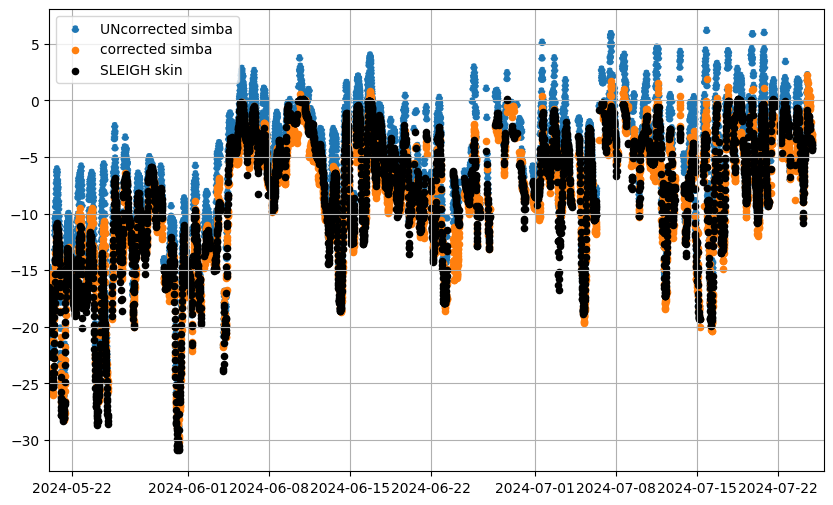

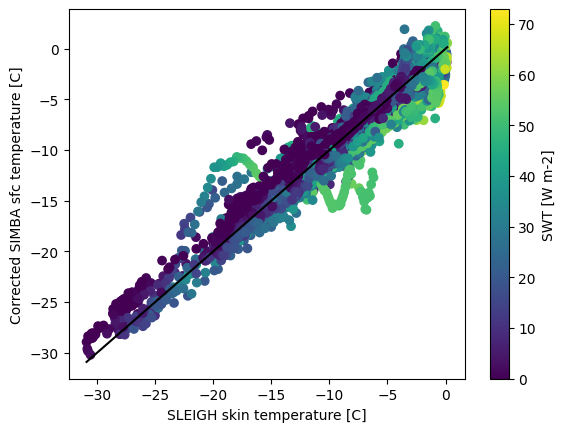

484604 (6527, 160) (6527, 160)
484604


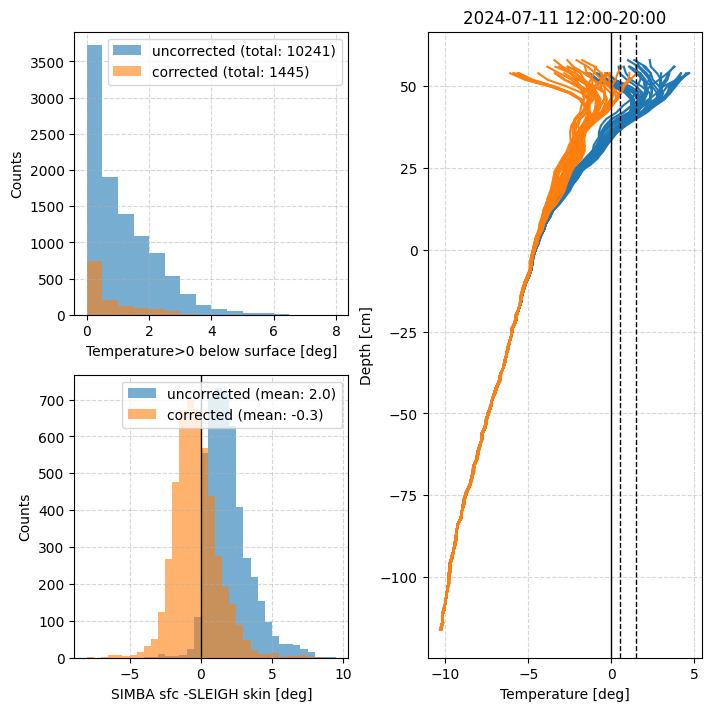

(0, 4) 5.55890909782864 91.15174517857142
(4, 25) 3.2200023395974915 89.53516340227803


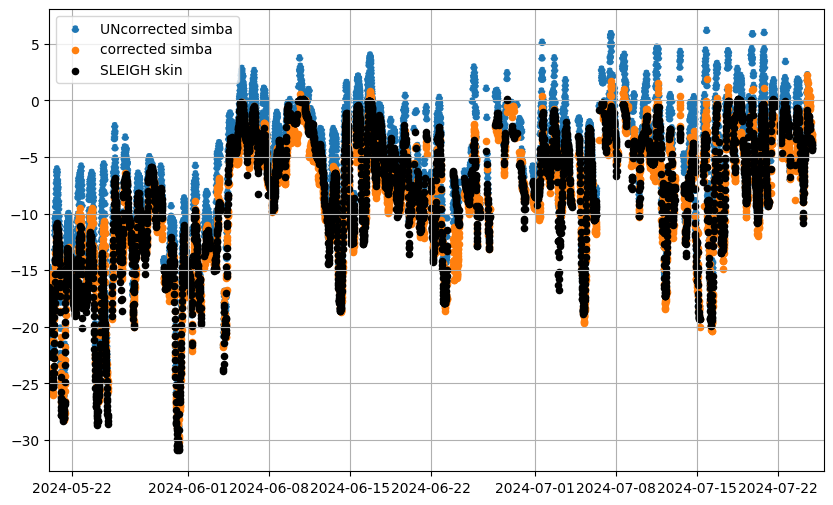

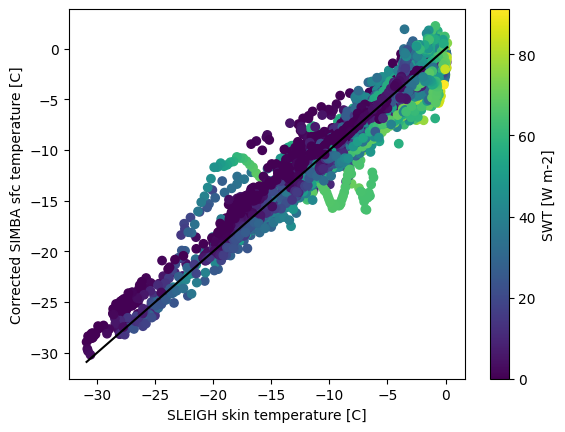

484604 (6527, 160) (6527, 160)
484604


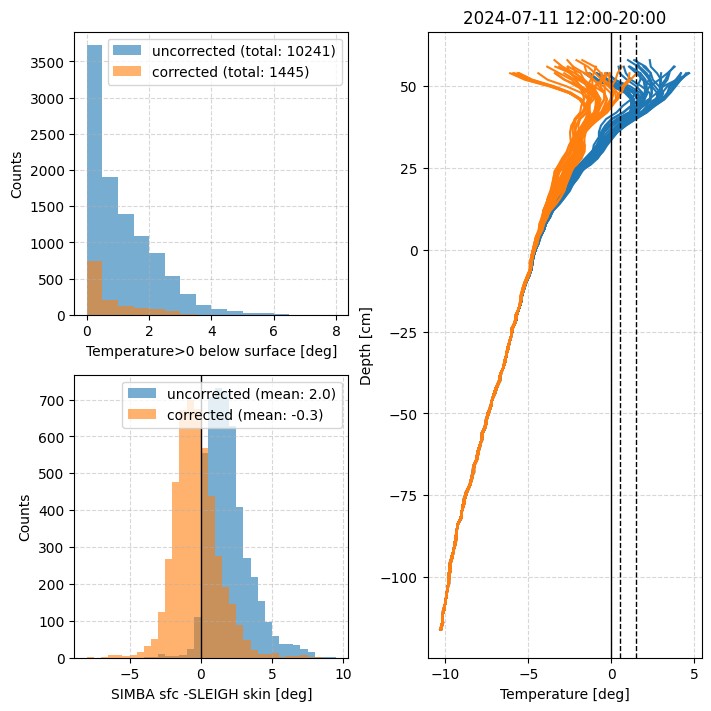

(0, 4) 5.558910584670094 109.3820942142857
(4, 25) 3.2200049747817867 107.44219608273363


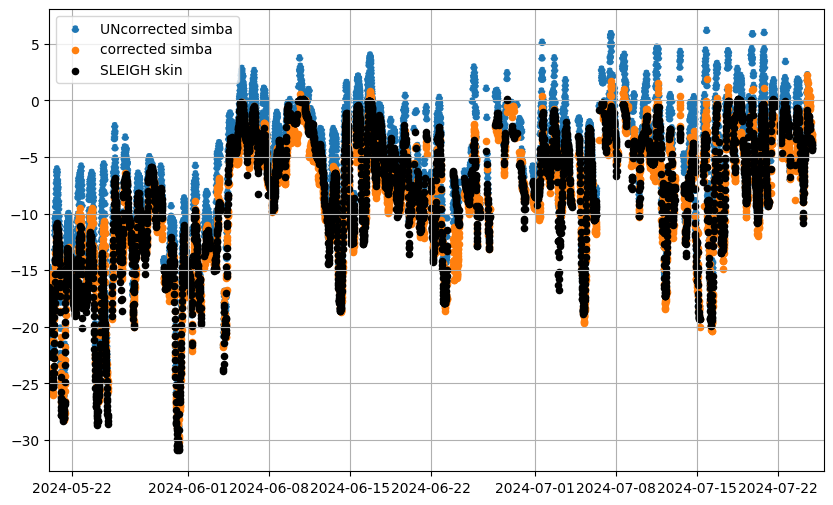

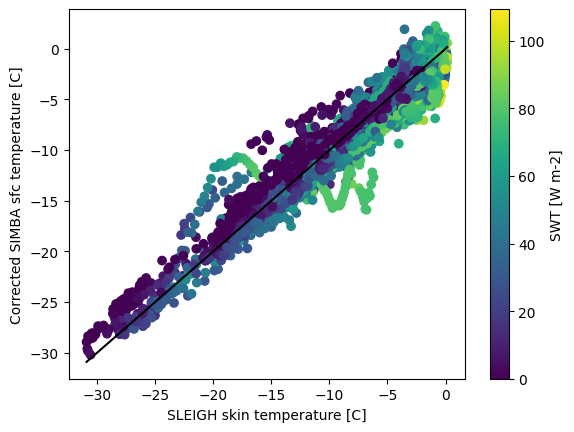

484604 (6527, 160) (6527, 160)
484604


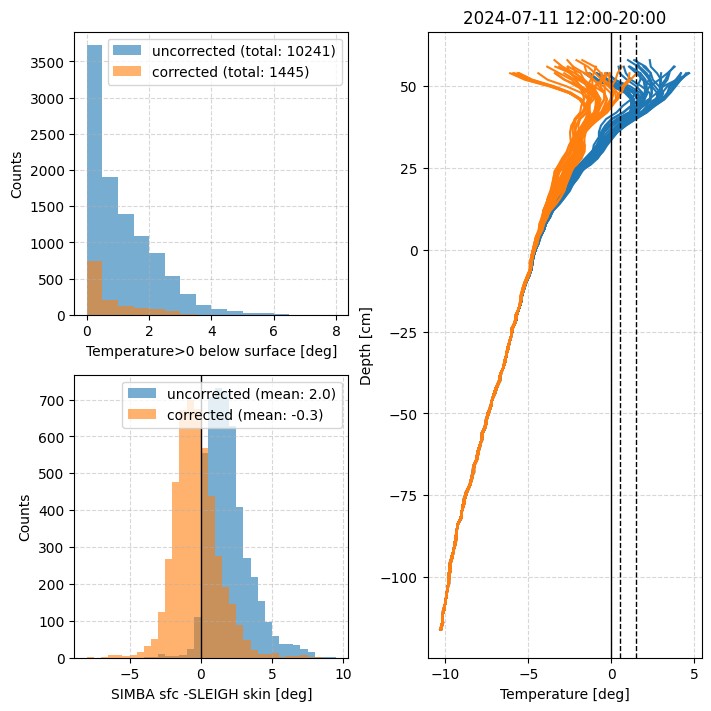

(0, 4) 4.951196003364619 72.92139614285713
(4, 25) 3.0597276678129006 70.42709599999999


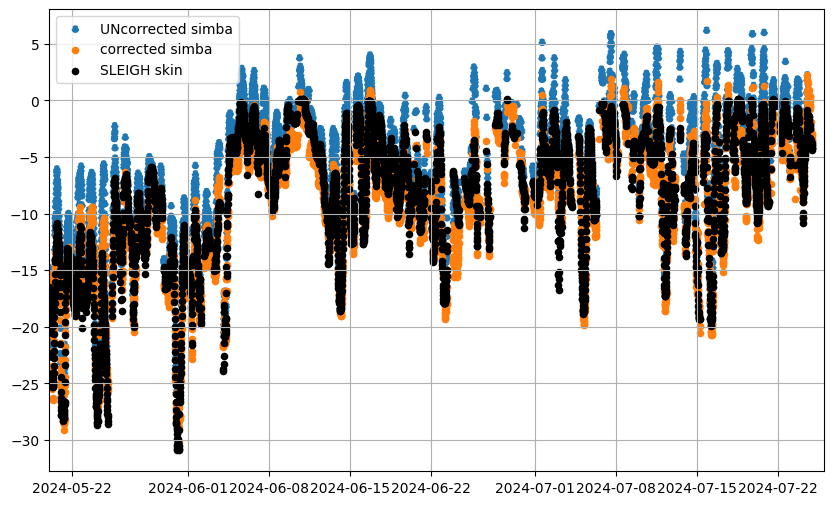

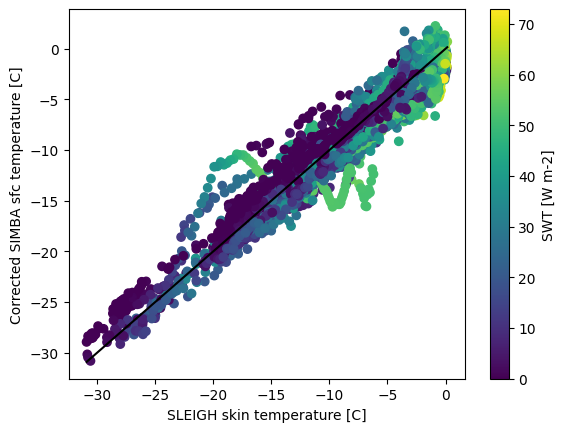

484604 (6527, 160) (6527, 160)
484604


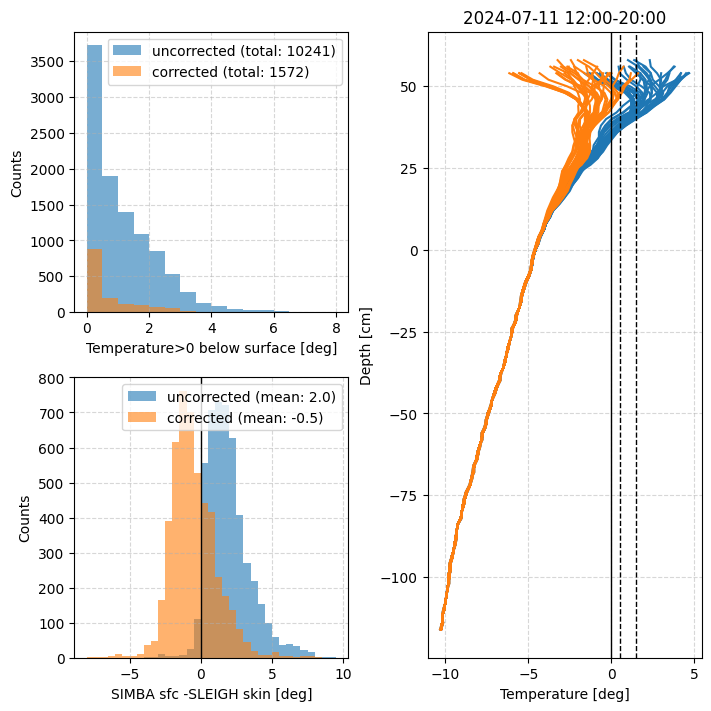

(0, 4) 4.951191904091213 91.15174517857142
(4, 25) 3.0597292756196732 88.03387


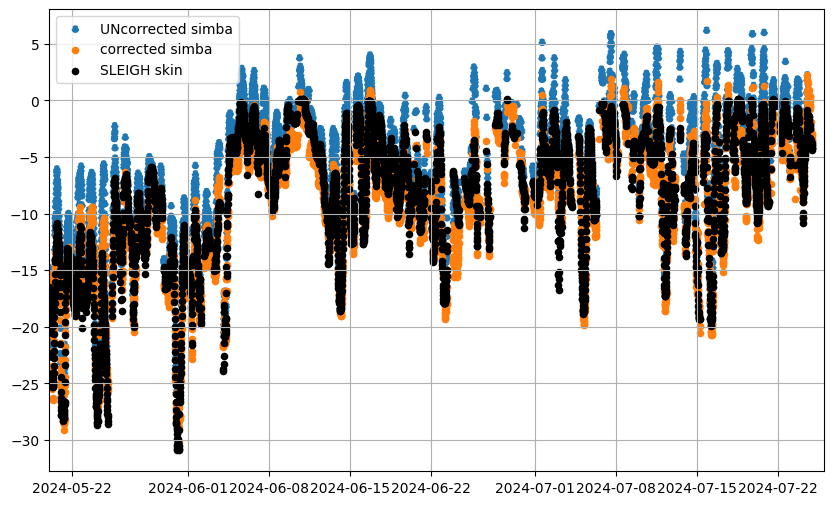

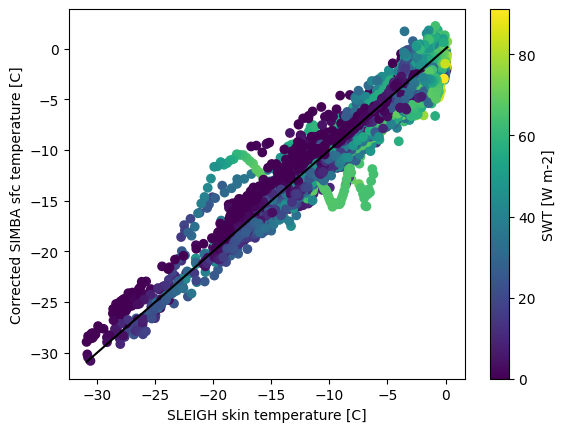

484604 (6527, 160) (6527, 160)
484604


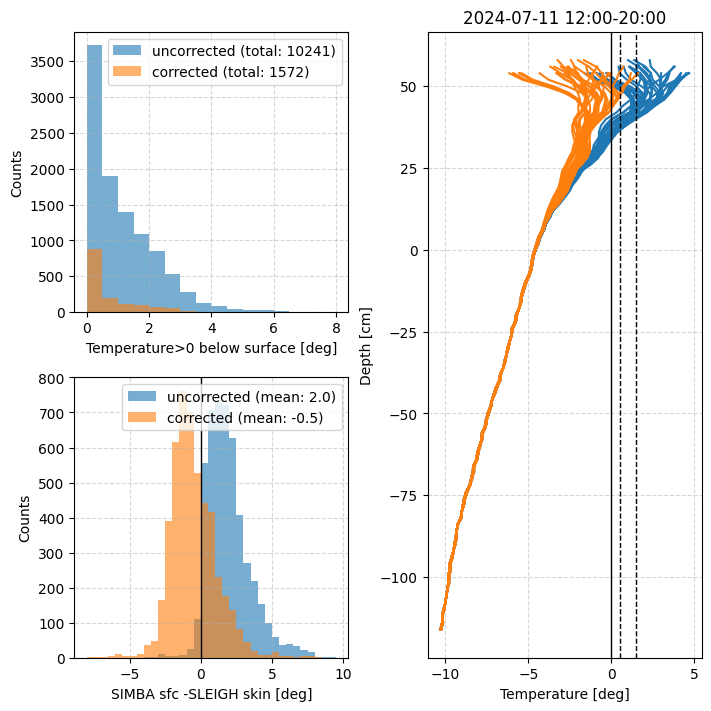

(0, 4) 4.951197688770183 109.3820942142857
(4, 25) 3.0597293583522354 105.640644


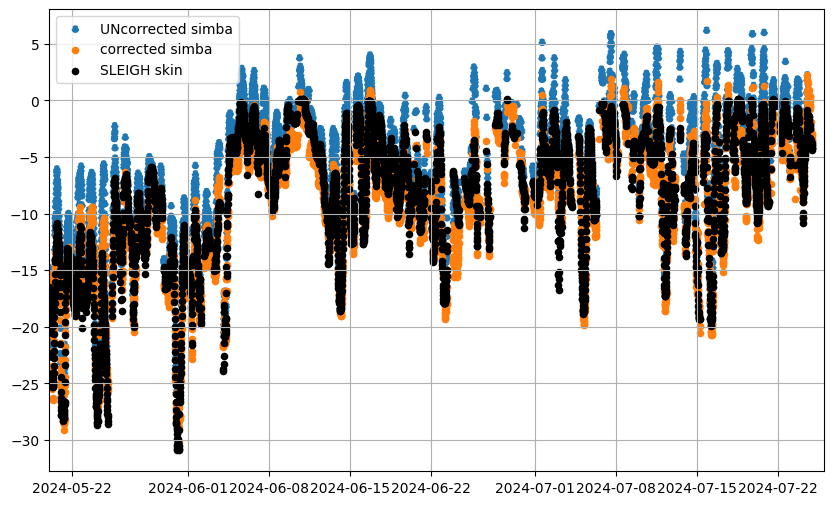

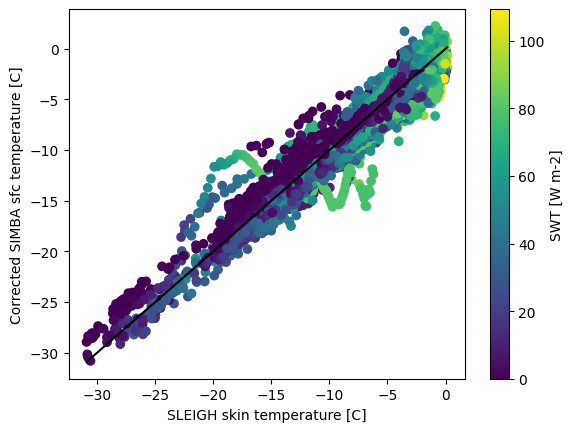

484604 (6527, 160) (6527, 160)
484604


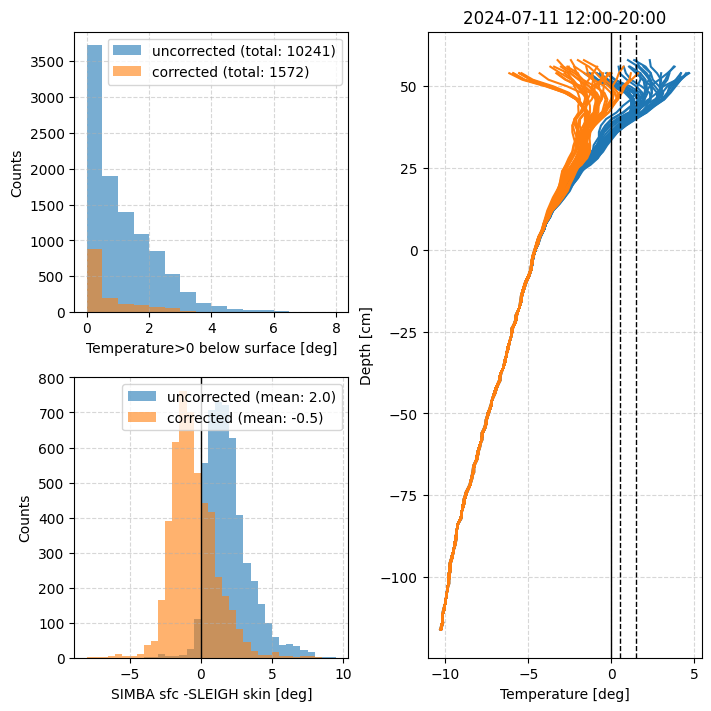

(0, 4) 4.5377065090631135 72.92139614285713
(4, 25) 2.9717262485737237 70.42709599999999


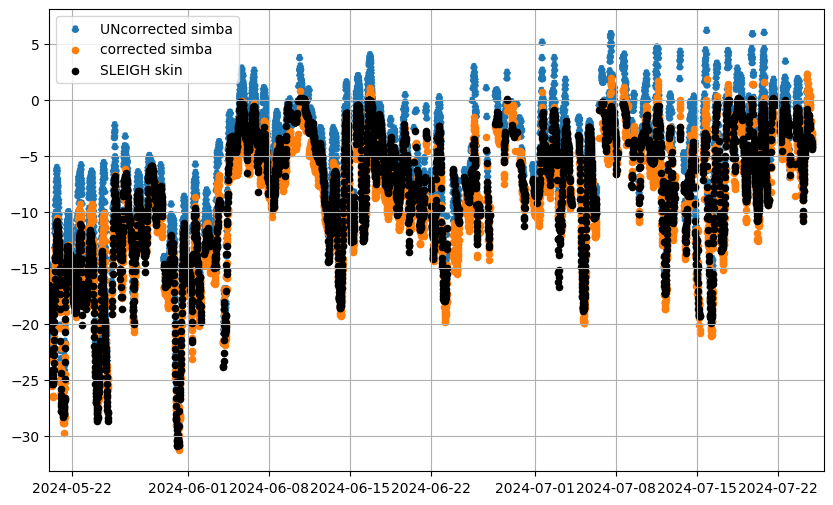

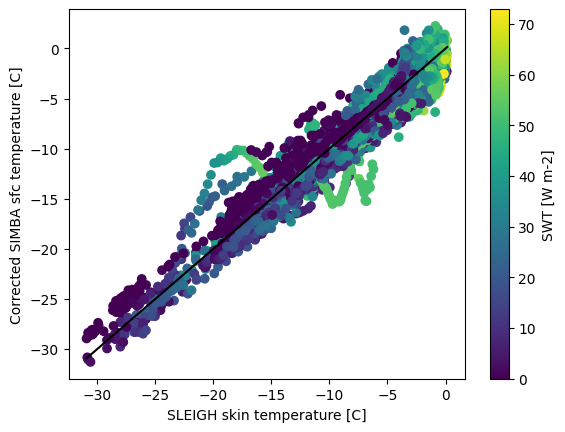

484604 (6527, 160) (6527, 160)
484604


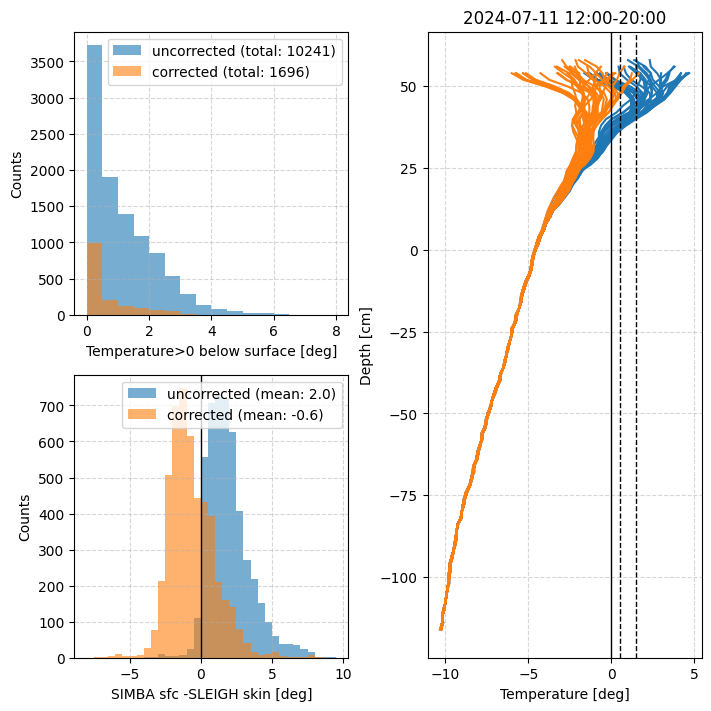

(0, 4) 4.537706438958254 91.15174517857142
(4, 25) 2.971726383745205 88.03387


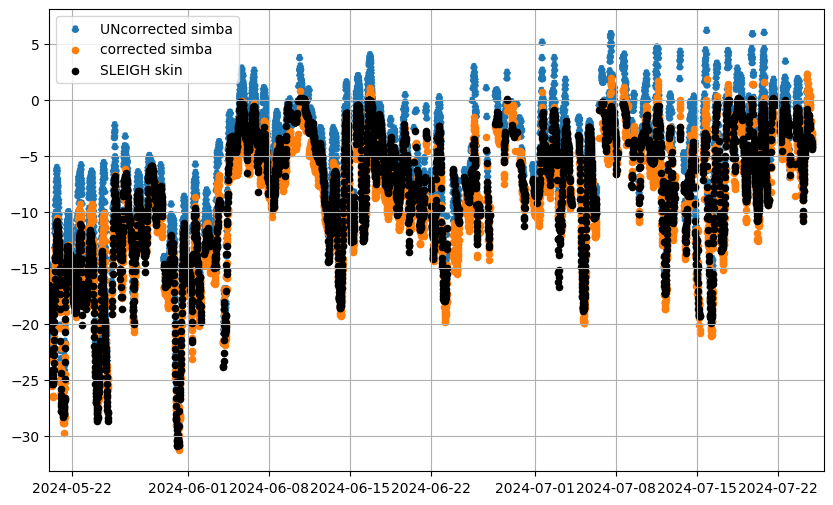

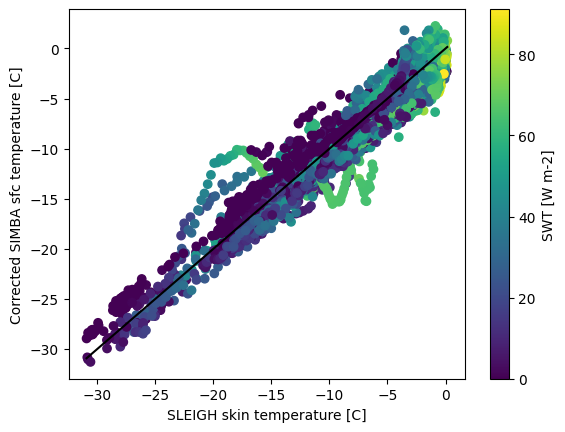

484604 (6527, 160) (6527, 160)
484604


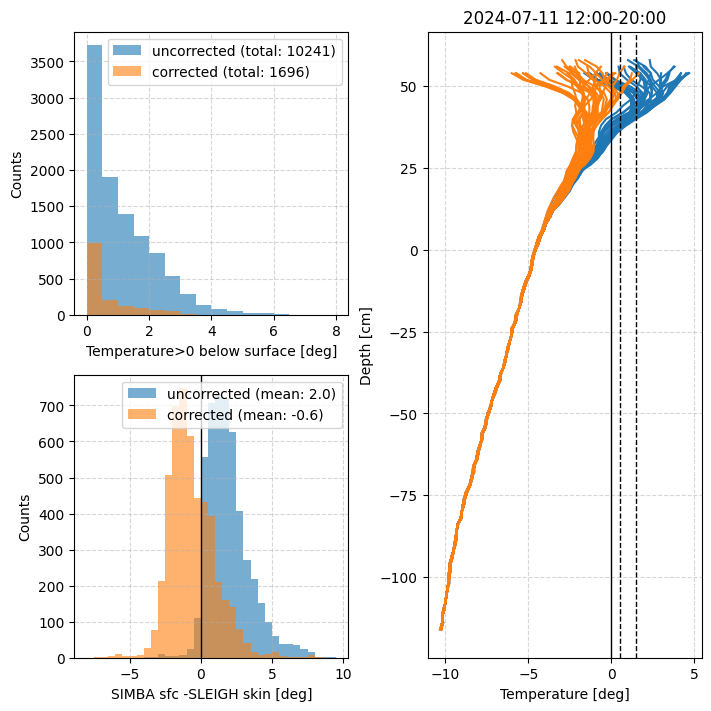

(0, 4) 4.537708126328207 109.3820942142857
(4, 25) 2.971725623744443 105.640644


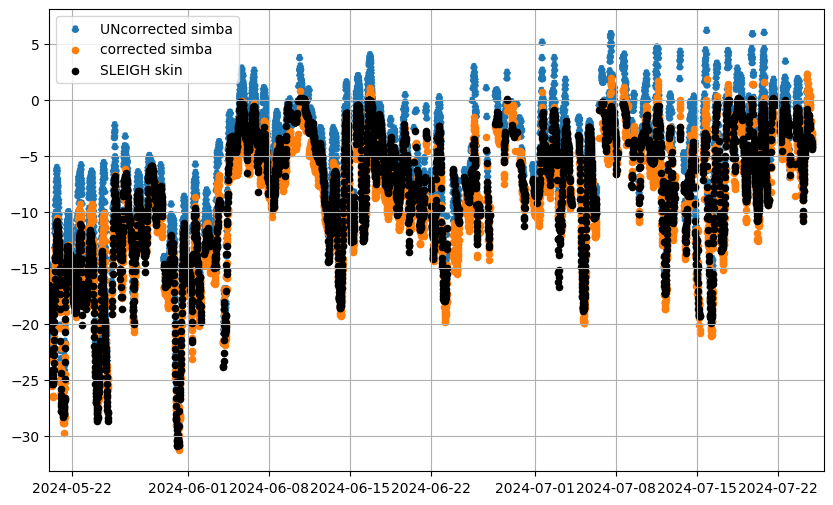

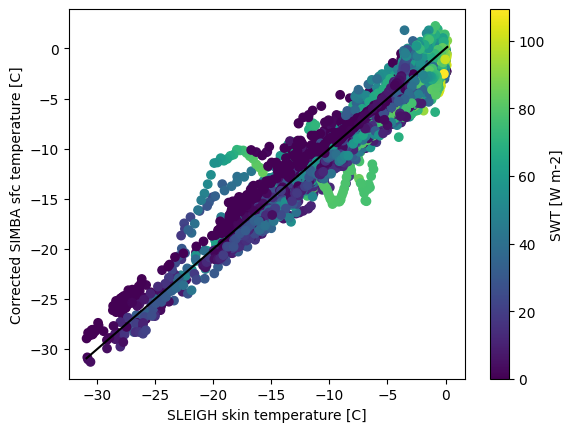

484604 (6527, 160) (6527, 160)
484604


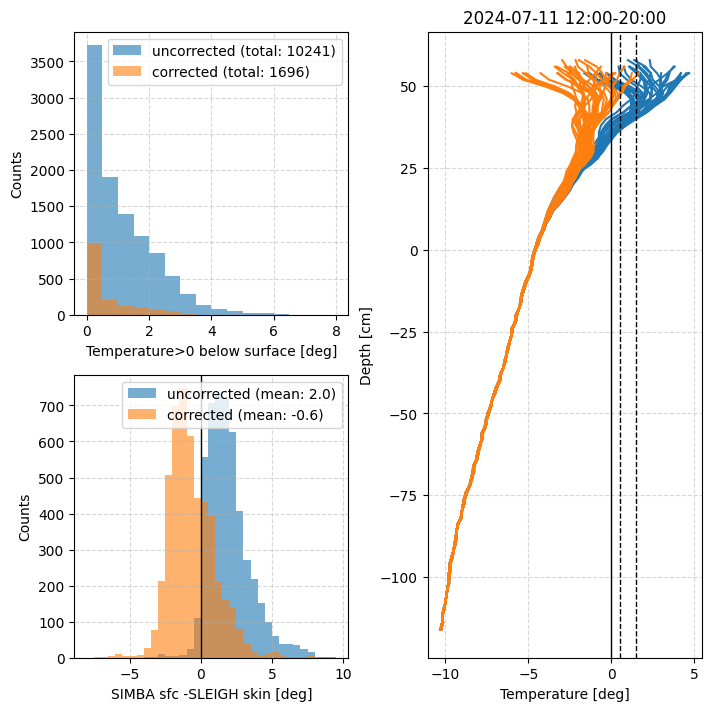

(0, 4) 4.182239831914771 72.92139614285713
(4, 25) 2.866025960657904 70.42709599999999


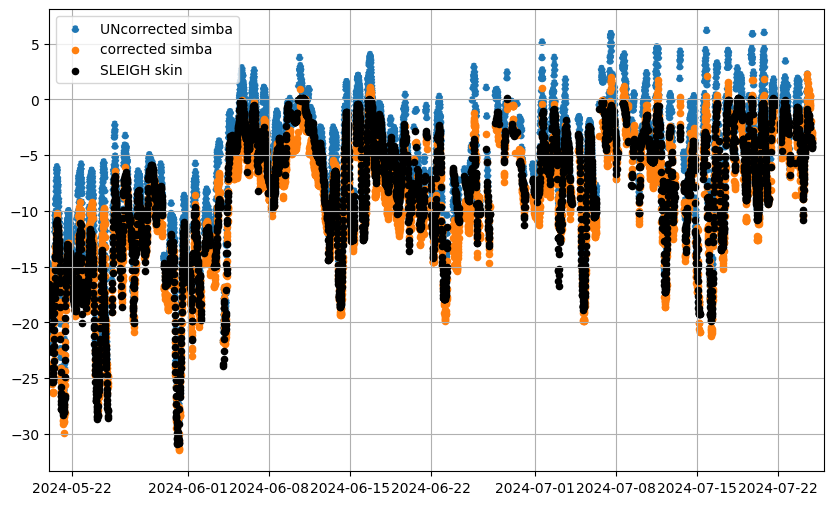

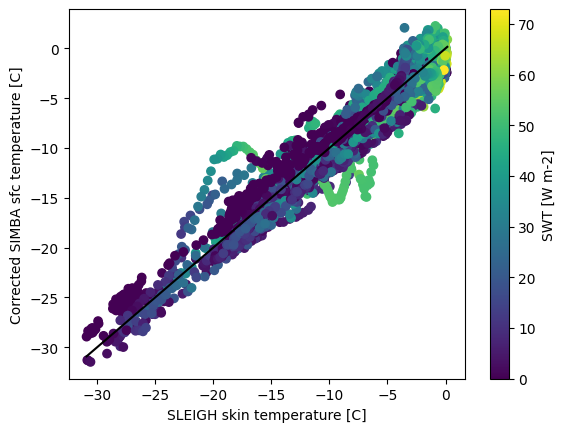

484604 (6527, 160) (6527, 160)
484604


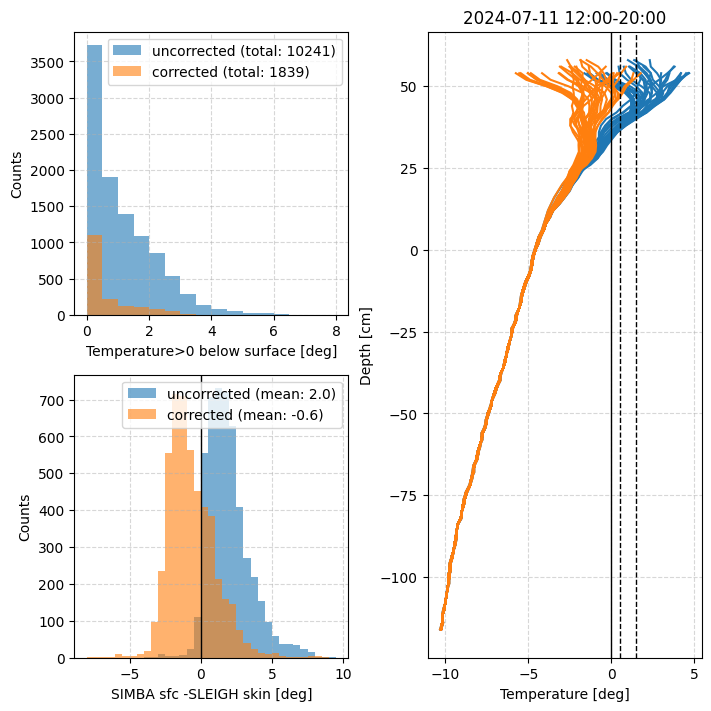

(0, 4) 4.182239679964927 91.15174517857142
(4, 25) 2.8660257342192574 88.03387


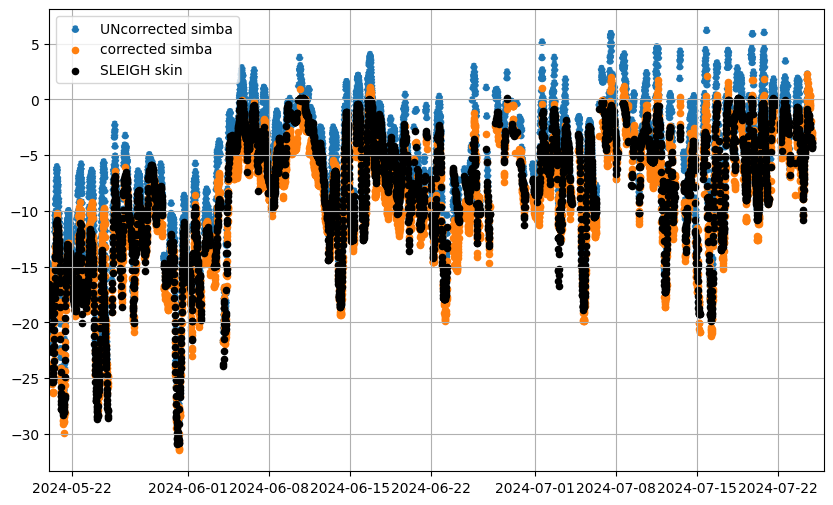

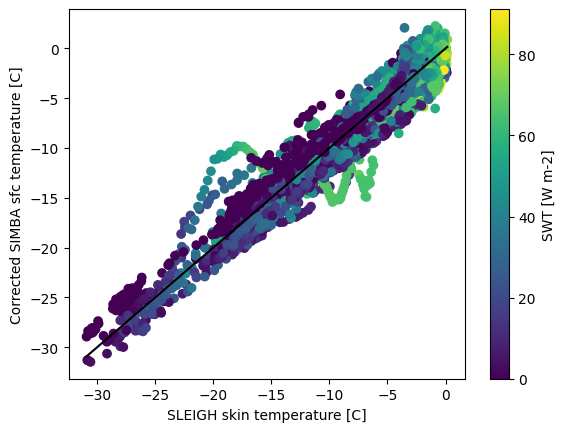

484604 (6527, 160) (6527, 160)
484604


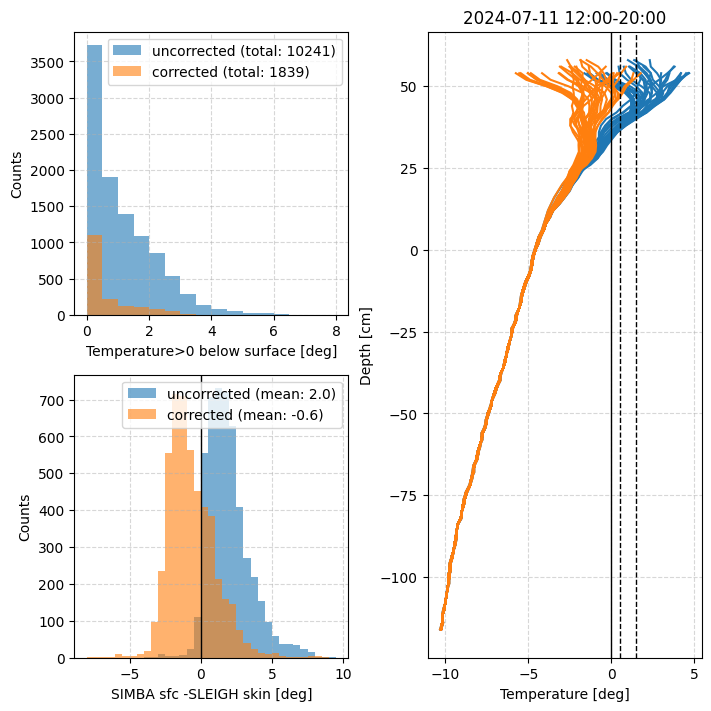

(0, 4) 4.182243308226233 109.3820942142857
(4, 25) 2.866025945137188 105.640644


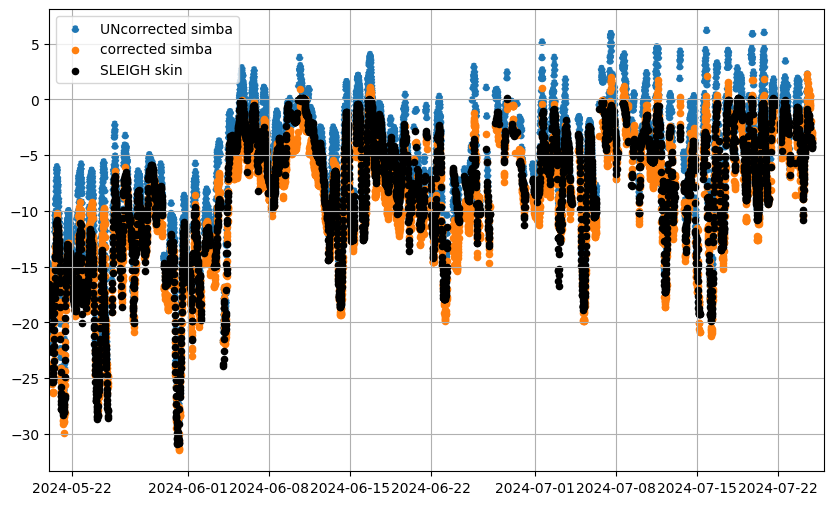

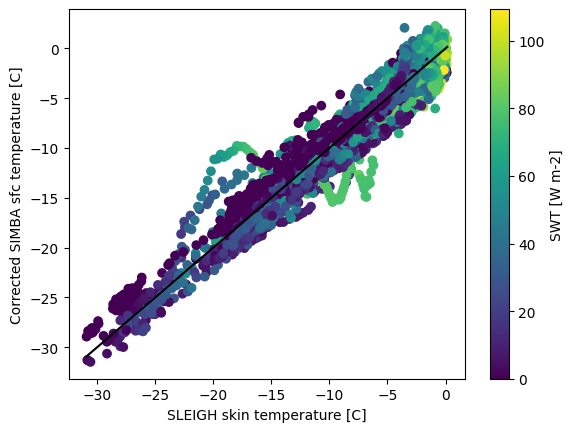

484604 (6527, 160) (6527, 160)
484604


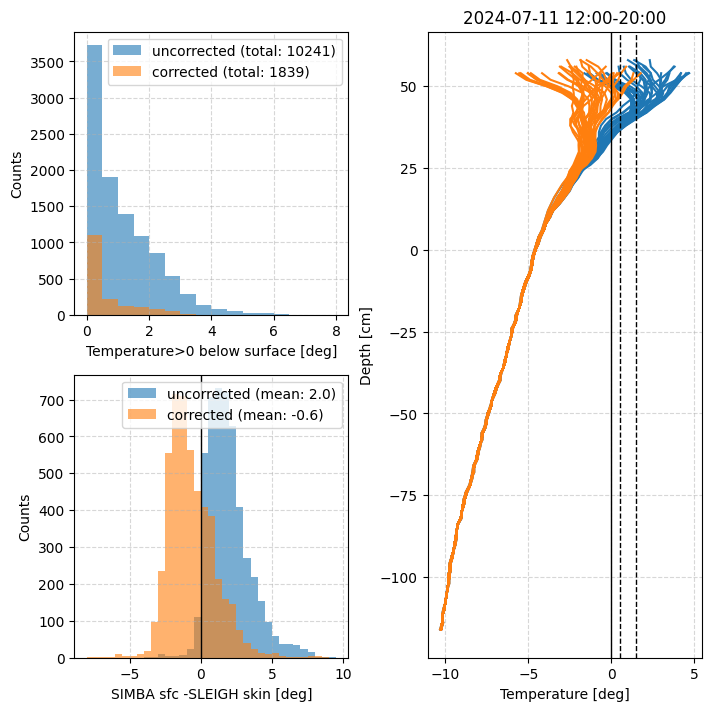

In [37]:
all_summary_values = {}

sfc_dif_i = 0.

for ks_i in np.arange(10,26,5):
    # for sfc_dif_i in np.arange(-4,0.01,2):
        for fnir_i in np.arange(.4,.601,.1):
            
            simba_swn = f_swn(simba_seconds)
            simba_swn = np.ma.masked_equal(simba_swn, -999)
            
            simba_wspd = f_ws(simba_seconds)
            simba_wspd = np.ma.masked_equal(simba_wspd, -999)
            # wr = np.percentile(simba_wspd[~simba_wspd.mask], np.arange(0,101,25)) ## 25% interval looks pretty good, what about many more?
            wr = np.percentile(simba_wspd[~simba_wspd.mask], np.arange(0,101,33)) ## 25% interval looks pretty good, what about many more?

            # swt_out, wspd_2d_out = get_swt_for_correction(float(ks_i), fnir_i, 
            #                                               simba_swn, simba_wspd, 
            #                                               plt_fig=False)
            # sub_temps_above_out, sub_swabs_above_out, sub_depths_out, sub_wspd_out = get_subsfc_above_zero_vals(simba_depths, swt_out, wspd_2d_out, 
            #                                                                                                     simba_sfc, sfc_dif_i, simba_temps, 
            #                                                                                                     melt_idx_in=False)
            # sub_depths_out *= -1.
            # # ihs_params_out = get_ihs_correction(sub_wspd_out, sub_swabs_above_out, sub_temps_above_out, sub_depths_out, ks_i, 
            # #                         wind_ranges=wr, plt_figs=True, curve='ihs', binval='percentile', p=85)
            # func_params = get_func_correction(sub_wspd_out, sub_swabs_above_out, sub_temps_above_out, sub_depths_out, ks_i, 
            #                         wind_ranges=wr, plt_figs=True, binval='percentile', p=85) #max
            
            # temp_correction_out = calc_temp_corrections(simba_sfc, sfc_dif_i, float(ks_i), fnir_i, simba_swn, 
            #                                             # simba_depths, ihs_params, plt_figs=False)
            #                                             simba_depths, func_params, plt_figs=False,  swt=True, param_interp='bin',)

            # mc_summary_vals, _ = correct_compare_temp(temp_correction_out, simba_sfc, sfc_dif_i, ks_i, fnir_i, 
            #                            simba_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, )

            swt_out, wspd_2d_out = get_swt_for_correction(float(ks_i), fnir_i, 
                                                          simba_swn, simba_wspd, 
                                                          plt_fig=False)

            sub_temps_above_out, sub_swabs_above_out, sub_depths_out, sub_wspd_out = get_subsfc_above_zero_vals(simba_depths, swt_out, wspd_2d_out, 
                                                                                                                simba_sfc, sfc_dif_i, simba_temps, 
                                                                                                                melt_idx_in=False)
            sub_depths_out *= -1.

            wr = [0,4,25]
            # wr = np.percentile(simba_wspd[~simba_wspd.mask], np.arange(0,101,33)) ## 25% interval looks pretty good, what about many more?

            func_params = get_func_correction(sub_wspd_out, sub_swabs_above_out, sub_temps_above_out, sub_depths_out, float(ks_i), 
                                                wind_ranges=wr, plt_figs=False, binval='percentile', p=85) #max

            temp_correction_out, swt_out = calc_temp_corrections(simba_sfc, sfc_dif_i, float(ks_i), fnir_i, simba_swn, 
                                                        simba_depths, func_params, plt_figs=False,  swt=True, param_interp='bin',)
            
            
            mc_summary_vals, _ = correct_compare_temp(temp_correction_out, simba_sfc, sfc_dif_i, float(ks_i), fnir_i, 
                                                   simba_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, )
            

            all_summary_values[(sfc_dif_i, ks_i, fnir_i)] = mc_summary_vals


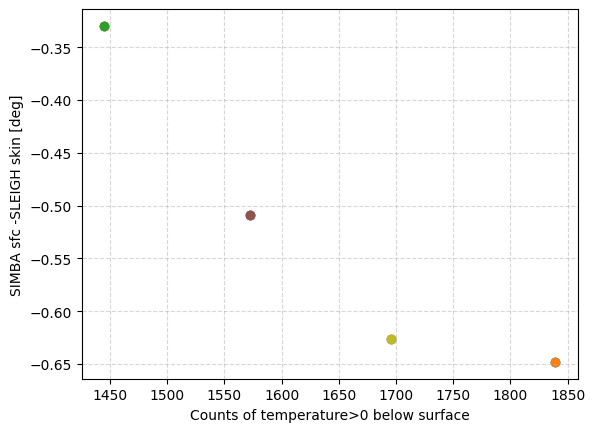

In [38]:
for key in all_summary_values:
    if np.ma.is_masked(all_summary_values[key]['above_zero_count']['corrected']) or np.ma.is_masked(all_summary_values[key]['ts_diff_mean']['corrected']):
        continue
    plt.scatter(all_summary_values[key]['above_zero_count']['corrected'], all_summary_values[key]['ts_diff_mean']['corrected'])

plt.ylabel('SIMBA sfc -SLEIGH skin [deg]')
plt.xlabel('Counts of temperature>0 below surface')
plt.grid(alpha=.5, ls='--')
# plt.xlim(250,300)
plt.show()

In [39]:
summary_varnames = ['ts_diff_mean', 'ts_diff_min', 'ts_diff_max', 'above_zero_count', 'above_0.5_count']

In [40]:
summary_arrays_corrected = {}
summary_arrays_uncorrected = {}
input_variables = {}

In [41]:
for varname in summary_varnames:
    var_array_corrected = np.array([ all_summary_values[key][varname]['corrected'] for key in all_summary_values] )
    var_array_uncorrected = np.array([ all_summary_values[key][varname]['uncorrected'] for key in all_summary_values] )

    summary_arrays_corrected[varname] = np.ma.masked_invalid(var_array_corrected)
    summary_arrays_uncorrected[varname] = np.ma.masked_invalid(var_array_uncorrected)

# (sfc_dif_i, ks_i, fnir_i)
summary_arrays_corrected['ts_diff_range'] = summary_arrays_corrected['ts_diff_max'] - summary_arrays_corrected['ts_diff_min']
pos_count_difference = summary_arrays_corrected['above_zero_count'] - summary_arrays_uncorrected['above_zero_count']

sfc_differences = np.array([ key[0] for key in all_summary_values] )
extinction_coefficients = np.array([ key[1] for key in all_summary_values] )
nir_fractions = np.array([ key[2] for key in all_summary_values] )


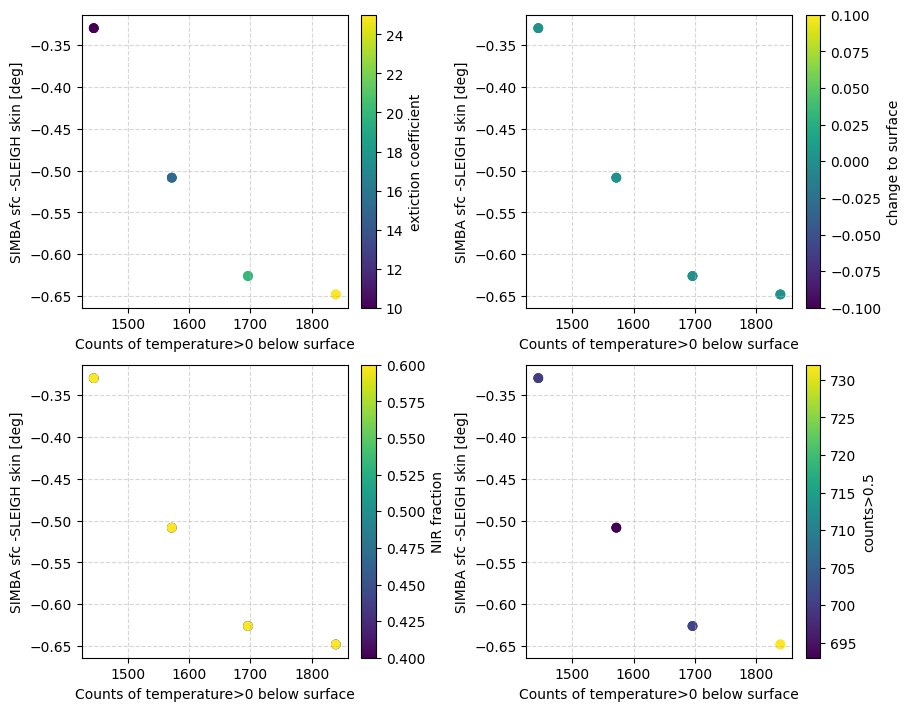

In [42]:
names = ['extiction coefficient','change to surface','NIR fraction','counts>0.5']
cvars = [extinction_coefficients, sfc_differences, nir_fractions, summary_arrays_corrected['above_0.5_count']]

fig, axs = plt.subplots(2,2, constrained_layout=True, figsize=(9,7))

# clevels = {'extiction coefficient':np.arange(15,41,5), 'change to surface':np.arange(-6,0.01,2), 
#            'NIR fraction':np.arange(0.4,0.61,0.1)}

for cname, cvar, ax in zip(names, cvars, axs.ravel()):
    cb = ax.scatter(summary_arrays_corrected['above_zero_count'], summary_arrays_corrected['ts_diff_mean'], c=cvar)
    # plt.errorbar(summary_arrays_corrected['above_zero_count'], summary_arrays_corrected['ts_diff_mean'], 
    #              np.array([summary_arrays_corrected['ts_diff_min'], summary_arrays_corrected['ts_diff_max']]), fmt='r^')
    
    
    plt.colorbar(cb, label=cname, ax=ax)

    ax.set_ylabel('SIMBA sfc -SLEIGH skin [deg]')
    ax.set_xlabel('Counts of temperature>0 below surface')
    ax.grid(alpha=.5, ls='--')
# plt.savefig('Raven_SIMBA_solar-correction_linear-IHS-theta-fit_ks-sfc-fnir_mc.png', dpi=200)
plt.show()

best result form above: fnir=0.5, ks=20,delta_sfc=-0.6

## Use what looks like the best values!

skin temp time steps are off!!!???


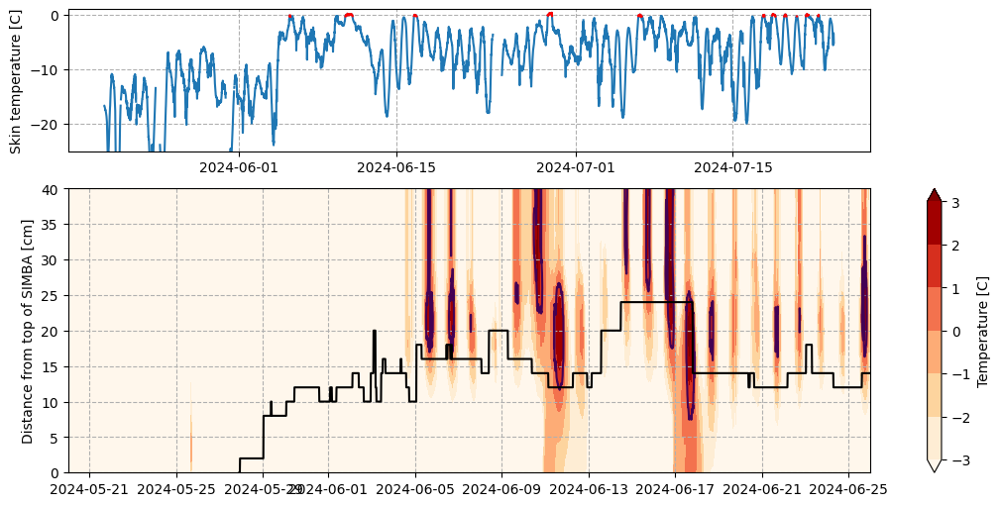

In [38]:
fig, axs = plt.subplots(2, figsize=(10,5), constrained_layout=True, sharex=False, gridspec_kw=dict(height_ratios=[1,2]))
print('skin temp time steps are off!!!???')
axs[0].plot(np.squeeze(sleigh_dates), sleigh_skin-273.15)
axs[0].plot(np.squeeze(sleigh_dates), np.ma.masked_less(sleigh_skin-273.15, -0.32), c='r')
axs[0].set_ylabel('Skin temperature [C]')

cb = axs[1].contourf(simba_dates, simba_depths, np.swapaxes(simba_temps,0,1),
                cmap=plt.cm.OrRd, levels=np.arange(-3,4,1), extend='both')
axs[1].contour(simba_dates, simba_depths, np.swapaxes(simba_temps,0,1),
                levels=[1], extend='both')
plt.colorbar(cb, ax=axs[1], label='Temperature [C]')

# cb = axs[2].contourf(simba_dates, simba_depths, np.swapaxes(corrected_temps,0,1),
#                 cmap=plt.cm.OrRd, levels=np.arange(-3,4,1), extend='both')
# axs[2].contour(simba_dates, simba_depths, np.swapaxes(corrected_temps,0,1),
#                 levels=[0], extend='both')
# plt.colorbar(cb, ax=axs[2], label='Temperature [C]')

for i, ax in enumerate(axs.ravel()):
    ax.grid(ls='--')
    if i>0:
        # ax.plot(season_data['dates'], simba_sfc, c='k')
        ax.plot(simba_dates, simba_sfc, c='k')
        ax.plot(np.squeeze(sleigh_dates), asfs_data_lev2['snow_depth'][sleigh_idx]-350, c='c')
        ax.set_ylabel('Distance from top of SIMBA [cm]')
        # ax.set_ylim(-100, 100)
        ax.set_ylim(-0, 40)

        ax.set_xlim(datetime.datetime(2024,5,20),datetime.datetime(2024,6,26))
        # ax.set_xlim(datetime.datetime(2024,7,2),datetime.datetime(2024,7,26))

axs[0].set_ylim(-25,1)

# axs[1].set_xlim(plt_times_not_smooth[0], plt_times_not_smooth[-1])
# plt.savefig('/home/asledd/ICECAPS/keff_retrieval/Raven_dtdz-flux-profile-timeseries_skinT_3level-smoothing-window.png', dpi=250)

plt.show()

In [222]:
# simba_seconds_short = np.copy(simba_seconds)[np.where(simba_dates<dt(2024,6,6))[0]]
# simba_temp_short = np.copy(simba_temps)[np.where(simba_dates<dt(2024,6,6))[0],:]

In [223]:
f_skin = interpolate.interp1d(sleigh_seconds[~sleigh_skin.mask], sleigh_skin[~sleigh_skin.mask], 
                             fill_value=-999, bounds_error=False)

simba_skin = f_skin(simba_seconds)
simba_skin = np.ma.masked_equal(simba_skin, -999)

melt_idx = np.where(simba_skin>=273.15-0.32)[0]

***What I think should be done: vary ks_i (extinction coefficient) over summer (maybe correlate w/ new snow or not) because correciton performance dpends on time period (or temperature?)

In [224]:
sfc_fig_savepath = '/home/asledd/ICECAPS/sfc_id_figures/variance_method/'

In [225]:
simba_dates_2d = np.ma.repeat(simba_dates[:,np.newaxis], simba_temps.shape[1], axis=1)

SWT shapes (6239, 200) () (6239, 200)
SWT out shape (6239, 200)


/tmp/ipykernel_762218/1850639980.py:138: UserWarning: Adding colorbar to a different Figure <Figure size 1000x400 with 4 Axes> than <Figure size 400x400 with 1 Axes> which fig.colorbar is called on.
  plt.colorbar(cb, label='Depth below surface [cm]', ax=axs[-1])


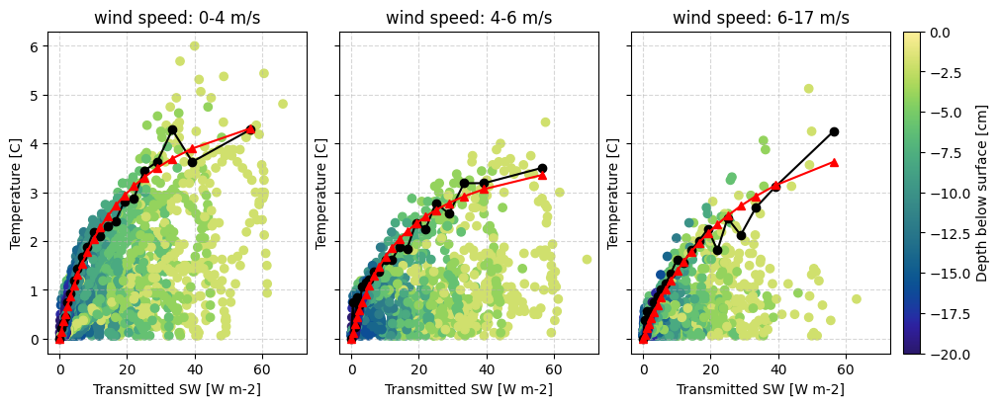

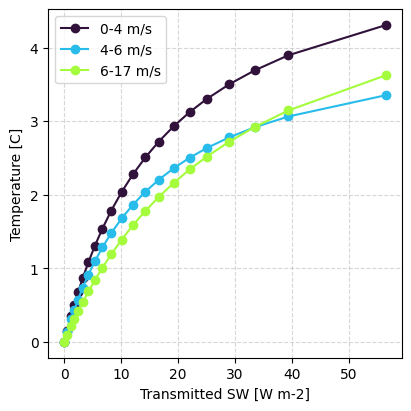

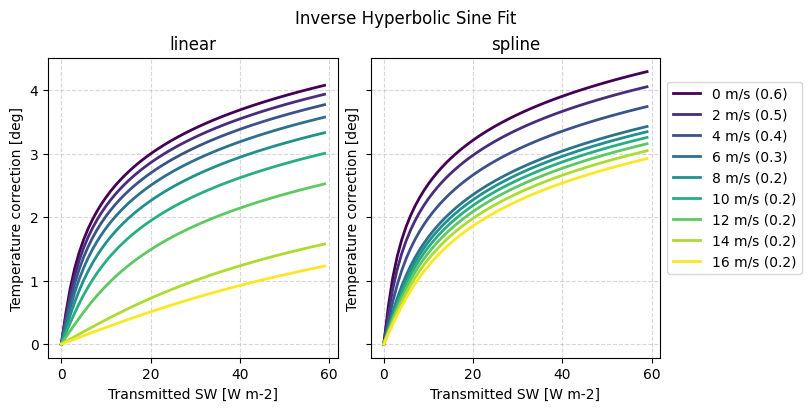

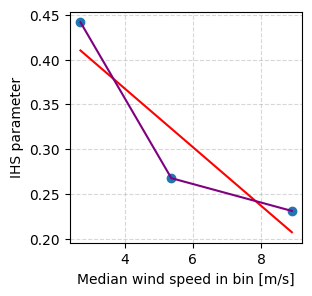


SWT shapes (6239, 160) () (6239, 160)
SWT out shape (6239, 160)
(6239,) (160,) (6239, 160)


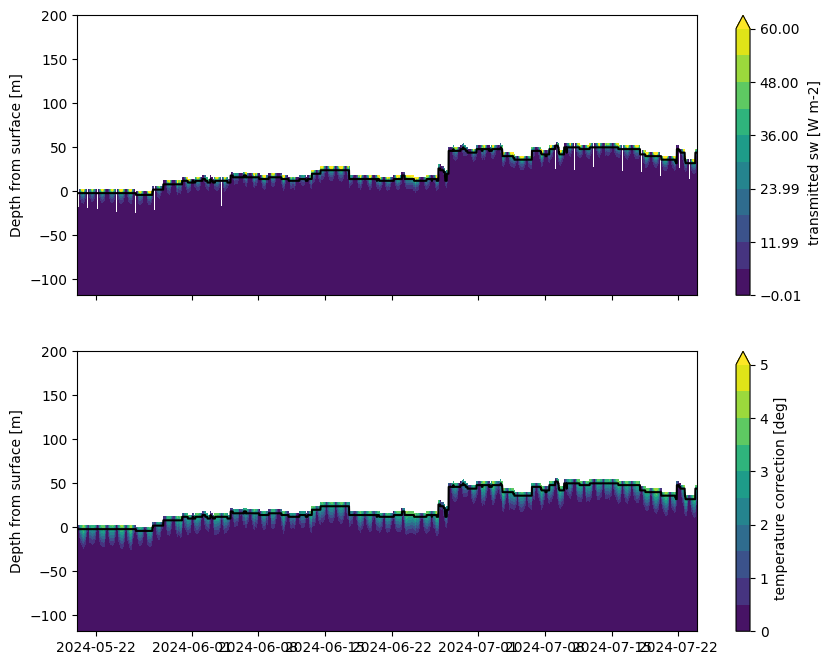

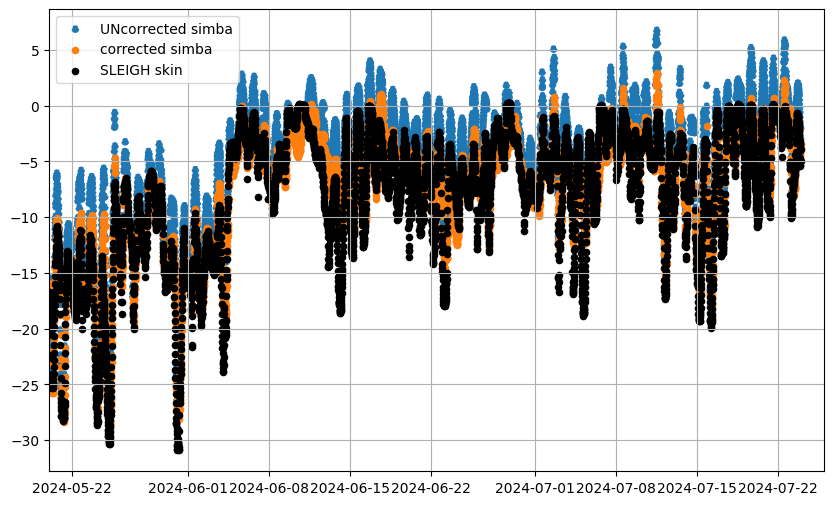

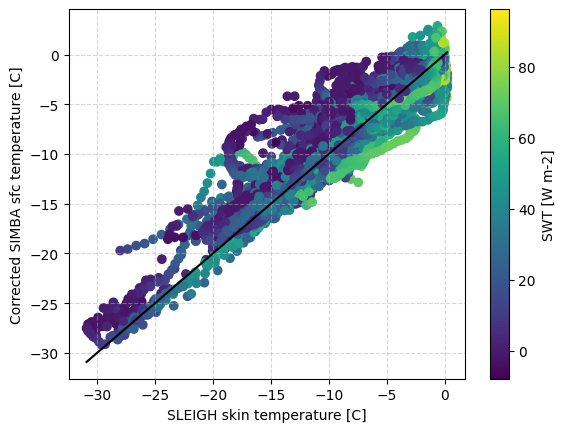

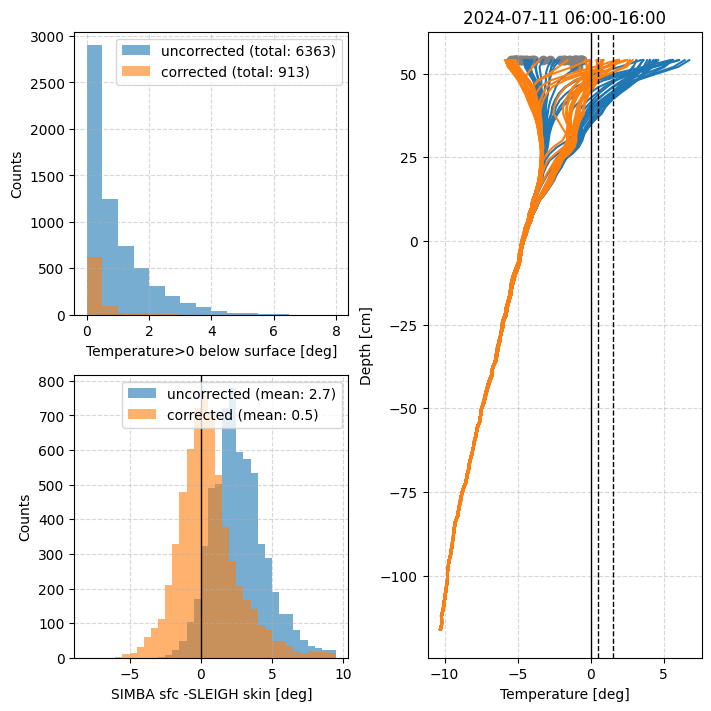

In [254]:
simba_swn = f_swn(simba_seconds)
simba_swn = np.ma.masked_equal(simba_swn, -999)

simba_wspd = f_ws(simba_seconds)
simba_wspd = np.ma.masked_equal(simba_wspd, -999)

# simba_wspd = simba_wspd**2

ks_i = 16.
# ks_i = [15,25]
fnir_i = 0.5
sfc_dif_i = 4.#-6.


# swt_out, wspd_2d_out = get_swt_for_correction(float(ks_i), fnir_i, 
#                                               simba_swn, simba_wspd, 
#                                               plt_fig=False)
swt_out, wspd_2d_out, simba_skin_2d = get_swt_for_correction(ks_i, fnir_i, 
                                              simba_swn, simba_wspd, 
                                              plt_fig=False)
# simba_temps = np.ma.masked_greater(simba_temps, 40)
sub_temps_above_out, sub_swabs_above_out, sub_depths_out, sub_wspd_out, all_simba_skin_out = get_subsfc_above_zero_vals(simba_depths, swt_out, wspd_2d_out, 
                                                                                                    simba_sfc, sfc_dif_i, simba_temps, 
                                                                                                    melt_idx_in=False)
# sfc_idx_sub = np.where(sub_depths_out<5)[0]
# cb = plt.scatter(sub_depths_out[sfc_idx_sub], sub_temps_above_out[sfc_idx_sub], c=sub_swabs_above_out[sfc_idx_sub], cmap=plt.cm.turbo)
# plt.ylabel('Temperature [C]')
# plt.xlabel('Depth [cm]')
# plt.colorbar(cb, label='SW [Wm-2]')
# plt.show()
# break
## changing to 'initial height' variable when code was expecting negatives
sub_depths_out *= -1.
# plt.hist(sub_depths_out)
# plt.show()
# wr = [0,3,6,25]
# wr = [0,25,30]

# wr = [(0,2),(1,3),(2,4),(3,5),(5,25)]
# wr = [(0,3),(0,2),(1,3),(2,4),(3,5),(5,25)]

# wr = [0,4,25]
# wr = np.percentile(simba_wspd[~simba_wspd.mask], np.arange(0,101,25)) ## 25% interval looks pretty good, what about many more?
wr = np.percentile(simba_wspd[~simba_wspd.mask], np.arange(0,101,33)) ## 25% interval looks pretty good, what about many more?
# wr = np.percentile(simba_wspd[~simba_wspd.mask], np.arange(0,101,50)) ## 25% interval looks pretty good, what about many more?
# wr = np.percentile(simba_wspd[~simba_wspd.mask], np.arange(0,101,100)) ## 25% interval looks pretty good, what about many more?

# linear_params = get_linear_correction(sub_wspd_out, sub_swabs_above_out, sub_temps_above_out, sub_depths_out, ks_i, 
#                                     wind_ranges=wr, plt_figs=True, curve='ihs', binval='percentile', p=85)

# print('DONE WITH LINEAR')
ihs_params = get_ihs_correction(sub_wspd_out, sub_swabs_above_out, sub_temps_above_out, sub_depths_out, ks_i, 
                                    wind_ranges=wr, plt_figs=True, curve='ihs', binval='percentile', p=85) #max



## choosing 85 vs 90 percentile impacts amount of correction for clearsky (high SWN) times
## colder temps are biased warm possibly because of greater thermistor uncertainty?
## so mean difference in surface-skin temp can look good with over correction
## divide into clear/cloudy and warm/cold times?
# func_params = get_func_correction(sub_wspd_out, sub_swabs_above_out, sub_temps_above_out, sub_depths_out, ks_i, 
#                                     wind_ranges=wr, plt_figs=True, binval='percentile', p=85) #max



# print('TESTING?')
# _ = get_spline_correction(sub_wspd_out, sub_swabs_above_out, sub_temps_above_out, sub_depths_out, ks_i, 
#                                     wind_threshold=3, plt_figs=True, binval='percentile', p=90, s=5, k=2)
print()
# print(ihs_params)
# # temp_correction_out, swt_out = calc_temp_corrections(simba_sfc, sfc_dif_i, float(ks_i), fnir_i, simba_swn, 
temp_correction_out, swt_out = calc_temp_corrections(simba_sfc, sfc_dif_i, ks_i, fnir_i, simba_swn, 
                                            # simba_depths, func_params, plt_figs=True,  swt=True, param_interp='bin',)
                                            simba_depths, ihs_params, plt_figs=True,  swt=True, param_interp='spline', curve='ihs')


mc_summary_vals, corrected_temps_wind = correct_compare_temp(temp_correction_out, simba_sfc, sfc_dif_i, ks_i, fnir_i, 
                                       simba_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, )
                                       # m=6, d=1, summ_dates=(dt(2024,5,22), dt(2024,6,5)))
                                       # m=6, d=21, summ_dates=(dt(2024,6,6), dt(2024,6,27)))
                                       # m=7, d=19, summ_dates=(dt(2024,6,27), dt(2024,7,24)))

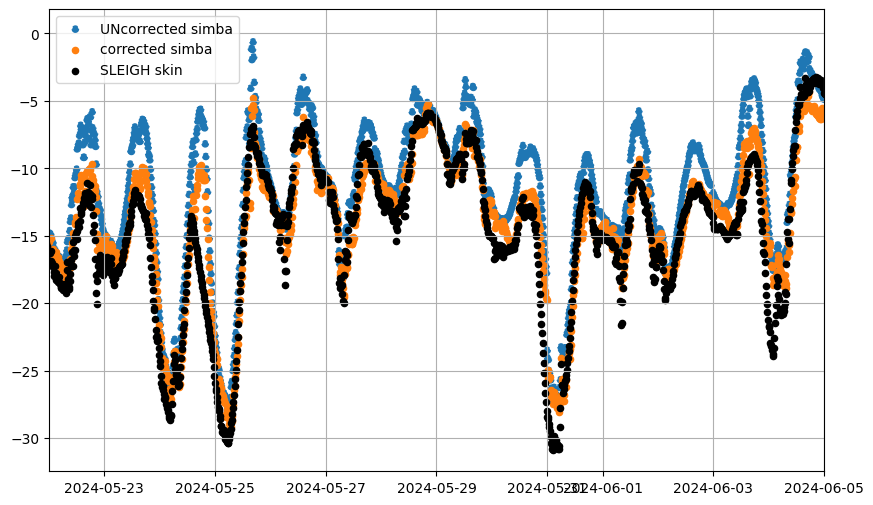

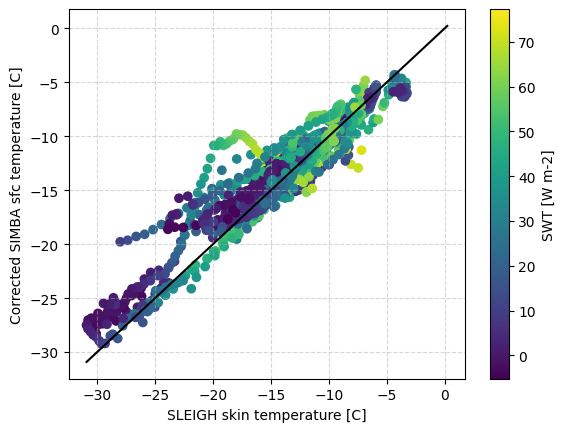

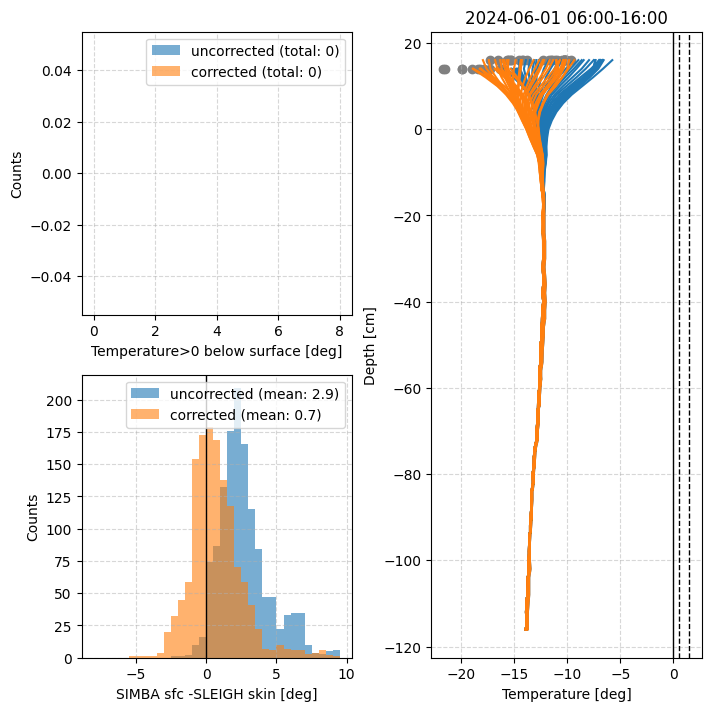

In [252]:
mc_summary_vals, corrected_temps_new = correct_compare_temp(temp_correction_out, simba_sfc, sfc_dif_i, ks_i, fnir_i, 
                                       simba_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, 
                                       m=6, d=1, summ_dates=(dt(2024,5,22), dt(2024,6,5)))
                                       # m=6, d=21, summ_dates=(dt(2024,6,9), dt(2024,6,27)))
                                       # m=7, d=11, summ_dates=(dt(2024,6,27), dt(2024,7,24)))

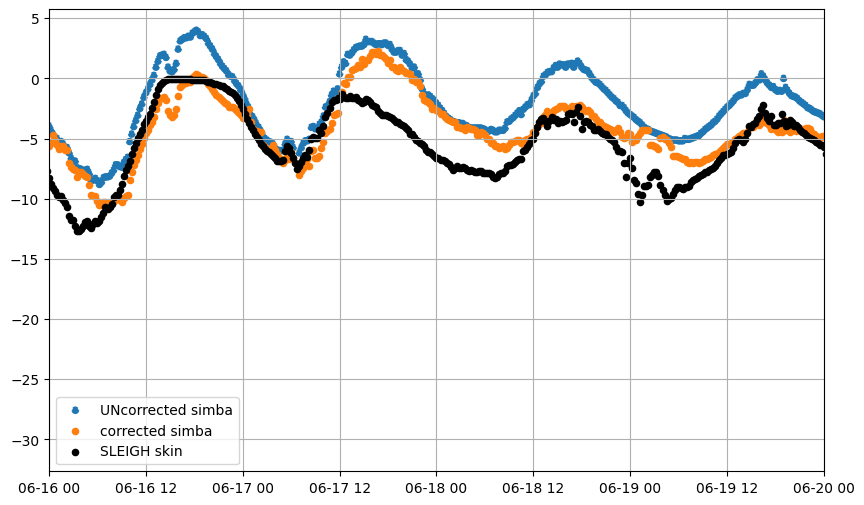

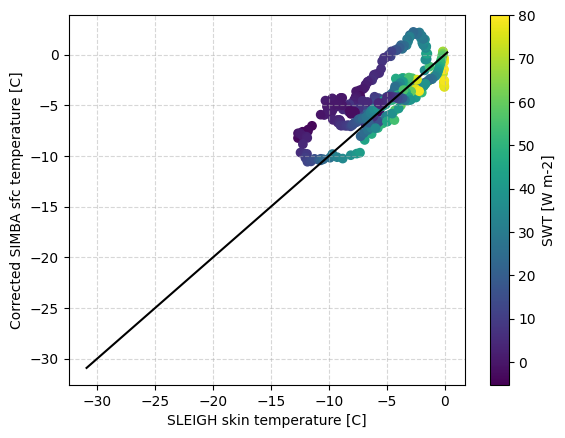

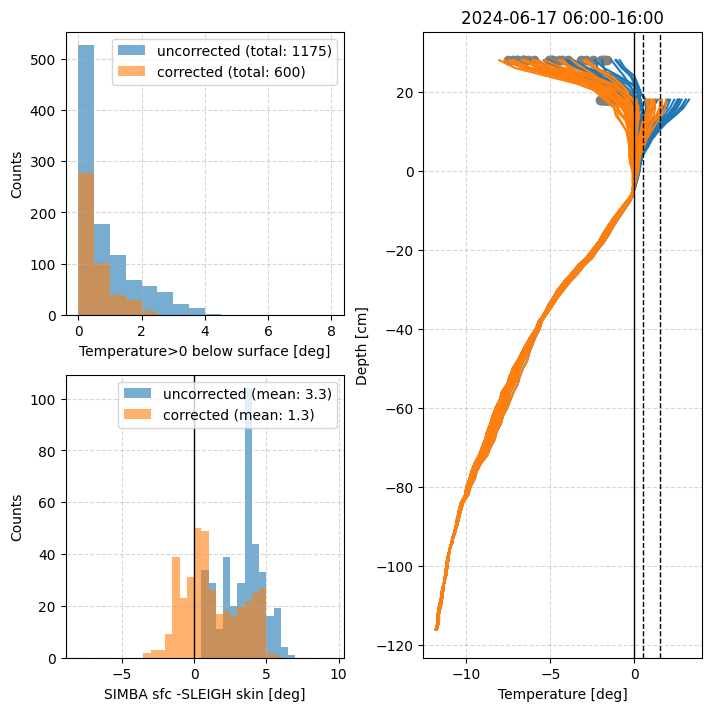

In [253]:
mc_summary_vals, corrected_temps_new = correct_compare_temp(temp_correction_out, simba_sfc, sfc_dif_i, ks_i, fnir_i, 
                                       simba_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, 
                                       # m=6, d=1, summ_dates=(dt(2024,5,22), dt(2024,6,5)))
                                       m=6, d=17, summ_dates=(dt(2024,6,16), dt(2024,6,20)))
                                       # m=7, d=19, summ_dates=(dt(2024,7,10), dt(2024,7,24)))

Save corrected temperautre to netcdf!

In [1084]:
print(sfc_fname)

Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_v2_20250723.csv


In [255]:
# fn = 'firnprofile_solar-correction_rolling-variance-sfc_created_20250722.nc'
# fn = 'firnprofile_solar-correction_max-daytime-d2Tdz2-sfc_created_20250722.nc'
fn = f'firnprofile_solar-correction_rolling-variance-max-sfc-{var_version}_sfcdif+{sfc_dif_i}_ksi{ks_i}_created_20250730.nc'

with Dataset(f'/home/asledd/ICECAPS/{fn}', 'w', format='NETCDF4_CLASSIC') as ds:
    # ds.title='SIMBA data from Raven corrected for suspected solar bias. Created in simba_correction_new-sfc.ipynb \
    #             using firnprofile-combined-corrected-maxheight.sled.level2.beta.15min.20240517-20240814_created_Apr8_2025.nc.\
    #             Extinction coefficent was set to linearly change between 10 and 15 m-1 (ks_i = [10,15]). NIR fraction was 0.5, \
    #             and there was no adjustment to the surface (sfc_dif_i = 0.). Curve fitting was done using the uper 85 percentile of\
    #             SW bins and a functional curve of the form b*(x / (a + x)) for two wind speed bins, 0-4 and 4-25 m/s.\
    #             Surface used was Raven2024_SIMBA_sfc_id_combined-corrected-maxheight_raw-despiked-72h-05threshold_20250416.csv.'
    ds.title=f'SIMBA data from Raven corrected for suspected solar bias. Created in simba_correction_new-sfc.ipynb using {simba_fname}. Extinction coefficent was set to  {ks_i} m-1. NIR fraction was {fnir_i}, and with an adjustment to the surface of sfc_dif_i = {sfc_dif_i}cm. Curve fitting was done using the upper 85 percentile of SW bins and an inverse hyperbolic sine fit for three wind speed bins, 0-4, 4-6, and 6-17 m/s. Surface used was {sfc_fname}.'
    
    time = ds.createDimension('time', None)
    times = ds.createVariable('time', np.float64, ('time',))
    times[:] = np.squeeze(simba_seconds)
    times.units = 'seconds since 1970-01-01 00:00'
    times.calendar = 'standard'
    
    depth = ds.createDimension('initial_height', len(simba_depths))
    depths = ds.createVariable('initial_height', np.float64, ('initial_height',))
    depths[:] = simba_depths
    depths.units = 'cm'
    
    
    value = ds.createVariable('temp', np.float64, ('time','initial_height',))
    value.missing_value = -999
    value.units = 'C'
    value[:] = corrected_temps_wind

    sfc_value = ds.createVariable('detected_surface', np.float64, ('time',))
    sfc_value.missing_value = -999
    sfc_value.units = 'cm'
    sfc_value[:] = simba_sfc+sfc_dif_i

# ds.close()

### checking surface temp-solar relationship

In [43]:
variance_sfc_fname = 'Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_+4cm_v2_20250710.csv'

In [44]:
sfc_lo = simba_sfc
heights_repeat = np.repeat(simba_depths[np.newaxis,:], simba_temps.shape[0], axis=0)
sfc_repeat = np.repeat(simba_sfc[:,np.newaxis], simba_temps.shape[1], axis=1)
sfc_seconds = np.repeat(simba_seconds[:,np.newaxis], simba_depths.shape[0], axis=1)[np.where(heights_repeat==sfc_repeat)]
sfc_dates = np.repeat(simba_dates[:,np.newaxis], simba_depths.shape[0], axis=1)[np.where(heights_repeat==sfc_repeat)]

f_0_skinT = interpolate.interp1d(sleigh_seconds[~sleigh_skin.mask], sleigh_skin[~sleigh_skin.mask], fill_value=-999, bounds_error=False)
sleigh_skinT_simba_timesteps = f_0_skinT(sfc_seconds)
sleigh_skinT_simba_timesteps = np.ma.masked_less(sleigh_skinT_simba_timesteps, 0)-273.15

unc_simba_sfc_temp = simba_temps[np.where(heights_repeat==sfc_repeat)]
unc_simba_sfc_temp_shift = simba_temps[np.where(heights_repeat==(sfc_repeat+2))]


simba_swn_sfc = f_swn(sfc_seconds)
simba_swn_sfc = np.ma.masked_equal(simba_swn_sfc, -999)

simba_wspd_sfc = f_ws(sfc_seconds)
simba_wspd_sfc = np.ma.masked_equal(simba_wspd_sfc, -999)

In [45]:
sleigh_skinT_times = f_0_skinT(simba_seconds)
sleigh_skinT_times = np.ma.masked_less(sleigh_skinT_times, 0)-273.15


In [46]:
lwd = asfs_data_lev2['down_long_hemisp'][sleigh_idx]
f_lwd = interpolate.interp1d(sleigh_seconds[~lwd.mask], lwd[~lwd.mask], 
                             fill_value=-999, bounds_error=False)

simba_lwd = f_lwd(sfc_seconds)
simba_lwd = np.ma.masked_equal(simba_lwd, -999)

In [47]:
dif_frac = asfs_data_lev2['diffuse_frac'][sleigh_idx]
f_df = interpolate.interp1d(sleigh_seconds[~dif_frac.mask], dif_frac[~dif_frac.mask], 
                             fill_value=-999, bounds_error=False)

simba_dfrac = f_df(sfc_seconds)
simba_dfrac = np.ma.masked_equal(simba_dfrac, -999)

In [48]:
sza = asfs_data_lev2['zenith_true'][sleigh_idx]
f_sza = interpolate.interp1d(np.squeeze(sleigh_seconds[~sza.mask]), np.squeeze(sza[~sza.mask]), 
                             fill_value=-999, bounds_error=False)

simba_sza = f_sza(sfc_seconds)
simba_sza = np.ma.masked_equal(simba_sza, -999)

In [49]:
albedo = asfs_data_lev2['albedo'][sleigh_idx]
f_albedo = interpolate.interp1d(np.squeeze(sleigh_seconds[~albedo.mask]), np.squeeze(albedo[~albedo.mask]), 
                             fill_value=-999, bounds_error=False)

simba_albedo = f_albedo(sfc_seconds)
simba_albedo = np.ma.masked_equal(simba_albedo, -999)

[0.787327   1.02986794]


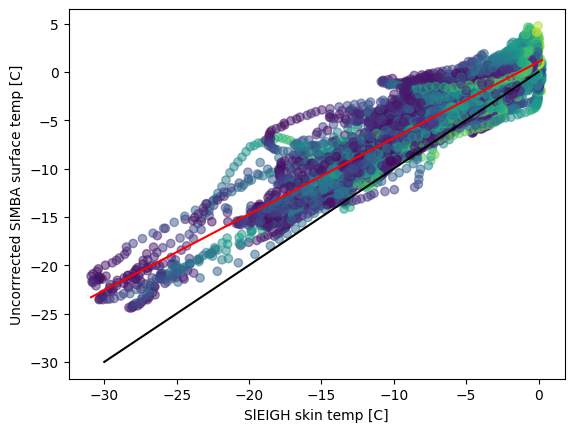

In [50]:
plt.scatter(sleigh_skinT_simba_timesteps, unc_simba_sfc_temp, alpha=.5, c=simba_swn_sfc) #simba_dfrac)#
plt.plot([-30,0],[-30,0], c='k')

unc_simba_sfc_temp = np.ma.masked_invalid(unc_simba_sfc_temp)
sleigh_skinT_simba_timesteps = np.ma.masked_invalid(sleigh_skinT_simba_timesteps)

y = np.squeeze(unc_simba_sfc_temp[~unc_simba_sfc_temp.mask])
x = np.squeeze(sleigh_skinT_simba_timesteps[~unc_simba_sfc_temp.mask])
x = np.ma.masked_invalid(x)

y = y[~x.mask]
x = x[~x.mask]

plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), c='r')
print(np.polyfit(x, y, 1))
plt.xlabel('SlEIGH skin temp [C]')
plt.ylabel('Uncorrrected SIMBA surface temp [C]')
plt.show()

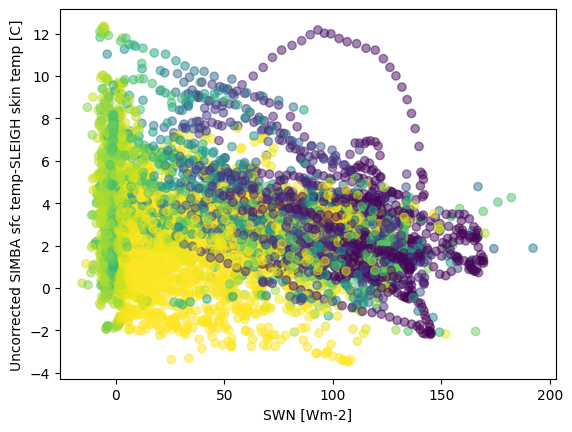

In [51]:
plt.scatter(simba_swn_sfc, unc_simba_sfc_temp-sleigh_skinT_simba_timesteps, alpha=.5, c=simba_dfrac)
# plt.plot([-30,0],[-30,0], c='k')
plt.xlabel('SWN [Wm-2]')
plt.ylabel('Uncorrected SIMBA sfc temp-SLEIGH skin temp [C]')
plt.show()

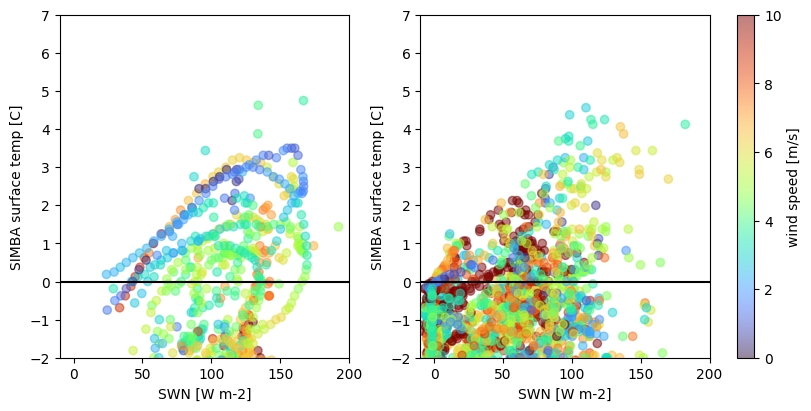

In [52]:
fig, axs = plt.subplots(1,2, figsize=(8,4), constrained_layout=True)

lo_w = np.where(simba_dfrac<.5)[0]
cb = axs[0].scatter(simba_swn_sfc[lo_w], unc_simba_sfc_temp[lo_w], alpha=.5, c=simba_wspd_sfc[lo_w], 
                    cmap=plt.cm.turbo, vmin=0, vmax=10)

hi_w = np.where(simba_dfrac>=.5)[0]
cb = axs[1].scatter(simba_swn_sfc[hi_w], unc_simba_sfc_temp[hi_w], alpha=.5, c=simba_wspd_sfc[hi_w], 
                    cmap=plt.cm.turbo, vmin=0, vmax=10)
plt.colorbar(cb, label='wind speed [m/s]')
# plt.colorbar(cb, label='skin temp [C]')

for ax in axs.ravel():
    ax.axhline(y=0, c='k')
    ax.set_ylim(-2,7)
    ax.set_ylabel('SIMBA surface temp [C]')
    ax.set_xlabel('SWN [W m-2]')
    ax.set_xlim(-10,200)
plt.show()

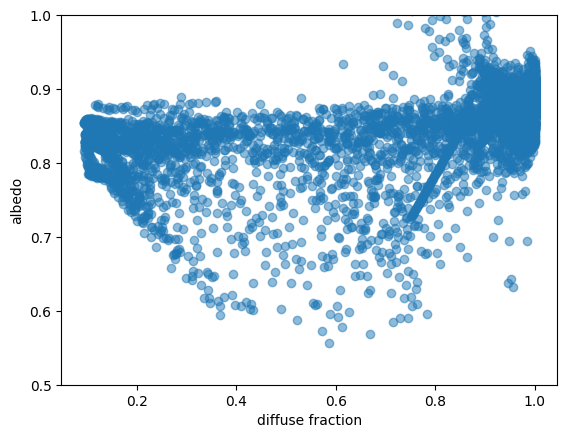

In [53]:
plt.scatter(simba_dfrac, simba_albedo, alpha=.5)
plt.xlabel('diffuse fraction')
plt.ylabel('albedo')
plt.ylim(0.5,1)
plt.show()

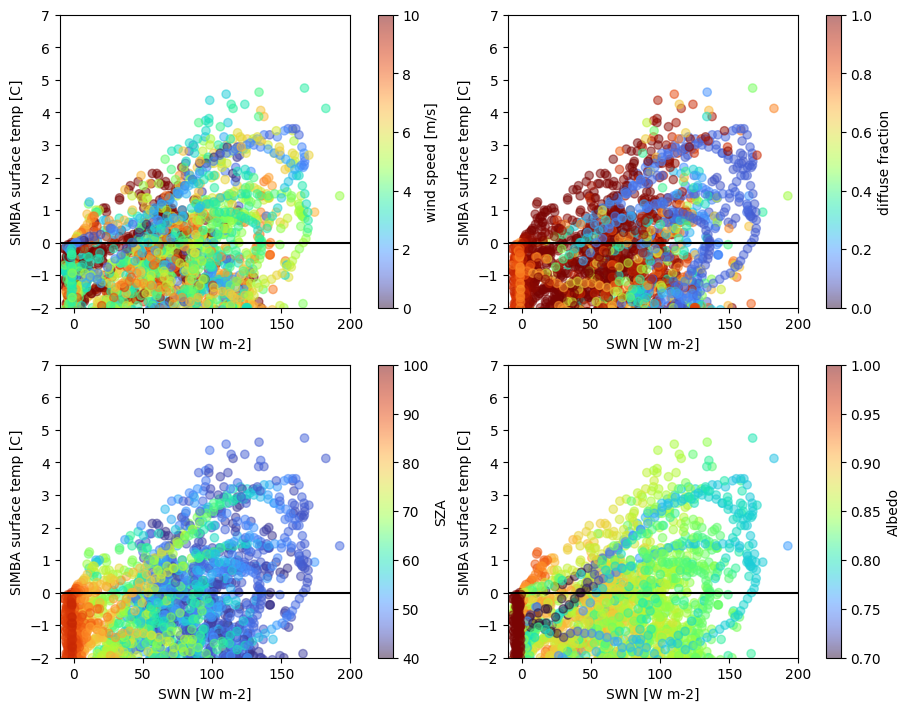

In [54]:
fig, axs = plt.subplots(2,2, figsize=(9,7), constrained_layout=True)

labels = ['wind speed [m/s]','diffuse fraction','SZA','Albedo']
lims = [(0,10), (0,1),(40,100),(.7,1)]
for i, (ax, var) in enumerate(zip(axs.ravel(),[simba_wspd_sfc, simba_dfrac, simba_sza, simba_albedo])):
    cb = ax.scatter(simba_swn_sfc, unc_simba_sfc_temp, alpha=.5, c=var, 
                        cmap=plt.cm.turbo, vmin=lims[i][0], vmax=lims[i][1])
    plt.colorbar(cb, label=labels[i], ax=ax)


    ax.axhline(y=0, c='k')
    ax.set_ylim(-2,7)
    ax.set_ylabel('SIMBA surface temp [C]')
    ax.set_xlabel('SWN [W m-2]')
    ax.set_xlim(-10,200)
plt.show()

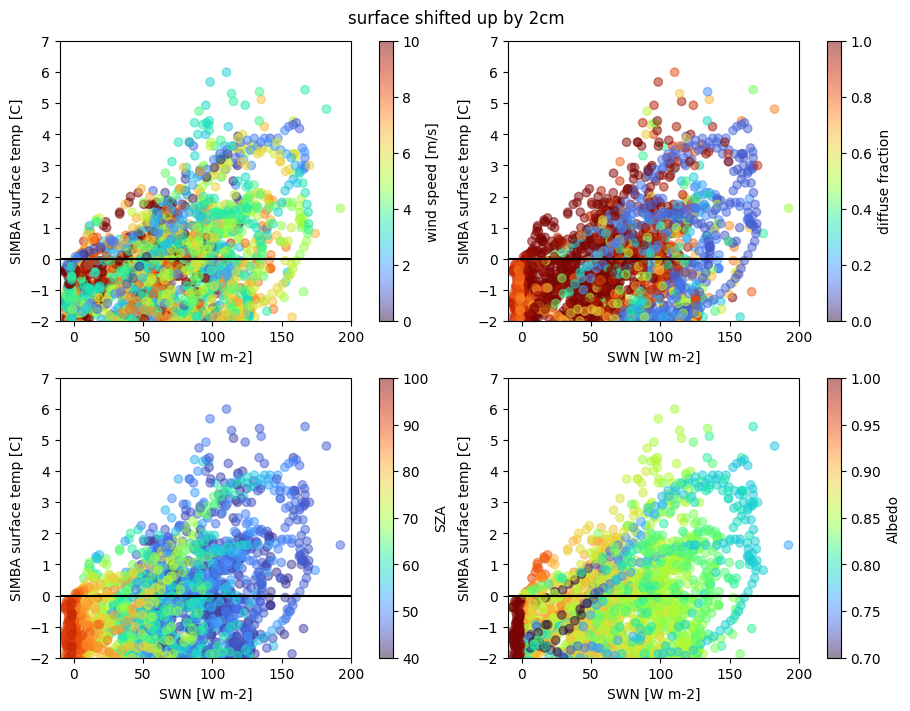

In [55]:
fig, axs = plt.subplots(2,2, figsize=(9,7), constrained_layout=True)

fig.suptitle('surface shifted up by 2cm')

labels = ['wind speed [m/s]','diffuse fraction','SZA','Albedo']
lims = [(0,10), (0,1),(40,100),(.7,1)]
for i, (ax, var) in enumerate(zip(axs.ravel(),[simba_wspd_sfc, simba_dfrac, simba_sza, simba_albedo])):
    cb = ax.scatter(simba_swn_sfc, unc_simba_sfc_temp_shift, alpha=.5, c=var, 
                        cmap=plt.cm.turbo, vmin=lims[i][0], vmax=lims[i][1])
    plt.colorbar(cb, label=labels[i], ax=ax)


    ax.axhline(y=0, c='k')
    ax.set_ylim(-2,7)
    ax.set_ylabel('SIMBA surface temp [C]')
    ax.set_xlabel('SWN [W m-2]')
    ax.set_xlim(-10,200)
plt.show()

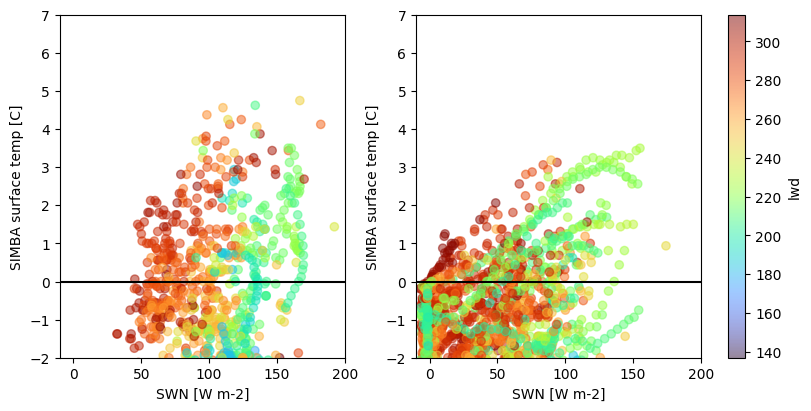

In [56]:
fig, axs = plt.subplots(1,2, figsize=(8,4), constrained_layout=True)

lo_w = np.where(simba_sza<50)[0]
cb = axs[0].scatter(simba_swn_sfc[lo_w], unc_simba_sfc_temp[lo_w], alpha=.5, c=simba_lwd[lo_w], 
                    cmap=plt.cm.turbo)#, vmin=0., vmax=1)

hi_w = np.where(simba_sza>=50)[0]
cb = axs[1].scatter(simba_swn_sfc[hi_w], unc_simba_sfc_temp[hi_w], alpha=.5, c=simba_lwd[hi_w], 
                    cmap=plt.cm.turbo)#, vmin=0., vmax=1)
plt.colorbar(cb, label='lwd')
# plt.colorbar(cb, label='skin temp [C]')

for ax in axs.ravel():
    ax.axhline(y=0, c='k')
    ax.set_ylim(-2,7)
    ax.set_ylabel('SIMBA surface temp [C]')
    ax.set_xlabel('SWN [W m-2]')
    ax.set_xlim(-10,200)
plt.show()

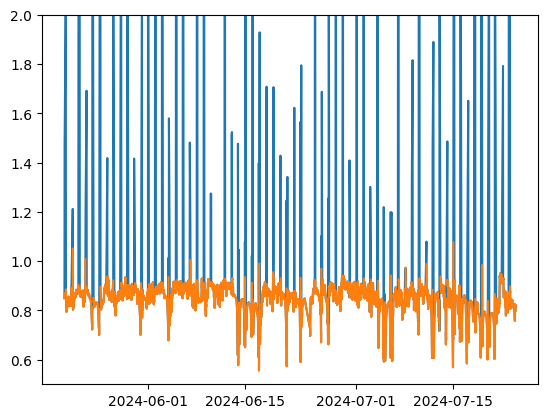

In [57]:
window_size = 6*4+1
weights = np.ones(window_size) / window_size
daily_avg_albedo = np.ma.convolve(simba_albedo, weights, mode='valid')

pad = int(window_size/2)

plt.plot(sfc_dates, simba_albedo)
plt.plot(sfc_dates, np.ma.masked_where(simba_swn_sfc<0, simba_albedo))

# plt.plot(sfc_dates[pad:-pad], daily_avg_albedo)
plt.ylim(0.5,2)
plt.show()

(3771,) (1727,) (6239,)
(3771,) (847,) (6239,)
(3771,) (987,) (6239,)


/tmp/ipykernel_278897/934677614.py:96: UserWarning: Adding colorbar to a different Figure <Figure size 1300x400 with 4 Axes> than <Figure size 400x400 with 1 Axes> which fig.colorbar is called on.
  plt.colorbar(cb, label='Depth below surface [cm]', ax=axs[-1])


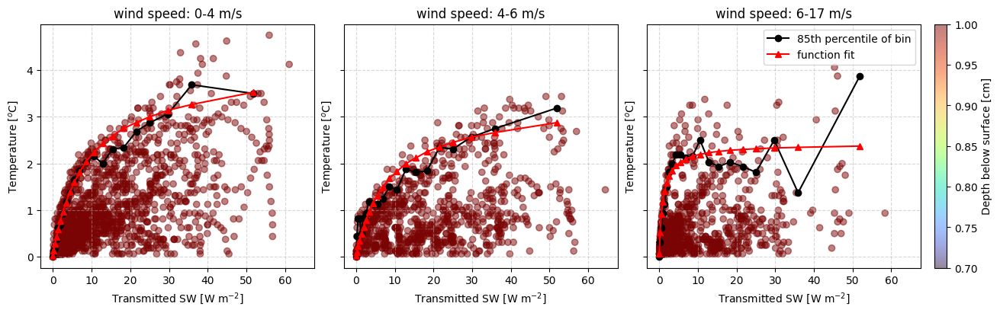

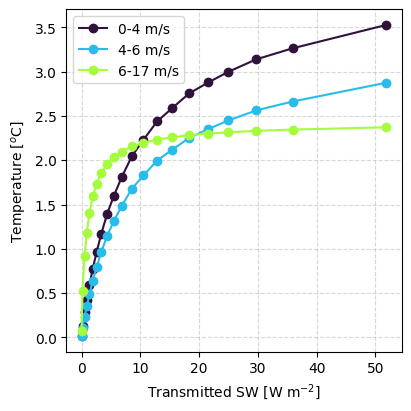

In [58]:
func_params = get_func_correction(sub_wspd_out, sub_swabs_above_out, sub_temps_above_out, sub_depths_out, ks_i, 
                                    wind_ranges=wr, plt_figs=True, binval='percentile', p=85)

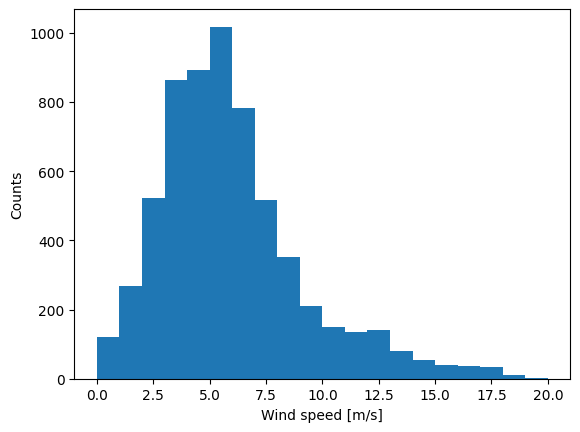

In [59]:
plt.hist(simba_wspd, bins=np.arange(0,21,1))
plt.xlabel('Wind speed [m/s]')
plt.ylabel('Counts')
plt.show()

## try tuning correction to surface and then applying to subsurface

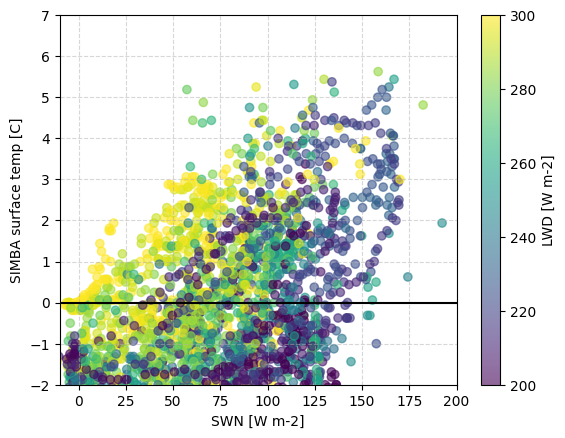

In [548]:
fig, ax = plt.subplots(1)

cb = ax.scatter(simba_swn_sfc, unc_simba_sfc_temp, alpha=.6, c=simba_lwd, vmin=200, vmax=300)
# plt.scatter(np.ma.masked_where(simba_swn_sfc), unc_simba_sfc_temp, alpha=.6)

ax.grid(alpha=.5,ls='--')
plt.colorbar(cb, label='LWD [W m-2]')

ax.axhline(y=0, c='k')
ax.set_ylim(-2,7)
ax.set_ylabel('SIMBA surface temp [C]')
ax.set_xlabel('SWN [W m-2]')
ax.set_xlim(-10,200)

plt.show()

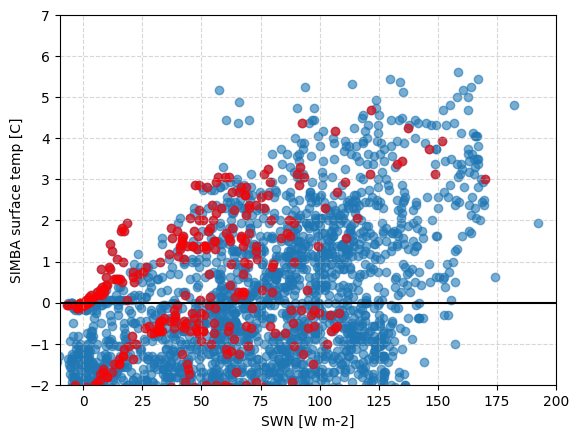

In [549]:
fig, ax = plt.subplots(1)

ax.scatter(simba_swn_sfc, unc_simba_sfc_temp, alpha=.6, c='tab:blue')
ax.scatter(np.ma.masked_where(simba_lwd<300, simba_swn_sfc), unc_simba_sfc_temp, alpha=.6, c='r')

ax.grid(alpha=.5,ls='--')

ax.axhline(y=0, c='k')
ax.set_ylim(-2,7)
ax.set_ylabel('SIMBA surface temp [C]')
ax.set_xlabel('SWN [W m-2]')
ax.set_xlim(-10,200)

plt.show()

In [550]:
sw_bins = np.percentile(simba_swn_sfc[~simba_swn_sfc.mask], np.arange(0,101,10))

above_zero_idx = np.where(unc_simba_sfc_temp>0)

## just test masking these points...
unc_simba_sfc_temp_mask = np.ma.masked_where((simba_swn_sfc<25)&(unc_simba_sfc_temp>1.5), unc_simba_sfc_temp.copy())

bin_xs_90, bin_ys_90 = get_percentile_bin_vals(simba_swn_sfc[above_zero_idx], unc_simba_sfc_temp_mask[above_zero_idx], sw_bins, p=95)
bin_xs_80, bin_ys_80 = get_percentile_bin_vals(simba_swn_sfc[above_zero_idx], unc_simba_sfc_temp_mask[above_zero_idx], sw_bins, p=80)

In [551]:
regress_p90 = stats.linregress(bin_xs_90[~bin_ys_90.mask], bin_ys_90[~bin_ys_90.mask])
regress_p80 = stats.linregress(bin_xs_80[~bin_ys_80.mask], bin_ys_80[~bin_ys_80.mask])

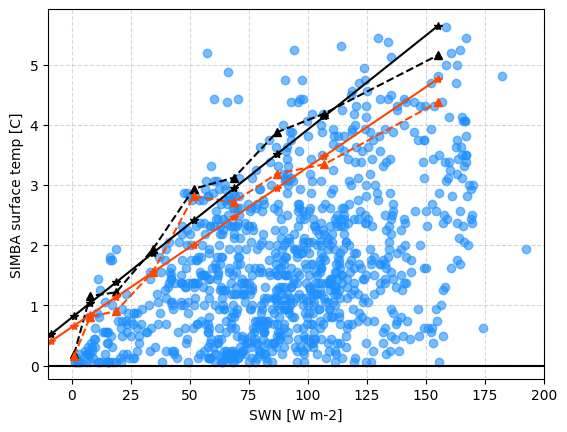

In [568]:
fig, ax = plt.subplots(1)

ax.scatter(simba_swn_sfc[above_zero_idx], unc_simba_sfc_temp[above_zero_idx], alpha=.6, c='dodgerblue')
# ax.scatter(np.ma.masked_where(simba_lwd<300, simba_swn_sfc)[above_zero_idx], unc_simba_sfc_temp[above_zero_idx], c='orangered')
ax.plot(bin_xs_90, bin_ys_90, c='k', marker='^', ls='--')
ax.plot(bin_xs_80, bin_ys_80, c='orangered', marker='^', ls='--')

ax.plot(bin_xs_90, [regress_p90.intercept+x*regress_p90.slope for x in bin_xs_90], c='k', marker='*')
ax.plot(bin_xs_80, [regress_p80.intercept+x*regress_p80.slope for x in bin_xs_80], c='orangered', marker='*')


ax.grid(alpha=.5,ls='--')

ax.axhline(y=0, c='k')
# ax.set_ylim(-2,7)
ax.set_ylabel('SIMBA surface temp [C]')
ax.set_xlabel('SWN [W m-2]')
ax.set_xlim(-10,200)

plt.show()

In [553]:
sw_correction = regress_p90.intercept + simba_swn_sfc*regress_p90.slope
simba_sfc_temp_corrected = unc_simba_sfc_temp - sw_correction

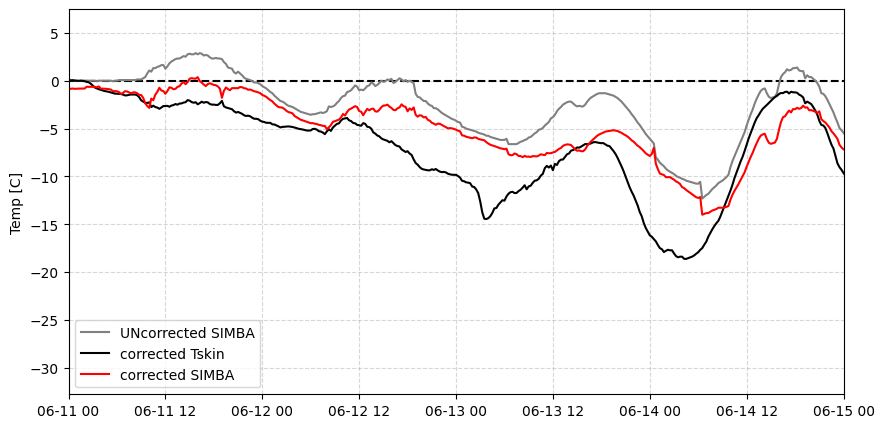

In [572]:
fig, ax = plt.subplots(1, figsize=(10,5))

plt.axhline(y=0, c='k', ls='--')
plt.plot(sfc_dates, unc_simba_sfc_temp, c='gray', label='UNcorrected SIMBA')
plt.plot(sfc_dates, sleigh_skinT_simba_timesteps, c='k', label='corrected Tskin')

plt.plot(sfc_dates, simba_sfc_temp_corrected, c='r', label='corrected SIMBA')

plt.xlim(datetime.datetime(2024,6,11), datetime.datetime(2024,6,15))

plt.legend(loc='best')
plt.ylabel('Temp [C]')
plt.grid(alpha=.5, ls='--')
plt.show()

0.564159430462998


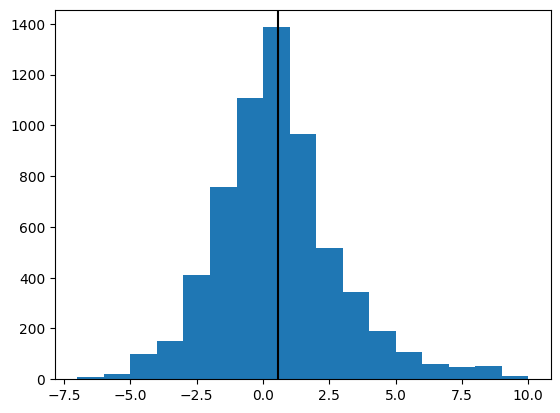

In [555]:
plt.hist(simba_sfc_temp_corrected-sleigh_skinT_simba_timesteps, bins=np.arange(-7,11,1))
plt.axvline(x=np.nanmean(simba_sfc_temp_corrected-sleigh_skinT_simba_timesteps), c='k')
print(np.nanmean(simba_sfc_temp_corrected-sleigh_skinT_simba_timesteps))
plt.show()

#### just correcting surface temp doesn't seem any better than previous attempt

go back to previous method using all points below surface to define correction but without wind speed bins

In [331]:
# masked_simba_sfc = np.ma.masked_where((simba_dates>datetime.datetime(2024,7,19))&(simba_dates<datetime.datetime(2024,7,20)), simba_sfc)
masked_simba_sfc = np.ma.masked_where((simba_dates>datetime.datetime(2024,6,9))&(simba_dates<datetime.datetime(2024,6,13)), simba_sfc)

# HERE! work on NIR fraction of absorption as funciton of diffuse -> when should it be high vs low? and is fnir_i the amount absorbed or transmitted??

In [60]:
tksin_func = stats.linregress([-25,0],[20,40])
dif_frac_func = stats.linregress([0,1],[20,8])
dif_nir_func = stats.linregress([0,1],[0.4,0.6])


EXTINCTION COEFF SHAPE ()
SWT shapes (6239, 200) () (6239, 200)
SWT out shape (6239, 200)


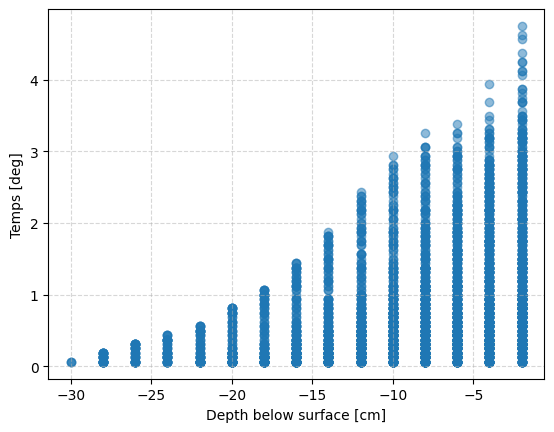

SWT shapes (6239, 160) () (6239, 160)
SWT out shape (6239, 160)
(6239,) (160,) (6239, 160)


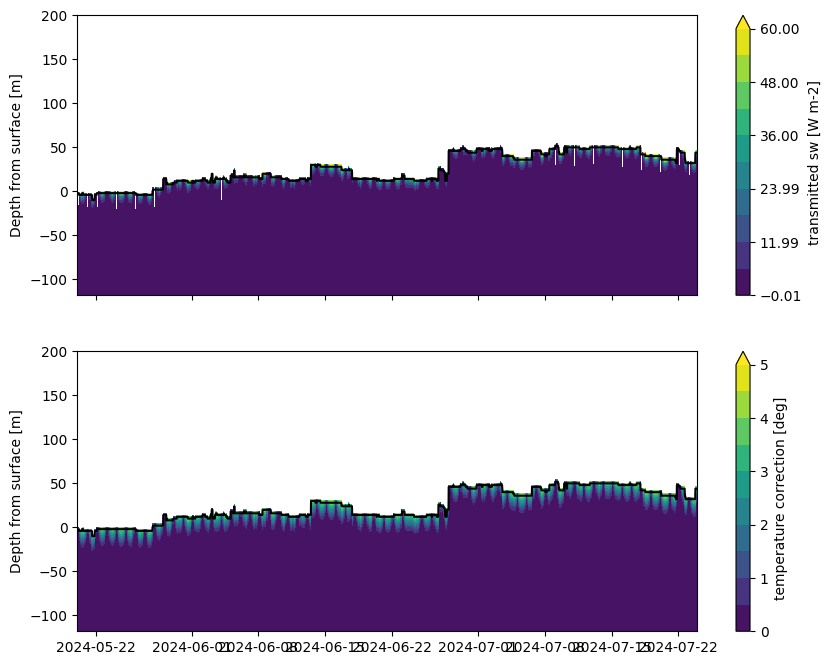

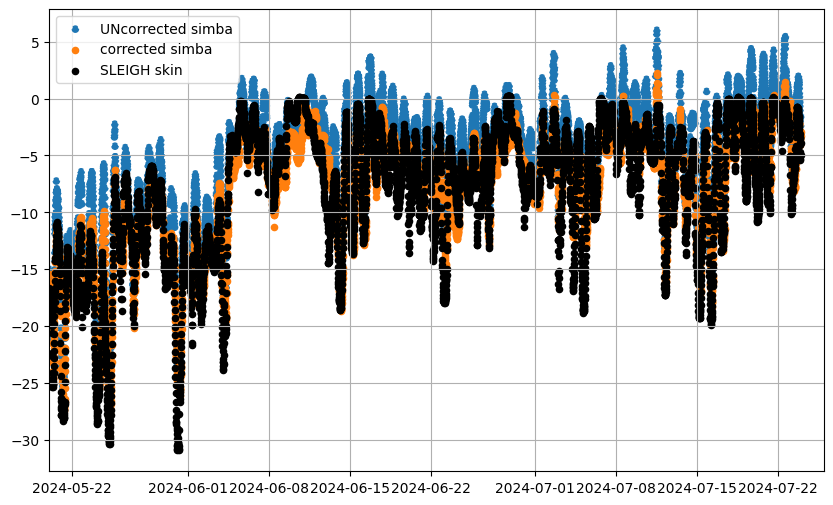

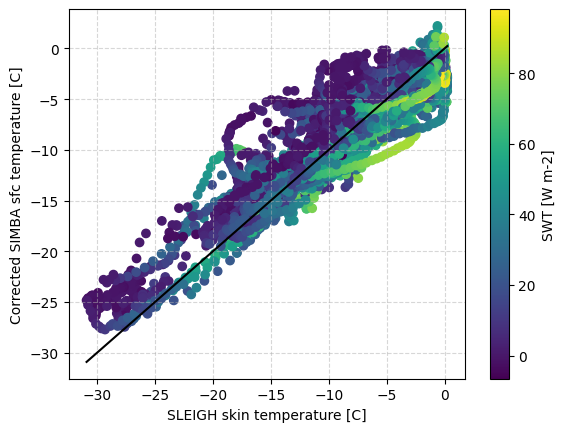

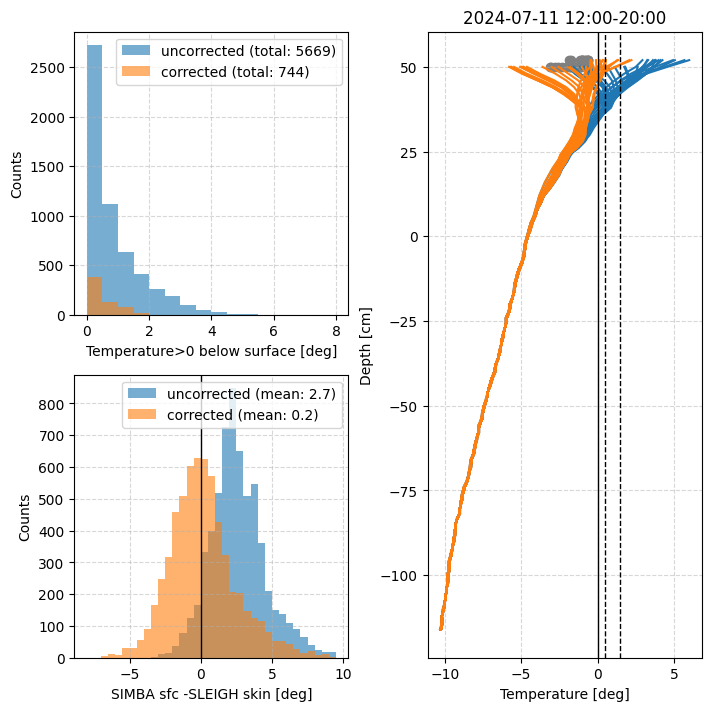

In [67]:
simba_swn = f_swn(simba_seconds)
simba_swn = np.ma.masked_equal(simba_swn, -999)

simba_wspd = f_ws(simba_seconds)
simba_wspd = np.ma.masked_equal(simba_wspd, -999)

# simba_wspd = simba_wspd**2

ks_i = 20.
# ks_i = [5,15]

# ks_non_melt = 20
# ks_hi_for_melt = np.full(sleigh_skinT_simba_timesteps.shape, ks_non_melt)
# ks_hi_for_melt = np.where(sleigh_skinT_simba_timesteps>-0.5, 50, ks_non_melt)
# ks_i = ks_hi_for_melt[:,np.newaxis]
# ks_i = np.squeeze(tksin_func.intercept + tksin_func.slope*sleigh_skinT_simba_timesteps)[:,np.newaxis]
# ks_i = np.squeeze(dif_frac_func.intercept + dif_frac_func.slope*simba_dfrac)[:,np.newaxis]

# fnir_i = 0.5
fnir_i = np.squeeze(dif_nir_func.intercept + dif_nir_func.slope*simba_dfrac)[:,np.newaxis]

sfc_dif_i = 2.


swt_out, simba_skin_2d = get_swt_for_correction_nowspd(ks_i, fnir_i, simba_swn, plt_fig=False)
# simba_temps = np.ma.masked_greater(simba_temps, 40)

sub_temps_above_out, sub_swabs_above_out, sub_depths_out, sub_wspd_out, all_simba_skin_out = get_subsfc_above_zero_vals(simba_depths, swt_out, wspd_2d_out, 
                                                                                                    simba_sfc, sfc_dif_i, simba_temps, 
                                                                                                    melt_idx_in=False)
# sfc_idx_sub = np.where(sub_depths_out<5)[0]

sub_depths_out *= -1.


otuput_params = get_curve_corrections(sub_swabs_above_out, sub_temps_above_out, sub_depths_out, ks_i, 
                                    plt_figs=True,  binval='percentile', p=85) #max



# print(ihs_params)
# # temp_correction_out, swt_out = calc_temp_corrections(simba_sfc, sfc_dif_i, float(ks_i), fnir_i, simba_swn, 
temp_correction_out, swt_out = calc_temp_corrections_nowspd(simba_sfc, sfc_dif_i, ks_i, fnir_i, simba_swn, 
                                            # simba_depths, func_params, plt_figs=True,  swt=True, param_interp='bin',)
                                            simba_depths, otuput_params, plt_figs=True,  swt=True, param_type='ihs')


mc_summary_vals, corrected_temps_new = correct_compare_temp(temp_correction_out, simba_sfc, sfc_dif_i, ks_i, fnir_i, 
                                       simba_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, )
                                       # m=6, d=1, summ_dates=(dt(2024,5,22), dt(2024,6,5)))
                                       # m=6, d=21, summ_dates=(dt(2024,6,6), dt(2024,6,27)))
                                       # m=7, d=21, summ_dates=(dt(2024,6,27), dt(2024,7,24)))

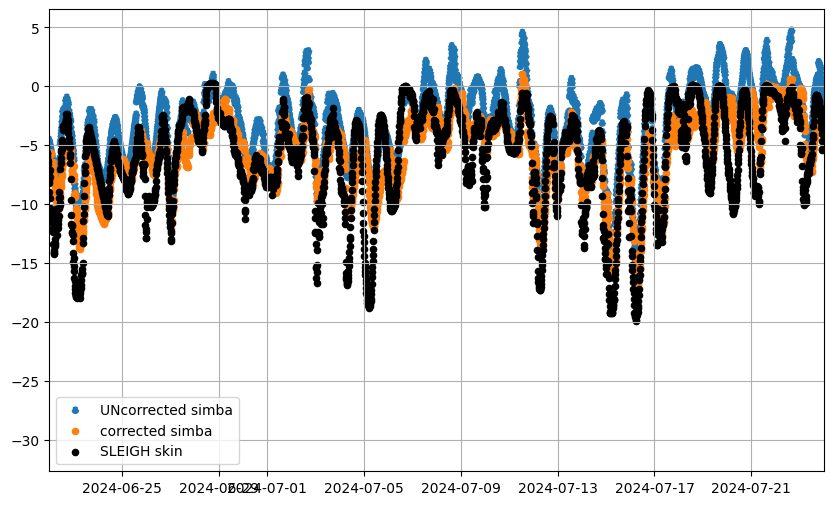

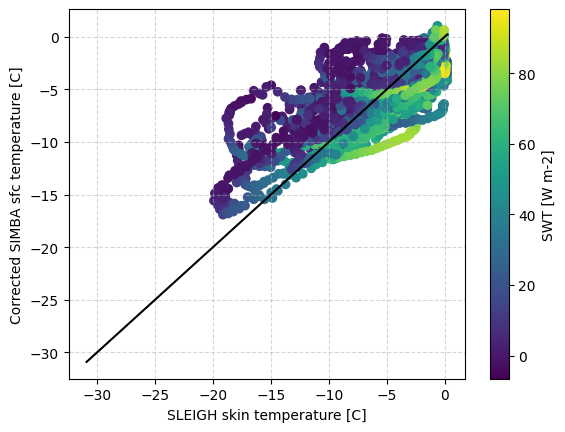

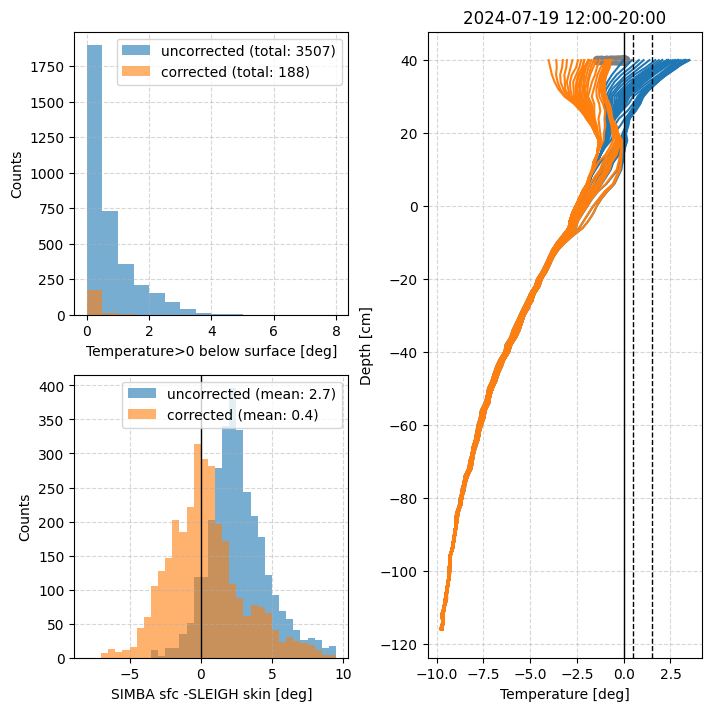

In [66]:
mc_summary_vals, corrected_temps_new = correct_compare_temp(temp_correction_out, simba_sfc, sfc_dif_i, ks_i, fnir_i, 
                                       simba_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, 
                                       # m=6, d=1, summ_dates=(dt(2024,5,22), dt(2024,6,5)))
                                       # m=6, d=21, summ_dates=(dt(2024,6,6), dt(2024,6,27)))
                                       m=7, d=19, summ_dates=(dt(2024,6,22), dt(2024,7,24)))

fn = 'firnprofile_varaince-sfc_38height-split_solar-correction_created_20250711.nc'

ds = Dataset(fn, 'w', format='NETCDF4_CLASSIC')
ds.title='SIMBA data from Raven corrected for suspected solar bias. Created in simba_solar-correction_variance-sfc.ipynb \
            using firnprofile-combined-corrected-at38.sled.level2.beta.15min.20240517-20240821_created_June26_2025.nc.\
            Extinction coefficent was set to  20 m-1. NIR fraction was 0.5, \
            and there was no adjustment to the surface (sfc_dif_i = 0.). Curve fitting was done using the upper 90 percentile of\
            SW bins and an IHS curve for all data combined (no wind speed dependence).\
            Surface used was Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_+4cm_v2_20250710.csv.'

time = ds.createDimension('time', None)
times = ds.createVariable('time', np.float64, ('time',))
times[:] = np.squeeze(simba_seconds)
times.units = 'seconds since 1970-01-01 00:00'
times.calendar = 'standard'

depth = ds.createDimension('initial_height', len(simba_depths))
depths = ds.createVariable('initial_height', np.float64, ('initial_height',))
depths[:] = simba_depths
depths.units = 'cm'


value = ds.createVariable('temp', np.float64, ('time','initial_height',))
value.missing_value = -999
value.units = 'C'
value[:] = corrected_temps_new

ds.close()

In [802]:
dif_masked_sfc = np.ma.masked_where(simba_sza<70, masked_simba_sfc.copy())

In [97]:
simba_swn = f_swn(simba_seconds)
simba_swn = np.ma.masked_equal(simba_swn, -999)

simba_wspd = f_ws(simba_seconds)
simba_wspd = np.ma.masked_equal(simba_wspd, -999)

# simba_wspd = simba_wspd**2

ks_i = 15.
# ks_i = [25,15]
fnir_i = 0.5
sfc_dif_i = 0.#-6.


swt_out, simba_skin_2d = get_swt_for_correction_nowspd(ks_i, fnir_i, simba_swn, plt_fig=False)
# simba_temps = np.ma.masked_greater(simba_temps, 40)

sub_temps_above_out, sub_swabs_above_out, sub_depths_out, sub_wspd_out, all_simba_skin_out = get_subsfc_above_zero_vals(simba_depths, swt_out, wspd_2d_out, 
                                                                                                    dif_masked_sfc, sfc_dif_i, simba_temps, 
                                                                                                    melt_idx_in=False)
# sfc_idx_sub = np.where(sub_depths_out<5)[0]

sub_depths_out *= -1.


otuput_params = get_curve_corrections(sub_swabs_above_out, sub_temps_above_out, sub_depths_out, ks_i, 
                                    plt_figs=True, curve='ihs', binval='percentile', p=90) #max



# print(ihs_params)
# # temp_correction_out, swt_out = calc_temp_corrections(simba_sfc, sfc_dif_i, float(ks_i), fnir_i, simba_swn, 
temp_correction_out, swt_out = calc_temp_corrections_nowspd(dif_masked_sfc, sfc_dif_i, ks_i, fnir_i, simba_swn, 
                                            # simba_depths, func_params, plt_figs=True,  swt=True, param_interp='bin',)
                                            simba_depths, otuput_params, plt_figs=True,  swt=True, param_type='ihs')


mc_summary_vals, corrected_temps_new = correct_compare_temp(temp_correction_out, dif_masked_sfc, sfc_dif_i, ks_i, fnir_i, 
                                       simba_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, )
                                       # m=6, d=1, summ_dates=(dt(2024,5,22), dt(2024,6,5)))
                                       # m=6, d=21, summ_dates=(dt(2024,6,6), dt(2024,6,27)))
                                       # m=7, d=21, summ_dates=(dt(2024,6,27), dt(2024,7,24)))

EXTINCTION COEFF SHAPE ()
SWT shapes (6239, 200) () (6239, 200)
SWT out shape (6239, 200)


NameError: name 'dif_masked_sfc' is not defined

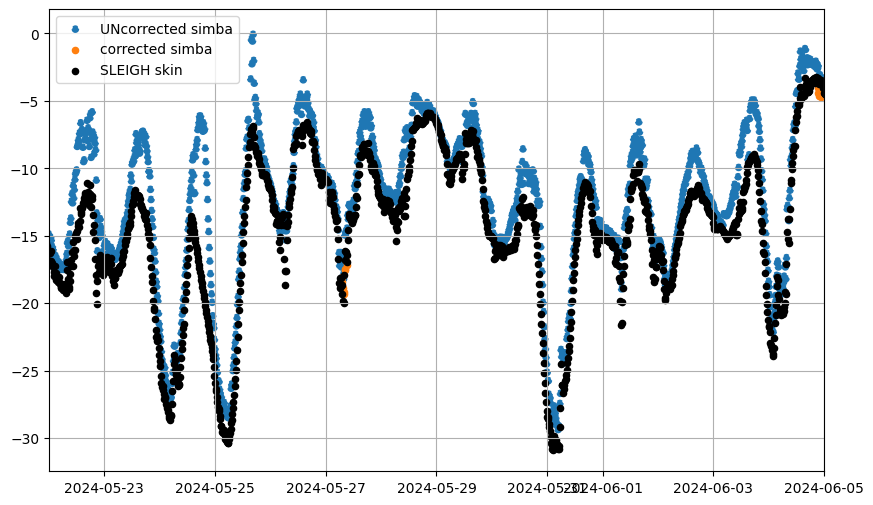

/home/asledd/.conda/envs/plot_env/lib/python3.9/site-packages/matplotlib/cbook.py:1762: UserWarning: Warning: converting a masked element to nan.
  return math.isfinite(val)


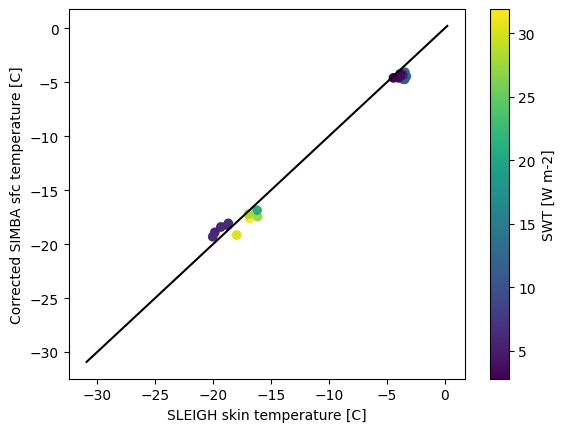

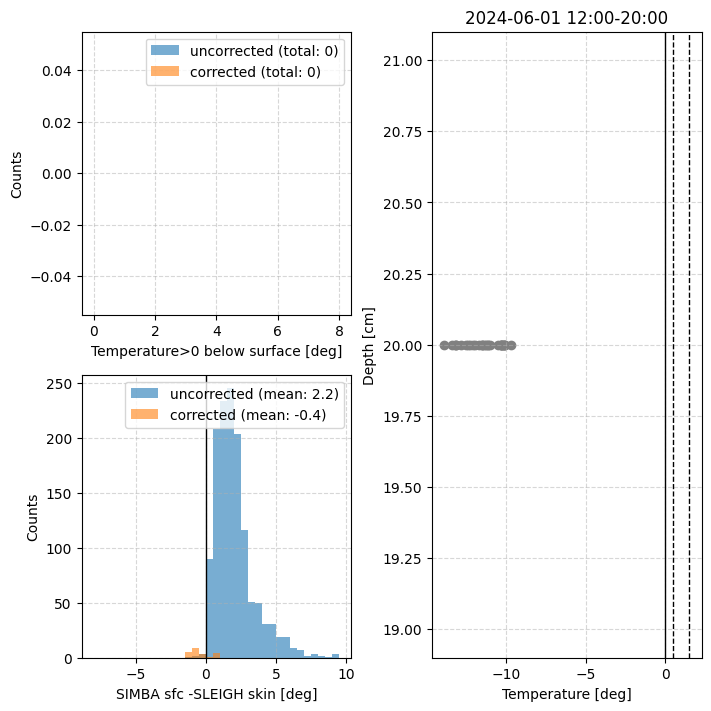

In [804]:
mc_summary_vals, corrected_temps_new = correct_compare_temp(temp_correction_out, simba_sfc, sfc_dif_i, ks_i, fnir_i, 
                                       simba_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, 
                                       m=6, d=1, summ_dates=(dt(2024,5,22), dt(2024,6,5)))
                                       # m=6, d=21, summ_dates=(dt(2024,6,6), dt(2024,6,27)))
                                       # m=7, d=21, summ_dates=(dt(2024,6,27), dt(2024,7,24)))

### am i missing something (some physics?) for the correction?

In [805]:
# sleigh_skinT_simba_timesteps = np.ma.masked_less(sleigh_skinT_simba_timesteps, 0)-273.15

correted_simba_sfc_temp = corrected_temps_new[np.where(heights_repeat==sfc_repeat)]

In [806]:
disagree_idx = np.where((correted_simba_sfc_temp-sleigh_skinT_simba_timesteps)>5)
print(simba_dates[disagree_idx])

[datetime.datetime(2024, 5, 22, 20, 45)
 datetime.datetime(2024, 7, 2, 15, 0)
 datetime.datetime(2024, 7, 8, 15, 15)
 datetime.datetime(2024, 7, 11, 11, 0)
 datetime.datetime(2024, 7, 11, 11, 15)
 datetime.datetime(2024, 7, 11, 11, 30)
 datetime.datetime(2024, 7, 11, 11, 45)
 datetime.datetime(2024, 7, 11, 12, 45)
 datetime.datetime(2024, 7, 11, 13, 0)
 datetime.datetime(2024, 7, 11, 13, 15)
 datetime.datetime(2024, 7, 11, 14, 45)
 datetime.datetime(2024, 7, 19, 16, 45)
 datetime.datetime(2024, 7, 22, 13, 30)
 datetime.datetime(2024, 7, 22, 14, 0)
 datetime.datetime(2024, 7, 22, 14, 15)
 datetime.datetime(2024, 7, 22, 14, 30)
 datetime.datetime(2024, 7, 22, 14, 45)
 datetime.datetime(2024, 7, 22, 15, 15)
 datetime.datetime(2024, 7, 22, 15, 30)
 datetime.datetime(2024, 7, 22, 16, 0)]


In [807]:
adjust_simba_sfc = simba_sfc.copy()

# adjust_simba_sfc = np.where((correted_simba_sfc_temp-sleigh_skinT_simba_timesteps)<-5, simba_sfc+2, simba_sfc)
# adjust_simba_sfc = np.where((correted_simba_sfc_temp-sleigh_skinT_simba_timesteps)>5, simba_sfc-6, simba_sfc)

adjust_simba_sfc = np.where((simba_dates>datetime.datetime(2024,7,))&(), simba_sfc+2, simba_sfc)


TypeError: function missing required argument 'day' (pos 3)

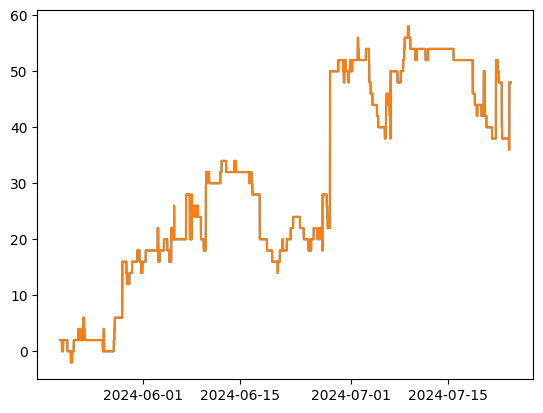

In [808]:
plt.plot(simba_dates, simba_sfc)
plt.plot(simba_dates, adjust_simba_sfc)

EXTINCTION COEFF SHAPE ()
SWT shapes (6239, 200) () (6239, 200)
SWT out shape (6239, 200)


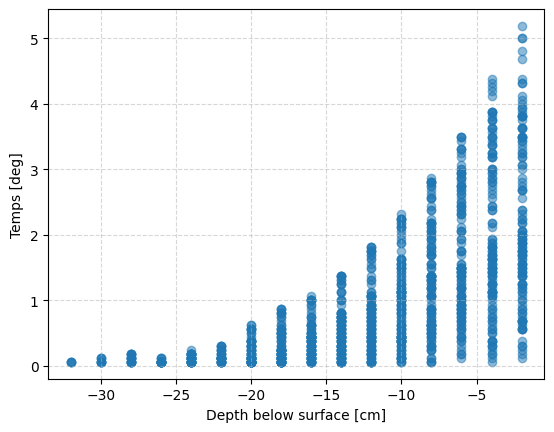

SWT shapes (6239, 160) () (6239, 160)
SWT out shape (6239, 160)
(6239,) (160,) (6239, 160)


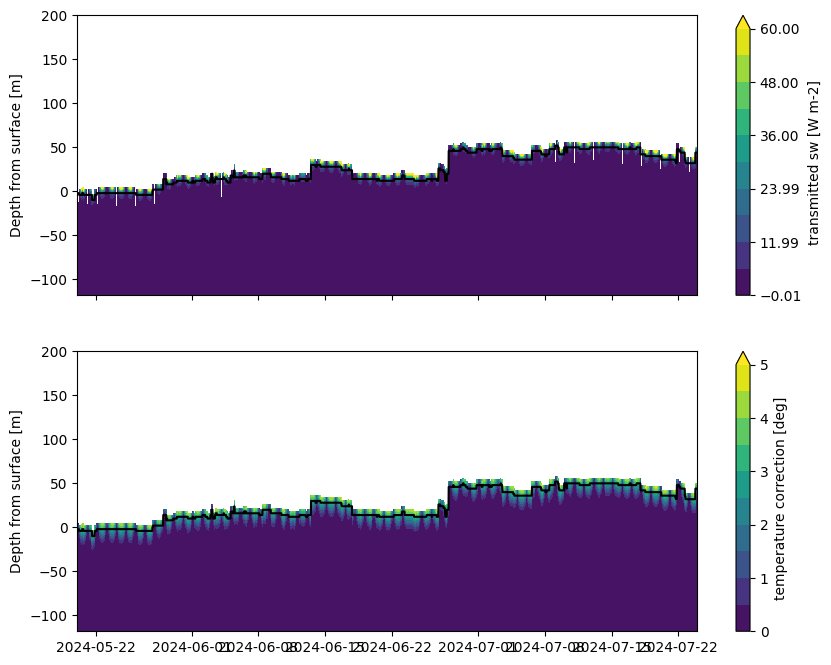

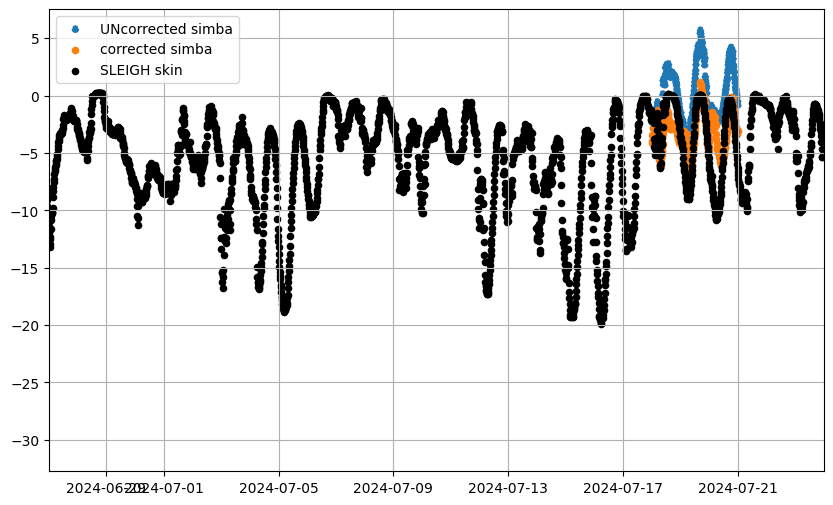

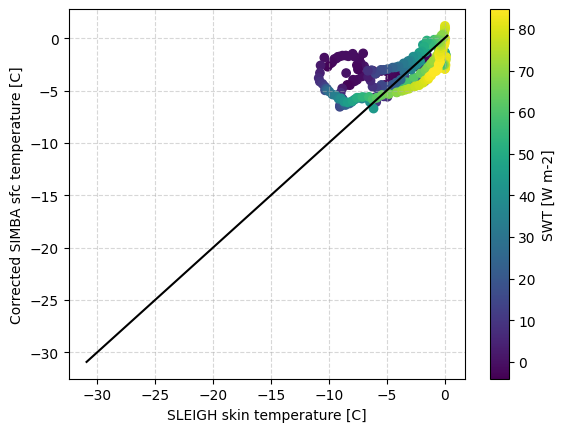

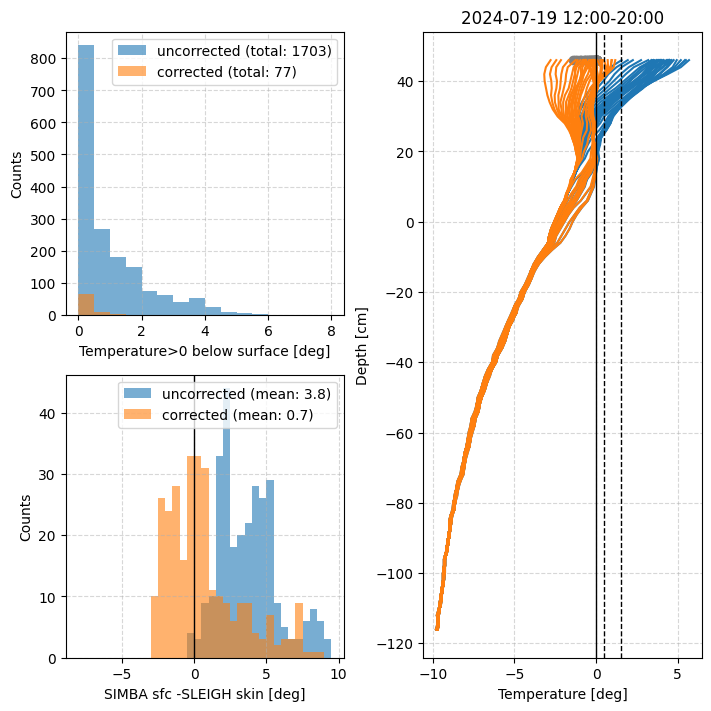

In [109]:
simba_swn = f_swn(simba_seconds)
simba_swn = np.ma.masked_equal(simba_swn, -999)

simba_wspd = f_ws(simba_seconds)
simba_wspd = np.ma.masked_equal(simba_wspd, -999)

# simba_wspd = simba_wspd**2

ks_i = 20.
# ks_i = [15,25]

fnir_i = 0.5
sfc_dif_i = 6#-6.

testing_mask_temps = np.ma.masked_where(simba_dates_2d<dt(2024,7,18), simba_temps)
testing_mask_temps = np.ma.masked_where(simba_dates_2d>dt(2024,7,21), testing_mask_temps)

swt_out, simba_skin_2d = get_swt_for_correction_nowspd(ks_i, fnir_i, simba_swn, plt_fig=False)
# simba_temps = np.ma.masked_greater(simba_temps, 40)

sub_temps_above_out, sub_swabs_above_out, sub_depths_out, sub_wspd_out, all_simba_skin_out = get_subsfc_above_zero_vals(simba_depths, swt_out, 
                                                                                                    wspd_2d_out, 
                                                                                                    simba_sfc, sfc_dif_i, 
                                                                                                    testing_mask_temps, 
                                                                                                    melt_idx_in=False)
# sfc_idx_sub = np.where(sub_depths_out<5)[0]

sub_depths_out *= -1.


otuput_params = get_curve_corrections(sub_swabs_above_out, sub_temps_above_out, sub_depths_out, ks_i, 
                                    plt_figs=False,  binval='percentile', p=90) #max



# print(ihs_params)
# # temp_correction_out, swt_out = calc_temp_corrections(simba_sfc, sfc_dif_i, float(ks_i), fnir_i, simba_swn, 
temp_correction_out, swt_out = calc_temp_corrections_nowspd(simba_sfc, sfc_dif_i, ks_i, fnir_i, simba_swn, 
                                            # simba_depths, func_params, plt_figs=True,  swt=True, param_interp='bin',)
                                            simba_depths, otuput_params, plt_figs=True,  swt=True, param_type='ihs')


mc_summary_vals, corrected_temps_new = correct_compare_temp(temp_correction_out, simba_sfc, sfc_dif_i, ks_i, fnir_i, 
                                       testing_mask_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, 
                                       # m=6, d=1, summ_dates=(dt(2024,5,22), dt(2024,6,5)))
                                       # m=6, d=21, summ_dates=(dt(2024,6,6), dt(2024,6,27)))
                                       m=7, d=19, summ_dates=(dt(2024,6,27), dt(2024,7,24)))

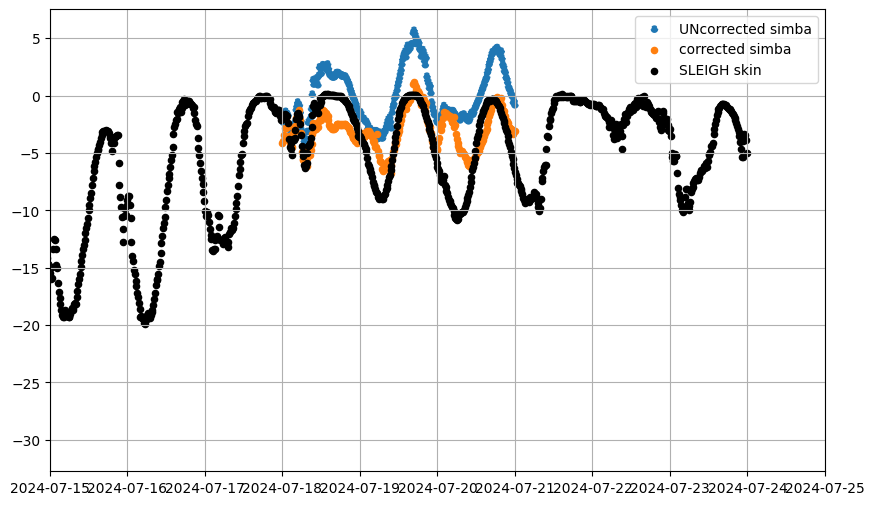

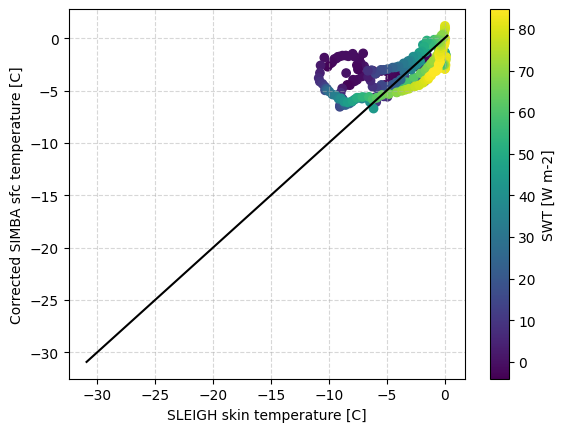

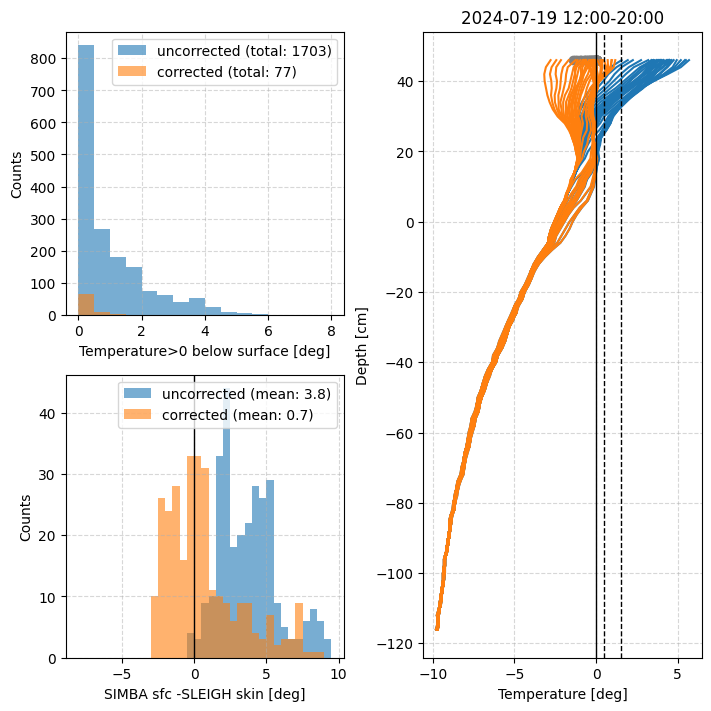

In [110]:
mc_summary_vals, corrected_temps_new = correct_compare_temp(temp_correction_out, simba_sfc, sfc_dif_i, ks_i, fnir_i, 
                                       testing_mask_temps, simba_depths, mc_fig_savepath, out_correct_t=True, swi=swt_out, 
                                       # m=6, d=1, summ_dates=(dt(2024,5,22), dt(2024,6,5)))
                                       # m=6, d=21, summ_dates=(dt(2024,6,6), dt(2024,6,27)))
                                       m=7, d=19, summ_dates=(dt(2024,7,15), dt(2024,7,25)))

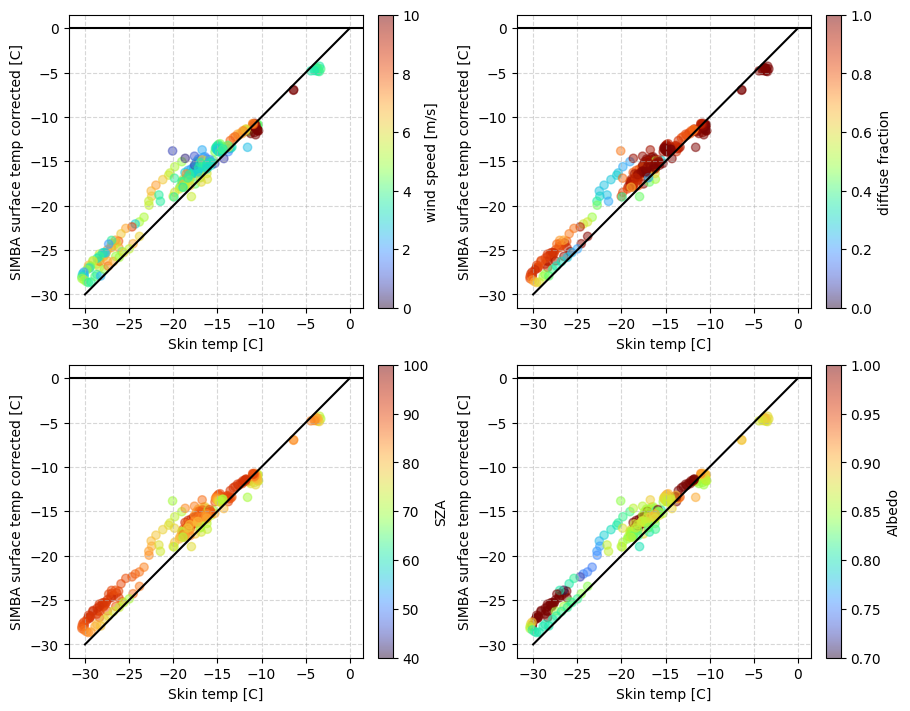

In [815]:
fig, axs = plt.subplots(2,2, figsize=(9,7), constrained_layout=True)

labels = ['wind speed [m/s]','diffuse fraction','SZA','Albedo']
lims = [(0,10), (0,1),(40,100),(.7,1)]
for i, (ax, var) in enumerate(zip(axs.ravel(),[simba_wspd_sfc, simba_dfrac, simba_sza, simba_albedo])):
    cb = ax.scatter(sleigh_skinT_simba_timesteps, correted_simba_sfc_temp, alpha=.5, c=var, 
                        cmap=plt.cm.turbo, vmin=lims[i][0], vmax=lims[i][1])
    plt.colorbar(cb, label=labels[i], ax=ax)

    ax.plot([-30,0],[-30,0], c='k')

    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
    # ax.set_ylim(-2,7)
    ax.set_ylabel('SIMBA surface temp corrected [C]')
    ax.set_xlabel('Skin temp [C]')
    # ax.set_xlim(-10,200)
plt.show()

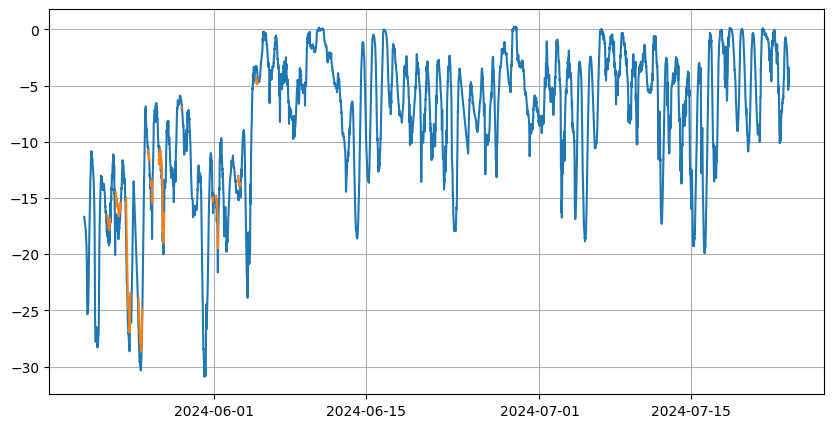

In [811]:
fig, ax = plt.subplots(1, figsize=(10,5))

plt.plot(simba_dates, sleigh_skinT_simba_timesteps)
plt.plot(simba_dates, correted_simba_sfc_temp)
plt.grid()
plt.show()

In [62]:
def get_swt_for_correction_nowspd(ks, fnir, swn_in, plt_fig=False):
    """ ks: extinction coefficient for visible radiation in snow
        fnir: fraction of SW that's in NIR range, as opposed to visible
        swn_in: SWN; 1D
    """
    
    # setup sw arrays
    dpths = np.arange(0,4.0,.02)
    dpths_2d = np.repeat(dpths[np.newaxis,:], swn_in.shape[0], axis=0)
    
    simba_swn_2d = np.repeat(swn_in[:,np.newaxis], dpths.shape[0], axis=1)
    simba_swn_2d = np.ma.masked_less(simba_swn_2d, 0)

    ## adding simba_skin in not properly just in order to see what it looks like in figure instead of depth below surface
    simba_skin_2d = np.repeat(simba_skin[:,np.newaxis], dpths.shape[0], axis=1)
    # simba_skin_2d = np.repeat(simba_albedo[:,np.newaxis], dpths.shape[0], axis=1)



    ## calculate transmitted below surface
    if isinstance(ks, float):
        ks_vis = ks
    elif len(ks)==2:
        ks_vis = np.linspace(ks[0], ks[1], simba_swn_2d.shape[0])[:,np.newaxis]
    else:
        ks_vis = ks
    print('EXTINCTION COEFF SHAPE', np.shape(ks_vis))
    sw_abs, sw_trans = calc_sw_ext(simba_swn_2d, ks_vis, dpths_2d, f_nir=fnir)
    sw_trans = np.ma.masked_array(sw_trans, mask=simba_swn_2d.mask)

    if plt_fig:
        plt.plot(sw_trans[1020,:], -dpths_2d[0,:], marker='o')
        plt.ylabel('Distance form surface [m]')
        plt.xlabel('SW transmitted [Wm-2]')
        plt.grid(ls='--', alpha=.5)
        # plt.title('$\kappa_s$={:.0f}; NIR={:.2f}'.format(ks, fnir))
        plt.show()

    return sw_trans, simba_skin_2d

In [63]:
def get_curve_corrections(all_subsfc_swabs_above_in, all_subsfc_temps_above_in, \
                       all_subsfc_depths_in, ks_in, plt_figs=False, curve='ihs', binval='max', p=90):
    max_wspd = []
    ihs_vals = []

    func_vals_a = []
    func_vals_b = []

    bins = np.percentile(all_subsfc_swabs_above_in[~all_subsfc_swabs_above_in.mask], np.arange(0,101,5))


    ## exact choice of percentiles vs max vs whatever can be tested
    if binval=='max':
        bin_xs, bin_ys = get_max_bin_vals(all_subsfc_swabs_above_in, all_subsfc_temps_above_in, bins)
    elif binval=='percentile':
        bin_xs, bin_ys = get_percentile_bin_vals(all_subsfc_swabs_above_in, all_subsfc_temps_above_in, bins, p=p)

    ## force (0,0) point
    bin_xs = np.ma.concatenate( ([0],bin_xs) )
    bin_ys = np.ma.concatenate( ([0],bin_ys) )

    bin_xs = np.squeeze(bin_xs[~bin_ys.mask])
    bin_ys = np.squeeze(bin_ys[~bin_ys.mask])

    curve_fits = {}
    # if curve=='ihs':
    # IHS fit
    popt, pcov = curve_fit(inverse_hyperbolic_sine, bin_xs, bin_ys)
    
    # Extract the fitted parameter
    theta_fit = popt[0]
    curve_fits['ihs'] = theta_fit
    ## used like inverse_hyperbolic_sine(exmaple_sw, theta)
    
    # if curve=='func':
    # another curve equation
    popt, pcov = curve_fit(func, bin_xs, bin_ys)

    # Extract the fitted parameter
    a_fit = popt[0]
    b_fit = popt[1]
    curve_fits['func'] = (a_fit, b_fit)
    # used like func(exmaple_sw, log_a, log_b)

    plt.scatter(all_subsfc_depths_in, all_subsfc_temps_above_in, alpha=.5)
    plt.grid(alpha=.5, ls='--')
    plt.ylabel('Temps [deg]')
    plt.xlabel('Depth below surface [cm]')
    plt.show()
    
    return curve_fits

In [64]:
def calc_temp_corrections_nowspd(sfc_in, sfc_dif, ks, fnir, sw_in, dpths_in, correction_params, plt_figs=False, param_type='ihs', swt=False):
    ## differenceing surface here!!!!    
    sfc_used = sfc_in + sfc_dif
    
    # make simba heights/depths relative to surface
    depths_rel_to_sfc = np.repeat(dpths_in[np.newaxis,:], sfc_in.shape[0], axis=0)
    
    sfc_height_2d = np.repeat(sfc_used[:,np.newaxis], dpths_in.shape[0], axis=1)

    # depths_rel_to_sfc = depths_rel_to_sfc + abs(sfc_height_2d)
    depths_rel_to_sfc = depths_rel_to_sfc - sfc_height_2d
    depths_rel_to_sfc = np.ma.masked_greater(depths_rel_to_sfc, 0)/100.

    simba_swn_2d = np.repeat(sw_in[:,np.newaxis], depths_rel_to_sfc.shape[1], axis=1)

    if isinstance(ks, float):
        ks_vis = ks
    elif len(ks)==2:
        ks_vis = np.linspace(ks[0], ks[1], simba_swn_2d.shape[0])[:,np.newaxis]
    else:
        ks_vis = ks

    simba_swa, simba_swt = calc_sw_ext(simba_swn_2d, ks_vis, depths_rel_to_sfc, f_nir=fnir)

    # simba_swa = np.ma.masked_array(simba_swa, mask=depths_rel_to_sfc.mask)
    simba_swt = np.ma.masked_array(simba_swt, mask=depths_rel_to_sfc.mask)
    
        
    if param_type=='ihs':    
        temp_correction = calc_ihs_temp_correct_nowspd(simba_swt, correction_params[param_type])
    elif param_type=='func':
        temp_correction = calc_func_temp_correct_nowspd(simba_swt, correction_params[param_type])
        
    if plt_figs:
        fig, axs = plt.subplots(2, figsize=(10,8), sharex=True, sharey=True)
        print(simba_dates.shape, simba_depths.shape, simba_swt.shape)
        cb = axs[0].contourf(simba_dates, simba_depths, np.swapaxes(simba_swt,0,1), levels=np.linspace(-.01,60,11), extend='max')
        plt.colorbar(cb, label='transmitted sw [W m-2]', ax=axs[0])
        axs[0].set_ylabel('Depth from surface [m]')
        axs[0].plot(simba_dates, simba_sfc, label='interped', c='k')

        cb = axs[1].contourf(simba_dates, simba_depths, np.swapaxes(temp_correction,0,1), levels=np.arange(0,5.01,.5), extend='max')
        plt.colorbar(cb, label='temperature correction [deg]', ax=axs[1])
        axs[1].set_ylabel('Depth from surface [m]')
        axs[1].plot(simba_dates, simba_sfc, label='interped', c='k')

        # axs[0].set_ylim(-380,-320)
        # axs[0].set_xlim(dt(2024,6,1),dt(2024,6,25))
        # plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_simba_correction_fig4_20ks_0.5nir_-6sfc.png', dpi=250)

        plt.show()

    if swt:
        # print(simba_swt.shape, temp_correction.shape)
        return temp_correction, simba_swt
    else:
        return temp_correction

# some old analysis down here from notebook i duplicated for this...

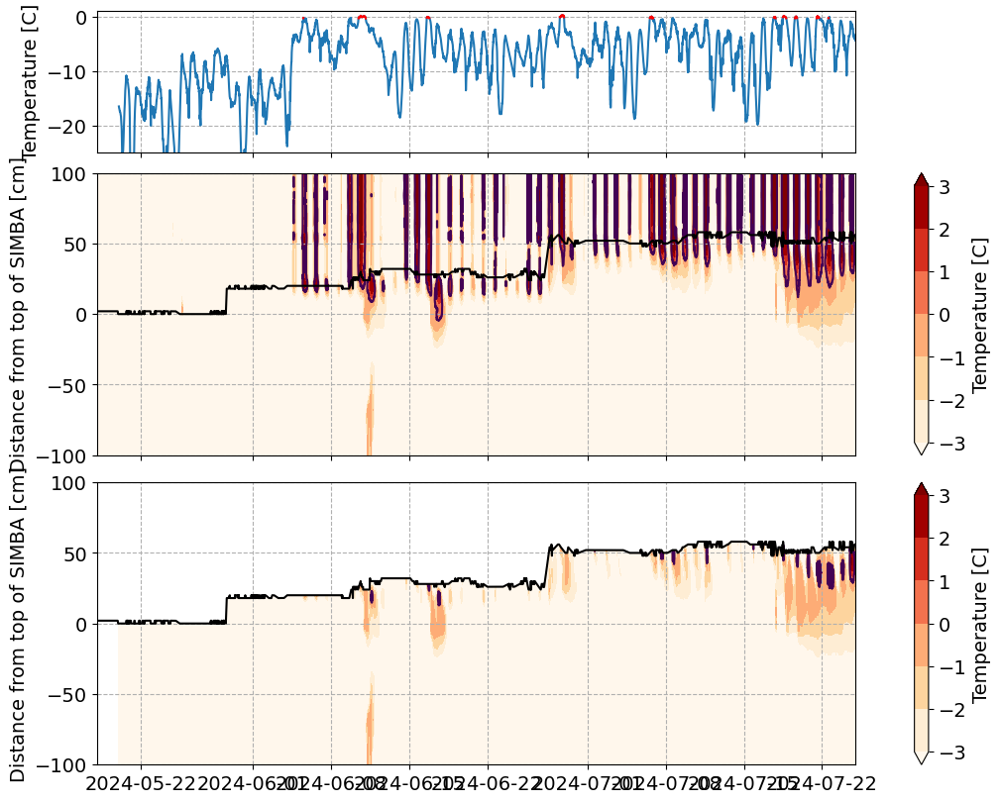

In [122]:
fig, axs = plt.subplots(3, figsize=(10,8), constrained_layout=True, sharex=True, gridspec_kw=dict(height_ratios=[1,2,2]))

axs[0].plot(simba_dates, simba_skin-273.15, label='SLEIGH skin')
axs[0].plot(simba_dates, np.ma.masked_less(simba_skin-273.15, -0.32), c='r')
axs[0].set_ylabel('Temperature [C]')

# axs[0].plot(simba_dates, corr_sfc_temp, label='corrected SIMBA sfc')

cb = axs[1].contourf(simba_dates, simba_depths, np.swapaxes(simba_temps,0,1),
                cmap=plt.cm.OrRd, levels=np.arange(-3,4,1), extend='both')
axs[1].contour(simba_dates, simba_depths, np.swapaxes(simba_temps,0,1),
                levels=[0], extend='both')
plt.colorbar(cb, ax=axs[1], label='Temperature [C]')

cb = axs[2].contourf(simba_dates, simba_depths, np.swapaxes(corrected_temps_new,0,1),
                cmap=plt.cm.OrRd, levels=np.arange(-3,4,1), extend='both')
axs[2].contour(simba_dates, simba_depths, np.swapaxes(corrected_temps_new,0,1),
                levels=[0], extend='both')
plt.colorbar(cb, ax=axs[2], label='Temperature [C]')

for i, ax in enumerate(axs.ravel()):
    ax.grid(ls='--')
    if i>0:
        ax.plot(simba_dates, simba_sfc, c='k')
        # ax.plot(simba_dates, simba_sfc-6.,  c='k')# ls='--',

        # ax.plot(sleigh_dates, asfs_data_lev2['snow_depth']-350, c='c')
        ax.set_ylabel('Distance from top of SIMBA [cm]')
        ax.set_ylim(-100, 100)

# axs[0].set_xlim(datetime.datetime(2024,6,21),datetime.datetime(2024,6,25))
axs[0].set_ylim(-25,1)
# axs[2].set_ylim(0,60)
# axs[1].set_xlim(plt_times_not_smooth[0], plt_times_not_smooth[-1])

# plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_skinT_un_corrected_simba_temps_20ks_0.5nir_-6sfc.png', dpi=250)

plt.show()

Look at profiles. From

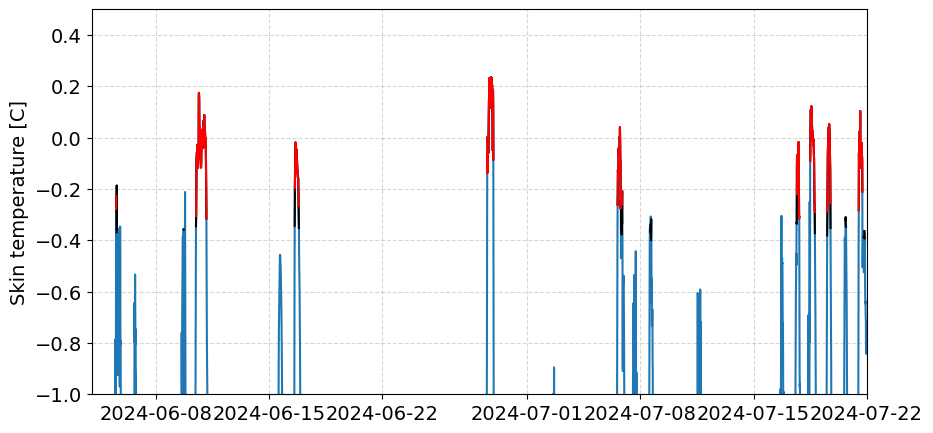

In [123]:
fig, ax = plt.subplots(1, figsize=(10,5))
plt.plot(simba_dates, simba_skin-273.15)
plt.plot(simba_dates, np.ma.masked_less(simba_skin-273.15, -0.4), c='k')
plt.plot(simba_dates, np.ma.masked_less(simba_skin-273.15, -0.32), c='r')

plt.ylabel('Skin temperature [C]')
plt.grid(ls='--', alpha=.5)
plt.ylim(-1,.5)
plt.xlim(dt(2024,6,4), dt(2024,7,22))
# plt.xlim(dt(2024,6,4), dt(2024,6,15))

plt.show()

## This should probably be in a different file, but this is what I have open

Want to get temperature profiles relative *to the surface*

In [124]:
depths_rel_to_sfc = np.repeat(simba_depths[np.newaxis,:], simba_temps.shape[0], axis=0)

sfc_2d = np.ma.repeat(simba_sfc[:,np.newaxis], simba_temps.shape[1], axis=1)
depths_rel_to_sfc = depths_rel_to_sfc-sfc_2d

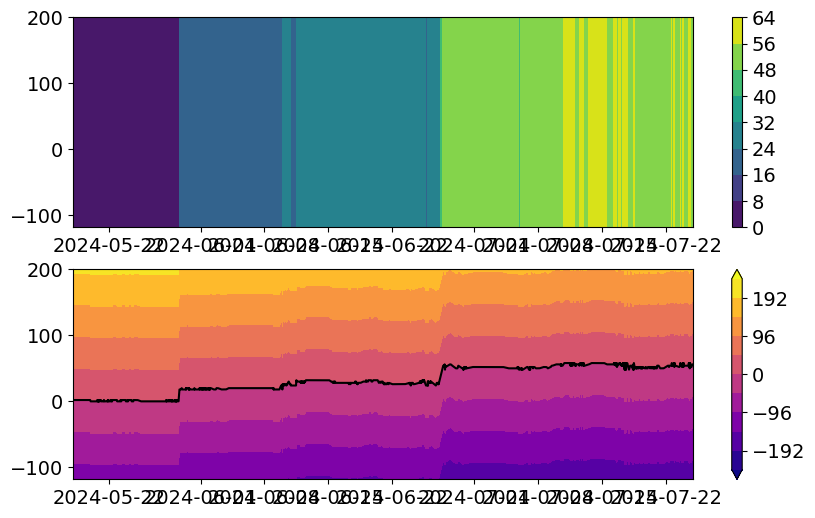

In [125]:
fig, axs = plt.subplots(2, figsize=(10,6))
cb = axs[0].contourf(simba_dates, simba_depths, np.swapaxes(sfc_2d,0,1),)
plt.colorbar(cb, ax=axs[0])

cb = axs[1].contourf(simba_dates, simba_depths, np.swapaxes(depths_rel_to_sfc,0,1),
                    cmap='plasma', levels=np.linspace(-240,240,11), extend='both')
axs[1].plot(simba_dates, simba_sfc,  c='k')
plt.colorbar(cb, ax=axs[1])
plt.show()

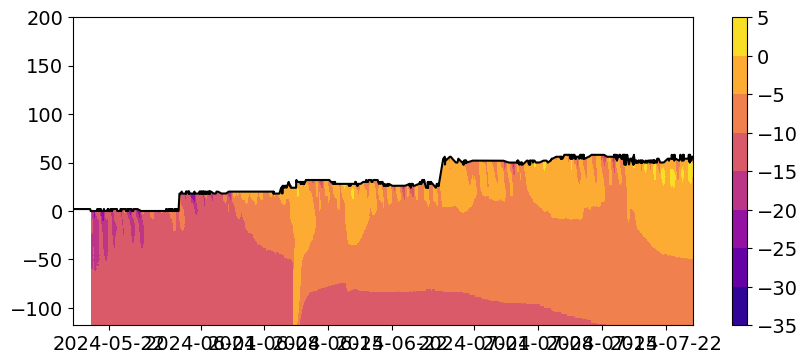

In [126]:
fig, axs = plt.subplots(1, figsize=(10,4))

temp_temp = np.ma.masked_where(depths_rel_to_sfc>0, corrected_temps_new)# temporary temperature
cb = plt.contourf(simba_dates, simba_depths, np.swapaxes(temp_temp,0,1), cmap='plasma')
plt.plot(simba_dates, simba_sfc,  c='k')
plt.colorbar(cb)
plt.show()

In [127]:
temps_rel_to_sfc = []

m = 100 # size of 

for i in range(temp_temp.shape[0]):
    temp_i = temp_temp[i,:-1]
    sub_t = temp_i[~temp_i.mask]

    sub_t_filled = np.ma.concatenate( (sub_t, np.full(int(m-sub_t.count()), -999 )) )
    temps_rel_to_sfc.append(sub_t_filled)
    
temps_rel_to_sfc = np.ma.masked_equal(temps_rel_to_sfc, -999)
# print(max(temps_rel_to_sfc))

In [128]:
sub_depths = np.arange(0,temps_rel_to_sfc.shape[1])
sub_depths *= -2

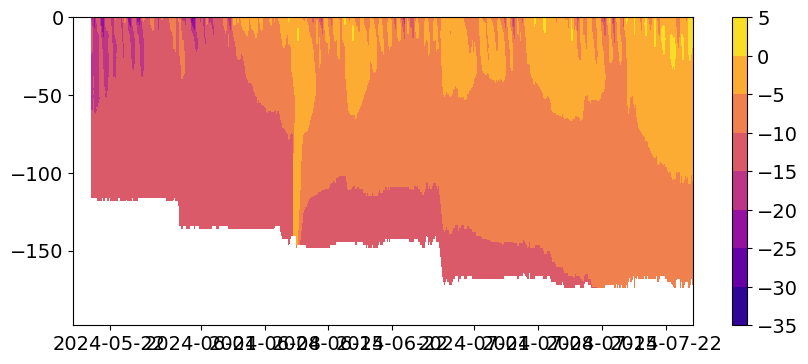

In [129]:
fig, axs = plt.subplots(1, figsize=(10,4))

cb = plt.contourf(simba_dates, sub_depths, np.swapaxes(temps_rel_to_sfc,0,1), cmap='plasma')
# plt.plot(simba_dates, simba_sfc-6.,  c='k')
plt.colorbar(cb)

# plt.xlim(dt(2024,6,8),dt(2024,6,15))
plt.show()

In [130]:
print(temps_rel_to_sfc.shape)

(6527, 100)


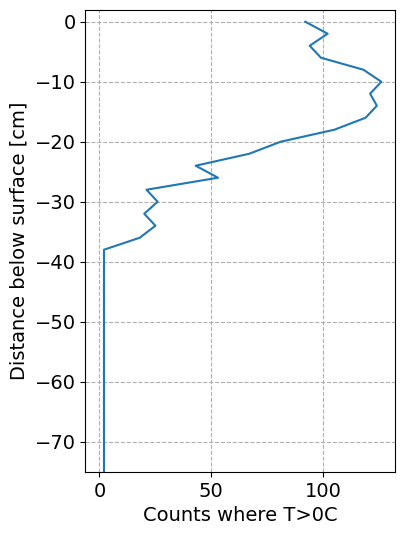

In [131]:
fig, ax = plt.subplots(1, figsize=(4,6))


above_zero_counts = np.ma.masked_less(temps_rel_to_sfc.copy(), 0).count(axis=0)

# for tprofile in temps_rel_to_sfc[np.where((simba_dates>dt(2024,6,15))&(simba_dates>dt(2024,6,17)))[0]]:
plt.plot(above_zero_counts, sub_depths)
plt.grid(ls='--')
plt.ylim(-75,2)
plt.xlabel('Counts where T>0C')
plt.ylabel('Distance below surface [cm]')
plt.show()

In [132]:
dates_2d = np.ma.repeat(simba_dates[:,np.newaxis], temps_rel_to_sfc.shape[1], axis=1)


In [133]:
temps_rel_to_sfc = np.ma.masked_invalid(temps_rel_to_sfc)

In [134]:
temp_masked_perc = np.ma.masked_where( (dates_2d>=dt(2024,6,11))&(dates_2d<dt(2024,6,12)), temps_rel_to_sfc)

In [135]:
skinT_sfc_timesteps = f_0_skinT(simba_seconds)


In [136]:
print(temps_rel_to_sfc.shape, skinT_sfc_timesteps.shape, simba_seconds.shape)

(6527, 100) (6527,) (6527,)


In [137]:
temp_corrs = np.ma.corrcoef(temps_rel_to_sfc[:,0], temps_rel_to_sfc[:,1:].T)[0][1:]
temp_corrs_skin = np.ma.corrcoef(skinT_sfc_timesteps, temps_rel_to_sfc[:,:].T)[0][1:]

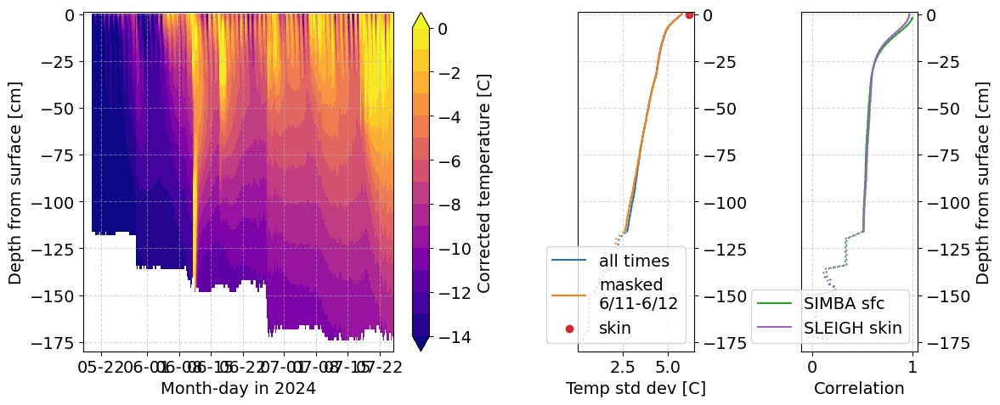

In [138]:
temp_counts = temps_rel_to_sfc.count(axis=0)

temp_std_profile = temps_rel_to_sfc.std(axis=0)
temp_std_profile_masked = temp_masked_perc.std(axis=0)

l = temps_rel_to_sfc.count(axis=0)[0]
temp_std_full = np.ma.masked_where(temp_counts<l, temp_std_profile)
temp_std_full_masked = np.ma.masked_where(temp_counts<l, temp_std_profile_masked)

fig, axs = plt.subplots(1, 3, figsize=(12,5), gridspec_kw=dict(width_ratios=[4,1.2,1.2]))

cb = axs[0].contourf(simba_dates, sub_depths, np.swapaxes(temps_rel_to_sfc,0,1), cmap='plasma',
                    levels=np.arange(-14,0.1,1), extend='both')
plt.colorbar(cb, label='Corrected temperature [C]', ax=axs[0])

axs[1].plot(temp_std_profile, sub_depths,ls=':', c='tab:blue')
axs[1].plot(temp_std_profile_masked, sub_depths, ls=':', c='tab:orange')

axs[1].plot(temp_std_full, sub_depths, label='all times', c='tab:blue')
axs[1].plot(temp_std_full_masked, sub_depths, label='masked\n6/11-6/12', c='tab:orange')

axs[1].scatter(simba_skin.std(), 0, c='tab:red', label='skin')

axs[1].legend(loc='lower right')

axs[1].set_xlabel('Temp std dev [C]')

axs[1].yaxis.set_label_position("right")
axs[1].yaxis.tick_right()



axs[2].plot(temp_corrs, sub_depths[1:],ls=':', c='tab:green')
axs[2].plot(temp_corrs_skin, sub_depths, ls=':', c='tab:purple')

axs[2].plot(temp_corrs[~temp_std_full[1:].mask], sub_depths[1:][~temp_std_full[1:].mask], label='SIMBA sfc', c='tab:green')
axs[2].plot(temp_corrs_skin[~temp_std_full.mask], sub_depths[~temp_std_full.mask], label='SLEIGH skin', c='tab:purple')

axs[2].legend(loc='lower right')

axs[2].set_xlabel('Correlation')

axs[2].yaxis.set_label_position("right")
axs[2].yaxis.tick_right()

axs[0].xaxis.set_major_formatter(myFmt)
axs[0].set_xlabel('Month-day in 2024')

for i, ax in enumerate(axs.ravel()):
    ax.grid(ls='--', alpha=.5)
    ax.set_ylim(-180,1)
    if i!=1:
        ax.set_ylabel('Depth from surface [cm]')

plt.tight_layout()
# plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_corrected-simba_20ks_0.5nir_-6sfc_temp-rel-to-sfc_std-dev-depths.png', dpi=250)

plt.show()

### wavelet decomposition?

In [245]:
from scipy.signal import cwt, morlet


In [246]:
## shorten timeseries to avoid masked data
short_idx = np.where((simba_dates>=dt(2024,5,15))&(simba_dates<dt(2024,6,22)))[0]
short_temp_rel_sfc = temps_rel_to_sfc[short_idx]

In [247]:
## from https://medium.com/pythoneers/wavelet-transform-a-practical-approach-to-time-frequency-analysis-662bdadeb08b

# extract the seismic data from the trace
# seismic_data = tr.data
times = np.linspace(0, short_temp_rel_sfc.shape[0])

# increase the range and resolution of scales
## IDK WHAT THIS MEANS!
scales = np.arange(1, 256)

# perform wavelet transform using the Morlet wavelet
coefficients = cwt(short_temp_rel_sfc, morlet, scales)

# plot the original signal and the wavelet transform result
plt.figure(figsize=(12, 6))

# plot the seismic signal (time domain)
plt.subplot(2, 1, 1)
plt.plot(times, short_temp_rel_sfc)
plt.title('Seismic Signal (Time Domain)')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

# plot the wavelet transform (time-frequency domain) with adjusted color scaling
plt.subplot(2, 1, 2)
plt.imshow(np.abs(coefficients), extent=[times[0], times[-1], scales[-1], scales[0]],
           cmap='inferno', aspect='auto', vmax=np.percentile(np.abs(coefficients), 99),
           vmin=np.percentile(np.abs(coefficients), 1))
plt.title('Wavelet Transform (Time-Frequency Domain)')
plt.xlabel('Time [s]')
plt.ylabel('Scale')
plt.colorbar(label='Magnitude')
plt.tight_layout()
plt.show()

/tmp/ipykernel_459999/2573355581.py:12: DeprecationWarning: scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed
in SciPy 1.15. We recommend using PyWavelets instead.

  coefficients = cwt(short_temp_rel_sfc, morlet, scales)


ValueError: volume and kernel should have the same dimensionality

## Cold content(?) calculation

In [139]:
# rho_s = 300. # kg m-3
c_i = 2.1*10**-3 # MJ kg-1 C-1
# d_s = .2 # m
d = 0.02 # m
T_m = 0. # C

# rough estimates from snow pits at install and demob; maximum range
# now averaged in upper 20 cm
# rho_lo = np.linspace(50, 120, temps_rel_to_sfc.shape[0])
# rho_hi = np.linspace(300, 400, temps_rel_to_sfc.shape[0])
rho_lo = np.linspace(238, 229, temps_rel_to_sfc.shape[0])
rho_hi = np.linspace(328, 379, temps_rel_to_sfc.shape[0])


d_layer = 20

# cold content units: MJ m−2
# Eq 2 in https://doi.org/10.5194/tc-12-1595-2018
cold_content_lo = c_i*rho_lo*d*temps_rel_to_sfc[:,np.where(sub_depths>=-d_layer)[0]].sum(axis=1)
cold_content_hi = c_i*rho_hi*d*temps_rel_to_sfc[:,np.where(sub_depths>=-d_layer)[0]].sum(axis=1)

cc_avg_lo = c_i*rho_lo*0.2*temps_rel_to_sfc[:,np.where(sub_depths>=-d_layer)[0]].mean(axis=1)
cc_avg_hi = c_i*rho_hi*0.2*temps_rel_to_sfc[:,np.where(sub_depths>=-d_layer)[0]].mean(axis=1)

Michael actually wants storage now

In [140]:
avg_temps = np.ma.copy(temps_rel_to_sfc)[:,np.where(sub_depths>=-d_layer)[0]].mean(axis=1)

In [141]:
print(simba_seconds.shape, simba_dates.shape)

(6527,) (6527,)


In [142]:
avg_temp_diff = avg_temps[2:] - avg_temps[:-2]
time_diff = 2.*(simba_seconds[2:] - simba_seconds[:-2])

# 10^6 to convert from MJ to J
storage_avg_lo = 10.**6*c_i*rho_lo[1:-1]*0.2*avg_temp_diff/time_diff
storage_avg_hi = 10.**6*c_i*rho_hi[1:-1]*0.2*avg_temp_diff/time_diff

## Saving for michael

with open('Raven_2024_20cm_cold_content_range_20250403.csv', 'w', ) as myfile:
    wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
    myfile.write("{},{}\n".format("Dates", "Low cold content [MJ m-2]", "High cold content [MJ m-2]", "Low Density [kg m-3]", "High Density [kg m-3]"))
    for item1, item2, item3, item4, item5 in zip(simba_dates, cold_content_lo, cold_content_hi, rho_lo, rho_hi):
        wr.writerow([item1, item2, item3, item4, item5])
        

In [114]:
## Saving for michael

with open('Raven_2024_20cm_storage_range_20250416_maxheight.csv', 'w', ) as myfile:
    wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
    myfile.write("{},{}\n".format("Dates", "Low storage [W m-2]", "High storage [W m-2]", "Low Density [kg m-3]", "High Density [kg m-3]"))
    for item1, item2, item3, item4, item5 in zip(simba_dates[1:-1], storage_avg_lo, storage_avg_hi, rho_lo, rho_hi):
        wr.writerow([item1, item2, item3, item4, item5])
        

In [143]:
print((simba_skin-273.15).mean(), temps_rel_to_sfc[:,0].mean(), sub_depths[0])

-7.949793090733054 -8.44367649454069 0


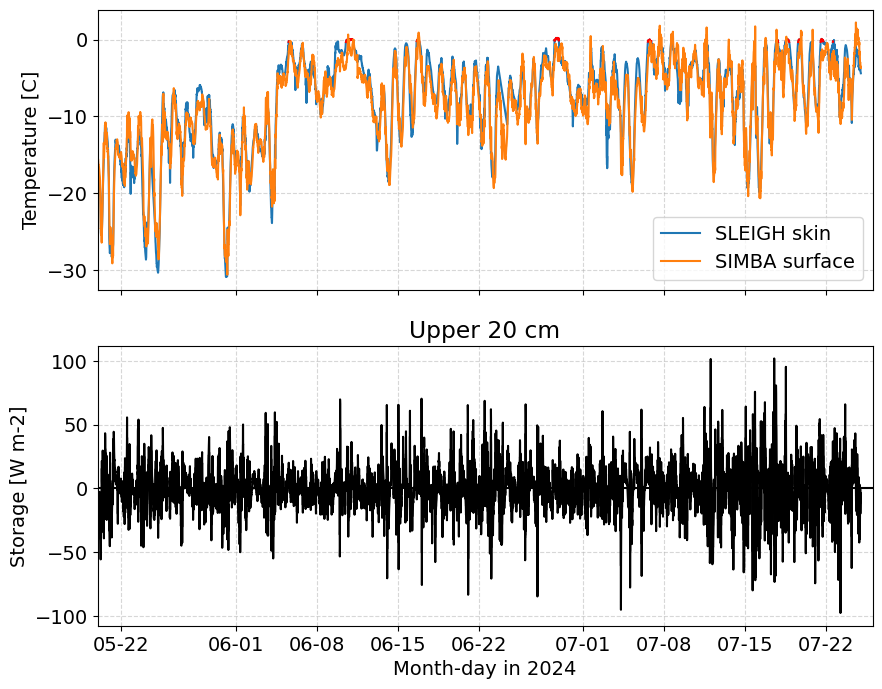

In [144]:
fig, axs = plt.subplots(2, figsize=(10,8), sharex=True)

axs[0].plot(simba_dates, simba_skin-273.15, label='SLEIGH skin')
# plt.plot(simba_dates, np.ma.masked_less(simba_skin-273.15, -0.4), c='k')
axs[0].plot(simba_dates, np.ma.masked_less(simba_skin-273.15, -0.32), c='r')

axs[0].plot(simba_dates, temps_rel_to_sfc[:,0], label='SIMBA surface')
axs[0].legend(loc='best')
axs[0].set_ylabel('Temperature [C]')

for ax in axs.ravel():
    ax.grid(ls='--', alpha=.5)


axs[1].fill_between(simba_dates[1:-1], storage_avg_lo, storage_avg_hi)
# plt.plot(simba_dates, cc_avg_lo,c='tab:red')
axs[1].plot(simba_dates[1:-1], storage_avg_lo, c='k')
axs[1].plot(simba_dates[1:-1], storage_avg_hi, c='k')


axs[1].set_ylabel('Storage [W m-2]')

axs[1].xaxis.set_major_formatter(myFmt)
axs[1].set_xlabel('Month-day in 2024')
axs[1].set_title('Upper {:.0f} cm'.format(d_layer))
axs[1].axhline(y=0,c='k')
axs[1].set_xlim(dt(2024,5,20),dt(2024,7,26))
# add: skin temperature, net radiation (SEB), GPR melt probability, others...?
# plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_corrected-simba_20ks_0.5nir_-6sfc_cold-content_sum-t.png', dpi=250)

plt.show()

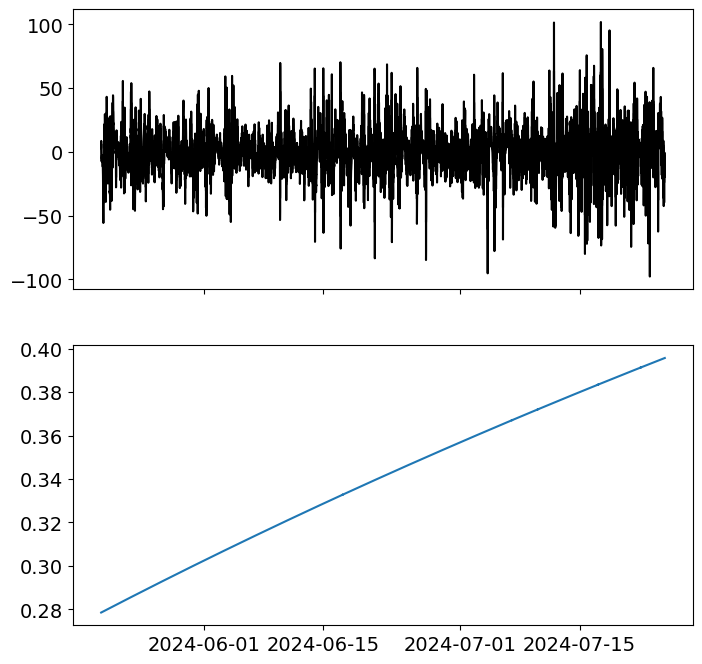

In [145]:
fig, axs = plt.subplots(2, sharex=True, figsize=(8,8))
axs[0].fill_between(simba_dates[1:-1], storage_avg_lo, storage_avg_hi)
axs[0].plot(simba_dates[1:-1], storage_avg_lo, c='k')
axs[0].plot(simba_dates[1:-1], storage_avg_hi, c='k')
# axs[0].set_xlim(dt(2024,7,15), dt(2024,7,25))

axs[1].plot(simba_dates[1:-1], (storage_avg_hi-storage_avg_lo)/storage_avg_hi)
plt.show()

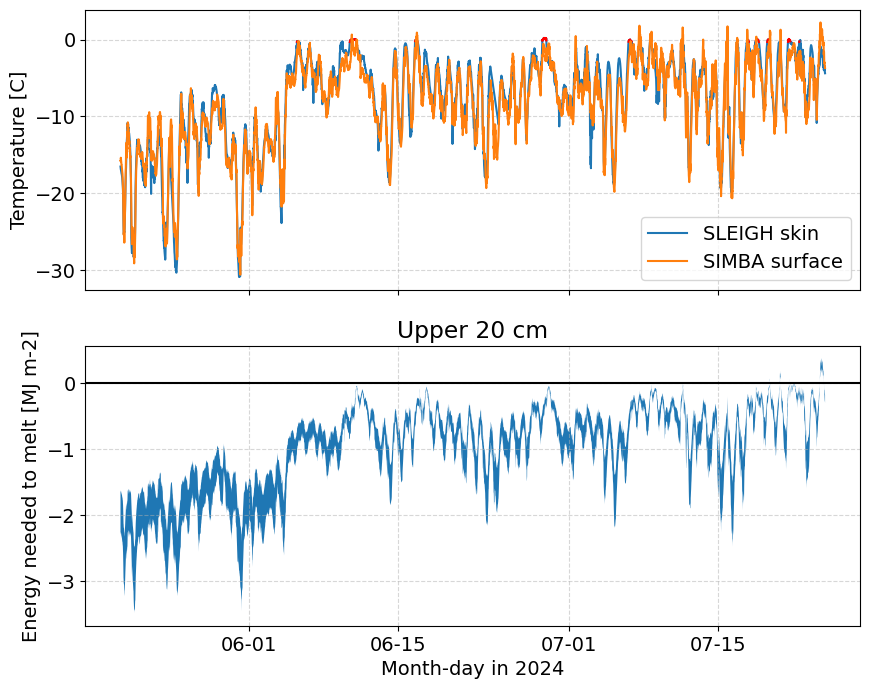

In [146]:
fig, axs = plt.subplots(2, figsize=(10,8), sharex=True)

axs[0].plot(simba_dates, simba_skin-273.15, label='SLEIGH skin')
# plt.plot(simba_dates, np.ma.masked_less(simba_skin-273.15, -0.4), c='k')
axs[0].plot(simba_dates, np.ma.masked_less(simba_skin-273.15, -0.32), c='r')

axs[0].plot(simba_dates, temps_rel_to_sfc[:,0], label='SIMBA surface')
axs[0].legend(loc='best')
axs[0].set_ylabel('Temperature [C]')

for ax in axs.ravel():
    ax.grid(ls='--', alpha=.5)


axs[1].fill_between(simba_dates, cold_content_lo, cold_content_hi)
# plt.plot(simba_dates, cc_avg_lo,c='tab:red')

axs[1].set_ylabel('Energy needed to melt [MJ m-2]')

axs[1].xaxis.set_major_formatter(myFmt)
axs[1].set_xlabel('Month-day in 2024')
axs[1].set_title('Upper {:.0f} cm'.format(d_layer))
axs[1].axhline(y=0,c='k')

# add: skin temperature, net radiation (SEB), GPR melt probability, others...?
# plt.savefig('/home/asledd/ICECAPS/simba_solar_correction_figs/Raven_corrected-simba_20ks_0.5nir_-6sfc_cold-content_sum-t.png', dpi=250)

plt.show()

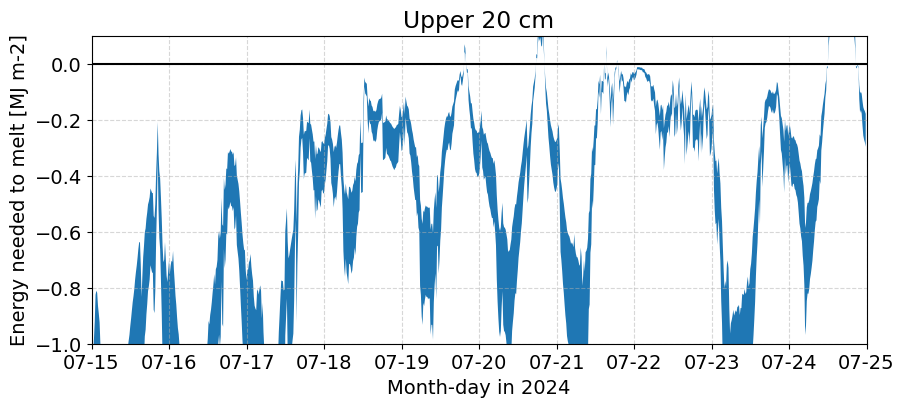

In [147]:
fig, ax = plt.subplots(1, figsize=(10,4))
plt.fill_between(simba_dates, cold_content_lo, cold_content_hi)
# plt.plot(simba_dates, cc_avg_lo,c='tab:red', lw=1)
# plt.plot(simba_dates, cc_avg_hi,c='tab:red', lw=1)

plt.ylabel('Energy needed to melt [MJ m-2]')
plt.grid(ls='--', alpha=.5)
ax.xaxis.set_major_formatter(myFmt)
ax.set_xlabel('Month-day in 2024')
plt.title('Upper {:.0f} cm'.format(d_layer))
plt.axhline(y=0,c='k')
plt.xlim(dt(2024,7,15), dt(2024,7,25))
plt.ylim(-1.,.1)
# add: skin temperature, net radiation (SEB), GPR melt probability, others...?
plt.show()

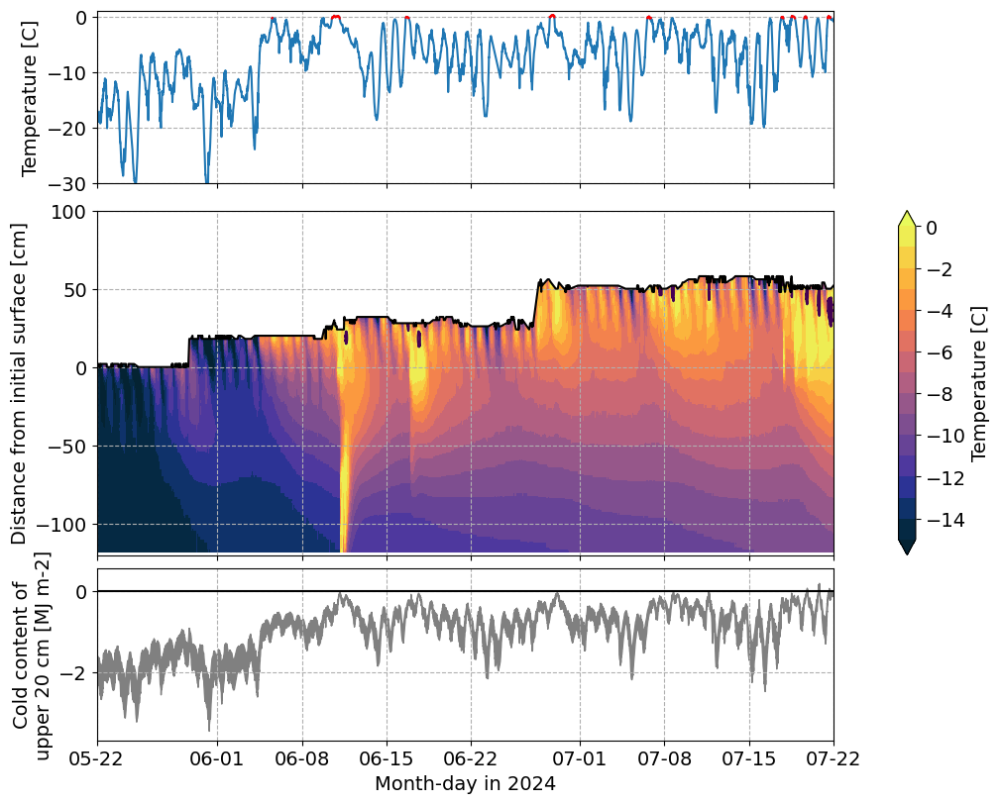

In [148]:
fig, axs = plt.subplots(3, figsize=(10,8), constrained_layout=True, sharex=True, gridspec_kw=dict(height_ratios=[1,2,1]))

axs[0].plot(simba_dates, simba_skin-273.15, label='SLEIGH skin')
axs[0].plot(simba_dates, np.ma.masked_less(simba_skin-273.15, -0.32), c='r')
axs[0].set_ylabel('Temperature [C]')

# axs[0].plot(simba_dates, corr_sfc_temp, label='corrected SIMBA sfc')


cb = axs[1].contourf(simba_dates, simba_depths, np.swapaxes(corrected_temps_new,0,1),
                cmap=cmocean.cm.thermal, levels=np.arange(-15,0.5,1), extend='both')
axs[1].contour(simba_dates, simba_depths, np.swapaxes(corrected_temps_new,0,1),
                levels=[0], extend='both')
plt.colorbar(cb, ax=axs[1], label='Temperature [C]')

for i, ax in enumerate(axs.ravel()):
    ax.grid(ls='--')
    if i==1:
        ax.plot(simba_dates, simba_sfc, c='k')
        # ax.plot(simba_dates, simba_sfc-6.,  c='k')# ls='--',

        # ax.plot(sleigh_dates, asfs_data_lev2['snow_depth']-350, c='c')
        ax.set_ylabel('Distance from initial surface [cm]')
        # ax.set_ylim(-380, -280)

axs[2].fill_between(simba_dates, cold_content_lo, cold_content_hi, color='grey')
axs[2].set_ylabel('Cold content of\nupper 20 cm [MJ m-2]')
axs[2].axhline(y=0,c='k')

axs[0].set_xlim(datetime.datetime(2024,5,22),datetime.datetime(2024,7,22))
axs[0].set_ylim(-30,1)
axs[1].set_ylim(-120,100)

axs[2].xaxis.set_major_formatter(myFmt)
axs[2].set_xlabel('Month-day in 2024')

# axs[1].set_xlim(plt_times_not_smooth[0], plt_times_not_smooth[-1])

# plt.savefig('/home/asledd/ICECAPS/Raaven_2024_skint-temp_corrected-SIMBA-temp_CC.png', dpi=250)

plt.show()

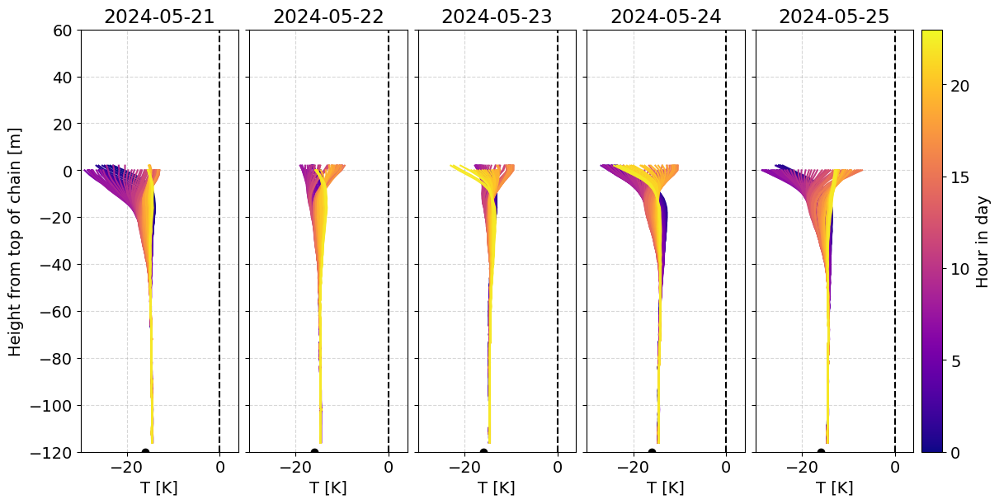

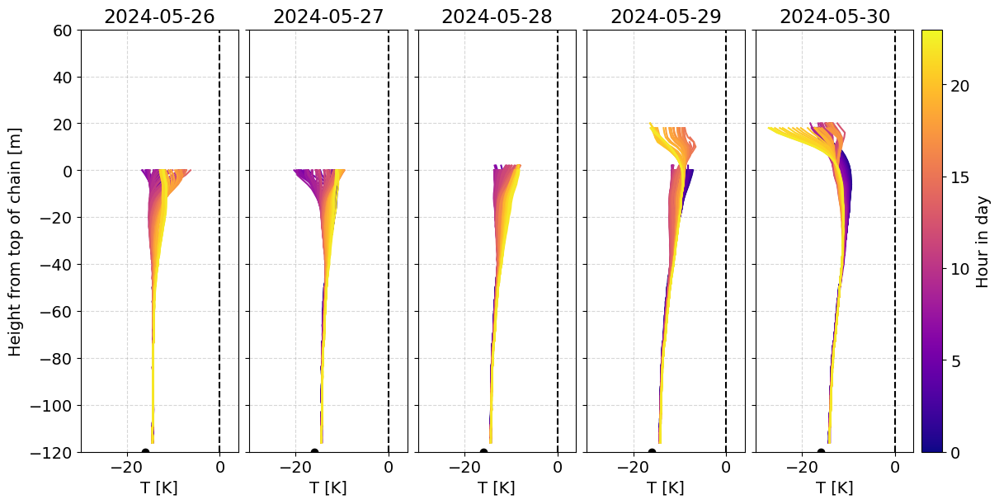

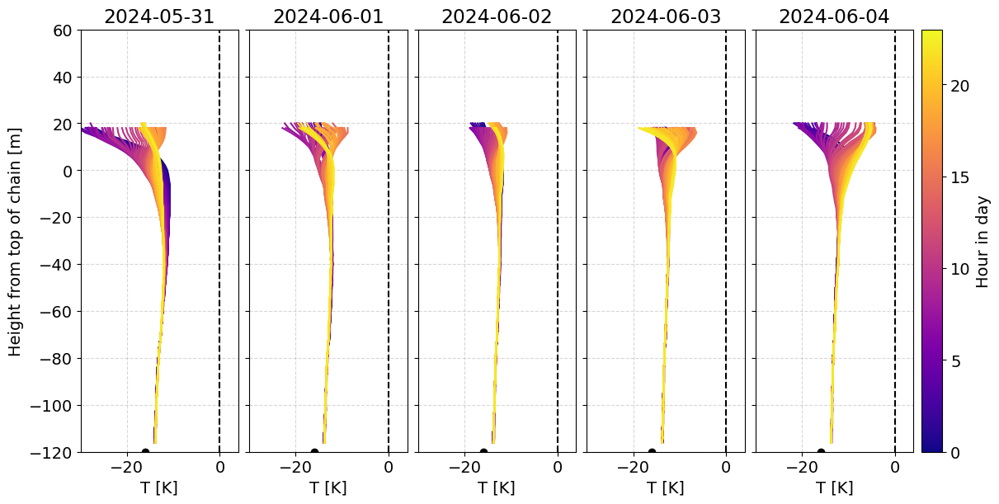

In [149]:
# Look at profiles?

## for may
for day in range(20,31,5):

## for july
# for day in range(1,26,5):
    fig, axs = plt.subplots(1,5, figsize=(12,6), sharey=True, sharex=True, constrained_layout=True)
    axs[0].set_ylabel('Height from top of chain [m]')
    
    # day = 9
    for ad, ax in zip(range(5), axs.ravel()):
        st_date = datetime.datetime(2024,5,1)+datetime.timedelta(days=day+ad)
        en_date = st_date+datetime.timedelta(days=1)
        figure_date_idx = np.where((np.asarray(simba_dates)>=st_date )&(np.asarray(simba_dates)<en_date ))[0]
        # print(len(figure_date_idx))
        # cbar_ticks = [plt_times[figure_date_idx[idx]] for idx in [0, int(len(figure_date_idx)/2), len(figure_date_idx)-1]]
        cbar_ticks = [0, 12, 23]
        
        for i, t_idx in np.ndenumerate(figure_date_idx[1:]):#[::-1]):
            
            col = plt.cm.plasma(simba_dates[t_idx].hour/24.)
            # print(corrected_temps[t_idx, :])
            ax.plot(np.squeeze(corrected_temps_new[t_idx, :-1]), simba_depths[:-1], label=t_idx, c=col)#'t=0')
    
        ax.set_xlabel('T [K]')
        ax.grid(alpha=.5, ls='--')
        ax.set_title(st_date.strftime('%Y-%m-%d'))
        ax.axvline(x=0., c='k', ls='--')
        ax.set_xlim(-30, 4)
        ax.scatter(-16, -120, c='k')
    axs[0].set_ylim(-120,60)
    cmappable = ScalarMappable(norm=Normalize(0,23), cmap=plt.cm.plasma)
    
    #colorbar from https://stackoverflow.com/questions/65618997/python-matplotlib-custom-colorbar-for-plotted-lines-with-manually-assigned-color
    cbar = plt.colorbar(cmappable, label='Hour in day', ax=axs[-1])# ticks=np.arange(0, 23))#
    # cbar.ax.set_yticklabels(cbar_ticks)
    
    # axs[-1].set_xlim(-.1,2)
    # axs[1].set_title(st_date.strftime('%Y-%m-%d %H:%M')+'--'+en_date.strftime('%m-%d %H:%M'))
    # daystring_st = datetime.datetime(2024,5,day)
    # daystring_en = datetime.datetime(2024,5,day+4)
    # filename = 'Raven_temp-height_reverse_temp-corrected_'+daystring_st.strftime('%Y%m%d-')+daystring_en.strftime('%Y%m%d')+'.png'
    # plt.savefig('/home/asledd/ICECAPS/temperature_profiles/'+filename, dpi=250)
    plt.show()

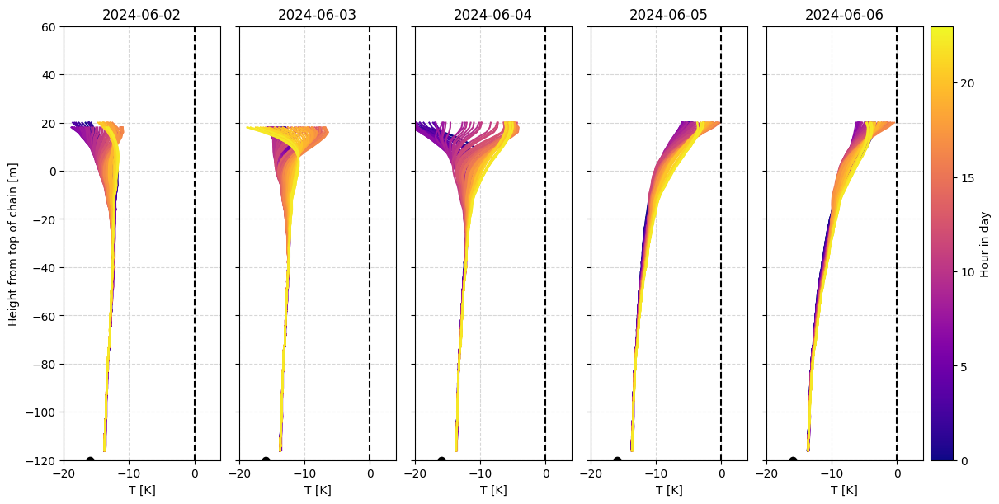

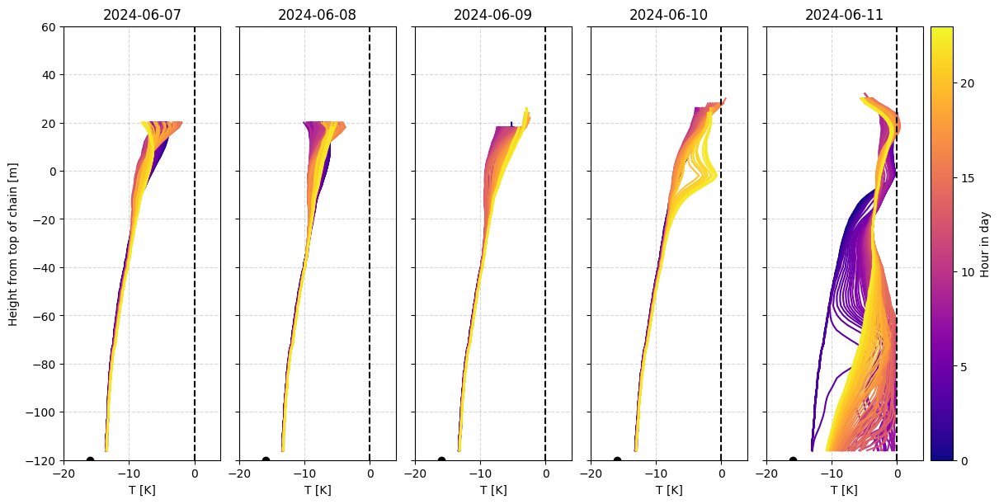

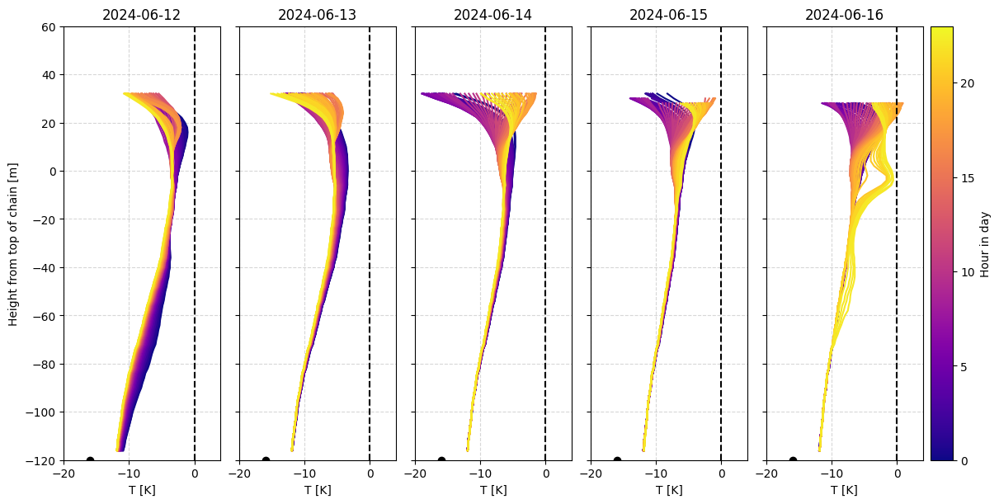

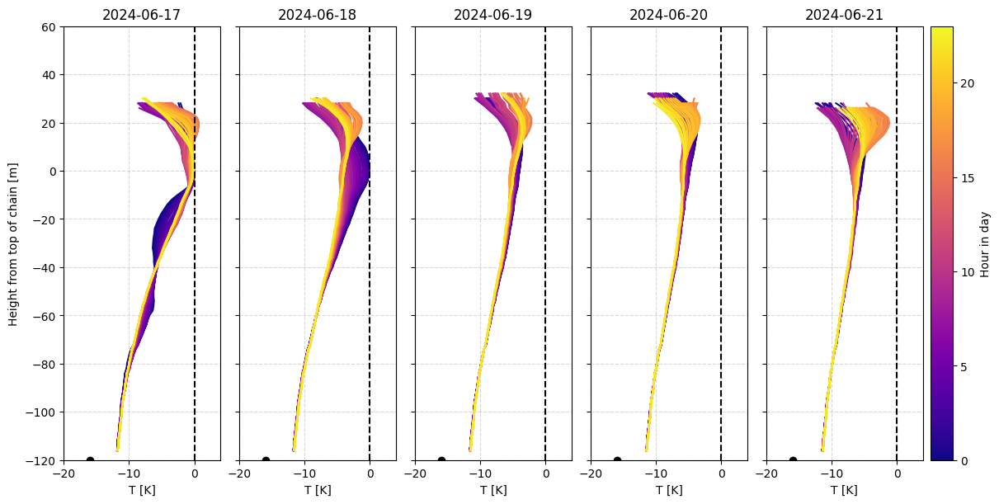

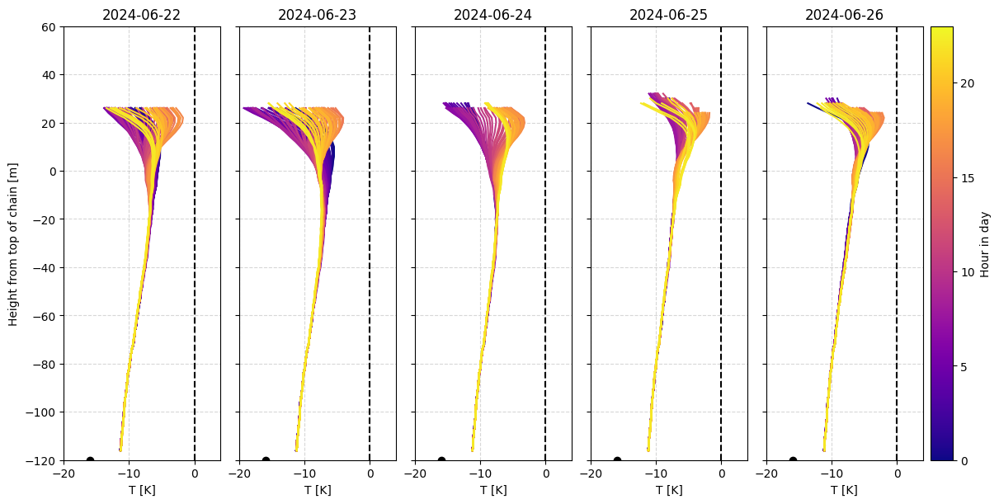

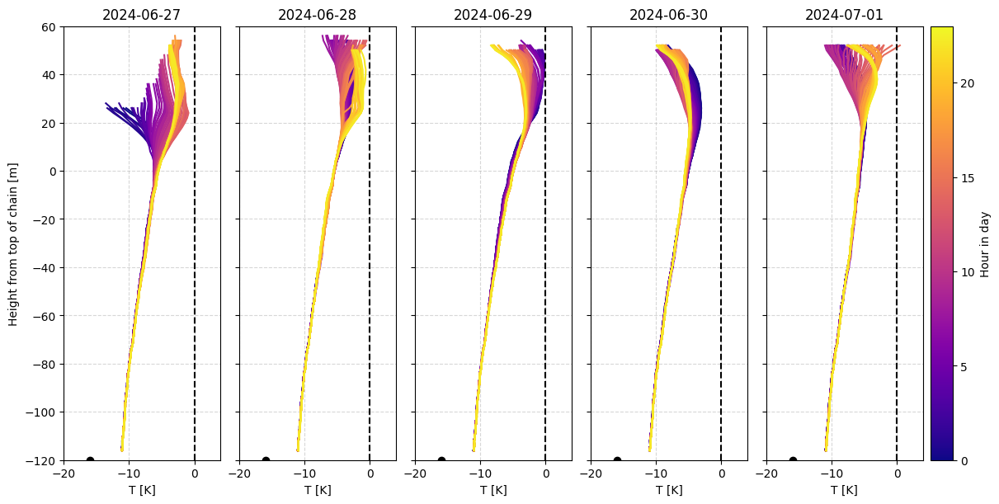

In [82]:
# Look at profiles?

## for june
for day in range(1,31,5):

## for july
# for day in range(1,26,5):
    fig, axs = plt.subplots(1,5, figsize=(12,6), sharey=True, sharex=True, constrained_layout=True)
    axs[0].set_ylabel('Height from top of chain [m]')
    
    # day = 9
    for ad, ax in zip(range(5), axs.ravel()):
        st_date = datetime.datetime(2024,6,1)+datetime.timedelta(days=day+ad)
        en_date = st_date+datetime.timedelta(days=1)
        figure_date_idx = np.where((np.asarray(simba_dates)>=st_date )&(np.asarray(simba_dates)<en_date ))[0]
        # print(len(figure_date_idx))
        # cbar_ticks = [plt_times[figure_date_idx[idx]] for idx in [0, int(len(figure_date_idx)/2), len(figure_date_idx)-1]]
        cbar_ticks = [0, 12, 23]
        
        for i, t_idx in np.ndenumerate(figure_date_idx[1:]):#[::-1]):
            
            col = plt.cm.plasma(simba_dates[t_idx].hour/24.)
            # print(corrected_temps[t_idx, :])
            ax.plot(np.squeeze(corrected_temps_new[t_idx, :-1]), simba_depths[:-1], label=t_idx, c=col)#'t=0')
    
        ax.set_xlabel('T [K]')
        ax.grid(alpha=.5, ls='--')
        ax.set_title(st_date.strftime('%Y-%m-%d'))
        ax.axvline(x=0., c='k', ls='--')
        ax.set_xlim(-20, 4)
        ax.scatter(-16, -120, c='k')
    axs[0].set_ylim(-120,60)
    cmappable = ScalarMappable(norm=Normalize(0,23), cmap=plt.cm.plasma)
    
    #colorbar from https://stackoverflow.com/questions/65618997/python-matplotlib-custom-colorbar-for-plotted-lines-with-manually-assigned-color
    cbar = plt.colorbar(cmappable, label='Hour in day', ax=axs[-1])# ticks=np.arange(0, 23))#
    # cbar.ax.set_yticklabels(cbar_ticks)
    
    # axs[-1].set_xlim(-.1,2)
    # axs[1].set_title(st_date.strftime('%Y-%m-%d %H:%M')+'--'+en_date.strftime('%m-%d %H:%M'))
    daystring_st = datetime.datetime(2024,6,day)
    daystring_en = datetime.datetime(2024,6,day+4)
    filename = 'Raven_temp-height_reverse_temp-corrected_'+daystring_st.strftime('%Y%m%d-')+daystring_en.strftime('%Y%m%d')+'.png'
    # plt.savefig('/home/asledd/ICECAPS/temperature_profiles/'+filename, dpi=250)
    plt.show()

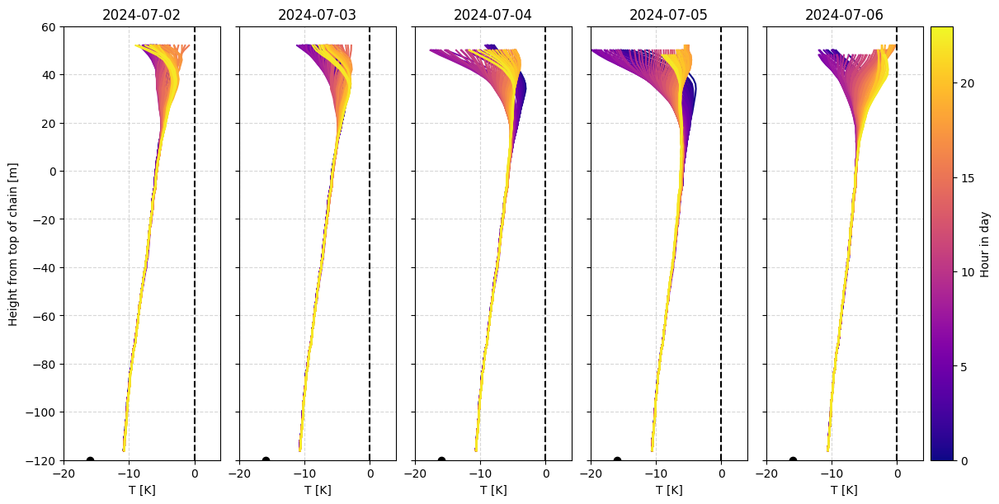

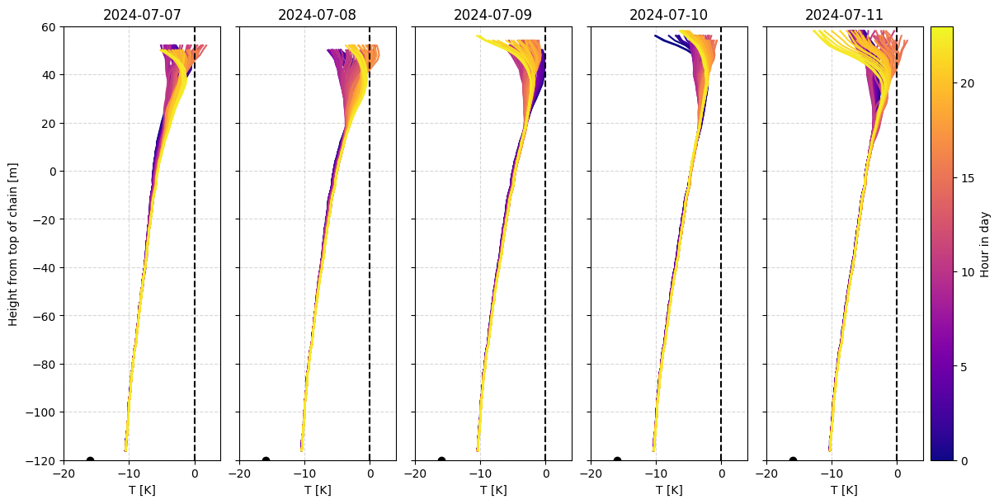

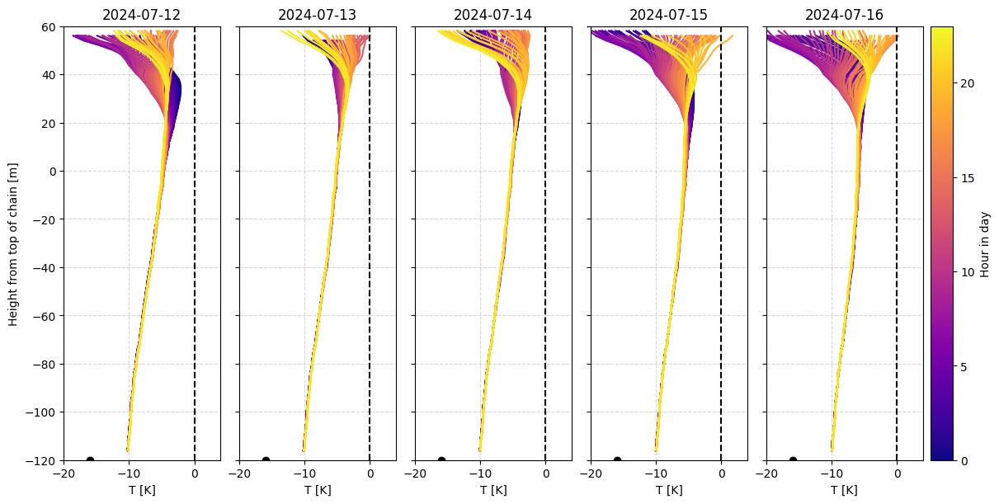

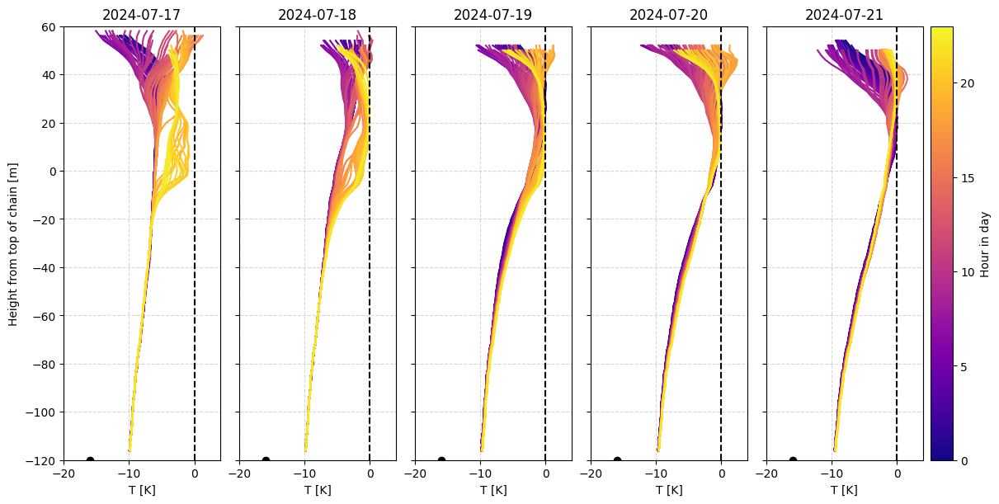

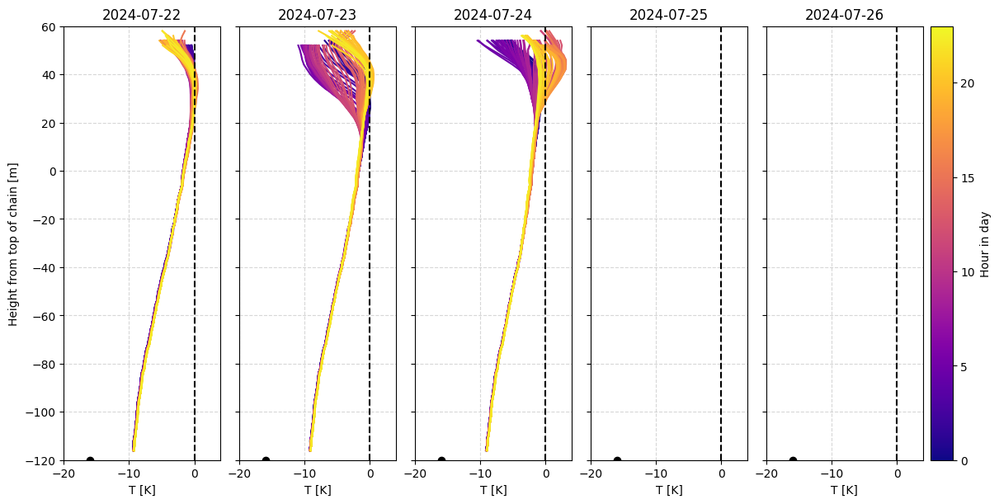

In [146]:
# Look at profiles?

## for june
# for day in range(1,31,5):

## for july
for day in range(1,26,5):
    fig, axs = plt.subplots(1,5, figsize=(12,6), sharey=True, sharex=True, constrained_layout=True)
    axs[0].set_ylabel('Height from top of chain [m]')
    
    # day = 9
    for ad, ax in zip(range(5), axs.ravel()):
        st_date = datetime.datetime(2024,7,1)+datetime.timedelta(days=day+ad)
        en_date = st_date+datetime.timedelta(days=1)
        figure_date_idx = np.where((np.asarray(simba_dates)>=st_date )&(np.asarray(simba_dates)<en_date ))[0]
        # print(len(figure_date_idx))
        # cbar_ticks = [plt_times[figure_date_idx[idx]] for idx in [0, int(len(figure_date_idx)/2), len(figure_date_idx)-1]]
        cbar_ticks = [0, 12, 23]
        
        for i, t_idx in np.ndenumerate(figure_date_idx[1:]):#[::-1]):
            
            col = plt.cm.plasma(simba_dates[t_idx].hour/24.)
            # print(corrected_temps[t_idx, :])
            ax.plot(np.squeeze(corrected_temps_new[t_idx, :-1]), simba_depths[:-1], label=t_idx, c=col)#'t=0')
    
        ax.set_xlabel('T [K]')
        ax.grid(alpha=.5, ls='--')
        ax.set_title(st_date.strftime('%Y-%m-%d'))
        ax.axvline(x=0., c='k', ls='--')
        ax.set_xlim(-20, 4)
        ax.scatter(-16, -120, c='k')
    axs[0].set_ylim(-120,60)
    cmappable = ScalarMappable(norm=Normalize(0,23), cmap=plt.cm.plasma)
    
    #colorbar from https://stackoverflow.com/questions/65618997/python-matplotlib-custom-colorbar-for-plotted-lines-with-manually-assigned-color
    cbar = plt.colorbar(cmappable, label='Hour in day', ax=axs[-1])# ticks=np.arange(0, 23))#
    # cbar.ax.set_yticklabels(cbar_ticks)
    
    # axs[-1].set_xlim(-.1,2)
    # axs[1].set_title(st_date.strftime('%Y-%m-%d %H:%M')+'--'+en_date.strftime('%m-%d %H:%M'))
    daystring_st = datetime.datetime(2024,7,day)
    daystring_en = datetime.datetime(2024,7,day+4)
    filename = 'Raven_temp-height_reverse_temp-corrected_'+daystring_st.strftime('%Y%m%d-')+daystring_en.strftime('%Y%m%d')+'.png'
    # plt.savefig('/home/asledd/ICECAPS/temperature_profiles/'+filename, dpi=250)
    plt.show()

## Bring in GPR melt index!

In [150]:
df = pd.read_csv('/psd3data/arctic/sledd/Melt_Index_despiked_GPR_Raven2024.csv')

gpr_dates = np.array([dt.strptime(d, '%Y-%m-%d %H:%M:%S') for d in df['date'].values])       
gpr_melt = df['Melt_Index_Normal'].values


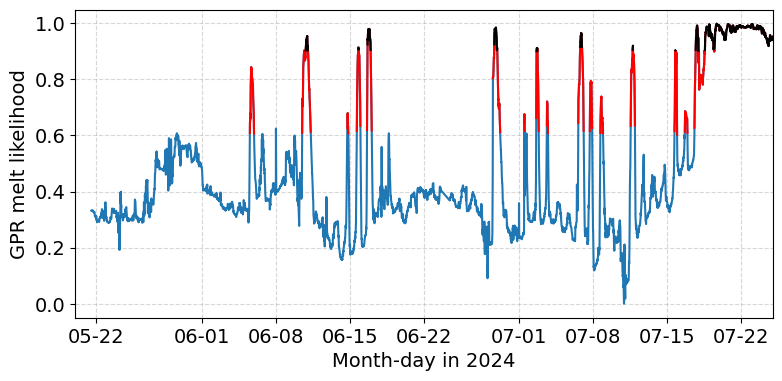

In [151]:
fig, ax = plt.subplots(1, figsize=(9,4))
plt.plot(gpr_dates, gpr_melt)
plt.plot(gpr_dates, np.ma.masked_less(gpr_melt,.6), c='r')
plt.plot(gpr_dates, np.ma.masked_less(gpr_melt,.9), c='k')

plt.xlim(dt(2024,5,20),dt(2024,7,25))
plt.grid(alpha=.5,ls='--')
plt.ylabel('GPR melt likelihood')
ax.xaxis.set_major_formatter(myFmt)
ax.set_xlabel('Month-day in 2024')
plt.show()

In [152]:
## does melt probability always goes down at night?

In [153]:
print(gpr_dates[:5])

[datetime.datetime(2024, 5, 21, 12, 30)
 datetime.datetime(2024, 5, 21, 12, 45)
 datetime.datetime(2024, 5, 21, 13, 15)
 datetime.datetime(2024, 5, 21, 13, 30)
 datetime.datetime(2024, 5, 21, 14, 0)]


Start checking out combinations of 'skin temperature and GPR agree it's melting' vs 'skin temperature and GPR agree it's not melting'
plot hourly(?) average temperature profiles relative to the surface, maybe bring in cloudy vs not from Michael

Need gpr melt, tskin, and SIMBA all on same time steps
interpolate gpr to whatever simba timesteps are above?

In [154]:
gpr_seconds = np.asarray([(t-dt(1970,1,1)).total_seconds() for t in gpr_dates])

f_gpr = interpolate.interp1d(gpr_seconds, gpr_melt, 
                             fill_value=-999, bounds_error=False)

gpr_melt_interped = f_gpr(simba_seconds)
gpr_melt_interped = np.ma.masked_equal(gpr_melt_interped, -999)

In [155]:
print(simba_seconds.shape, gpr_melt_interped.shape, simba_skin.shape, simba_dates.shape)

(6527,) (6527,) (6527,) (6527,)


## HERE!

NOT exactly what I want - actually want diurnal cycle of days that melt/don't? But this could be interesting to shade by time of season?

OR loop through to get average profile for each (2?) hour bin and color by that. Then you get daily progression and info on what times actually melt. 

Make arrays with hours from dates of non/melt, then loop through?

Also potentially interesting to characterize: depth of SW penetration, SIMBA temperatures >0 beneath surface,...?

In [156]:
simba_hours = np.asarray([sd.hour for sd in simba_dates])

In [157]:
agreed_melt_idx = np.where((gpr_melt_interped>0.6)&((simba_skin-273.15)>=-0.4))
agreed_nonmelt_idx = np.where((gpr_melt_interped<0.6)&((simba_skin-273.15)<-0.4))

In [158]:
skin_melt_idx = np.where((simba_skin-273.15)>=-0.4)
gpr_melt_lo_idx = np.where(gpr_melt_interped>0.6)
gpr_melt_hi_idx = np.where(gpr_melt_interped>0.9)

In [159]:
melt_simba = np.ma.copy(temps_rel_to_sfc)[agreed_melt_idx[0],:]
nonmelt_simba = np.ma.copy(temps_rel_to_sfc)[agreed_nonmelt_idx[0],:]

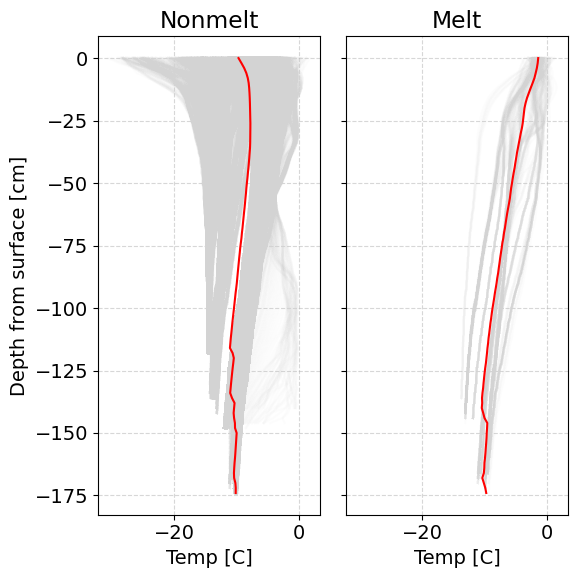

In [160]:
fig, axs = plt.subplots(1,2, sharey=True, figsize=(6,6), sharex=True)
titles = ['Nonmelt','Melt']
for ax, data,title in zip(axs.ravel(), [nonmelt_simba, melt_simba], titles):

    for i in range(data.shape[0]):
        ax.plot(data[i,:], sub_depths, c='lightgray', alpha=.05)

    ax.plot(data.mean(axis=0), sub_depths, c='r')
    ax.grid(alpha=.5, ls='--')
    ax.set_xlabel('Temp [C]')
    ax.set_title(title)
axs[0].set_ylabel('Depth from surface [cm]')

plt.tight_layout()
plt.show()

Plot average day vs average night based on SW?

Median instead of average for profiles? 

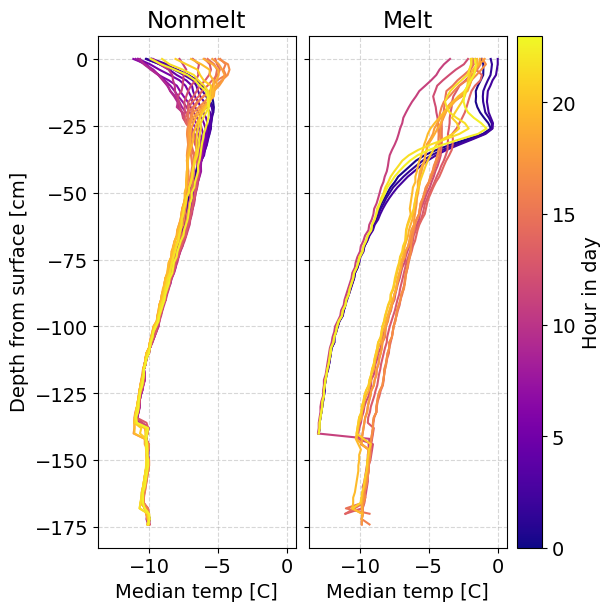

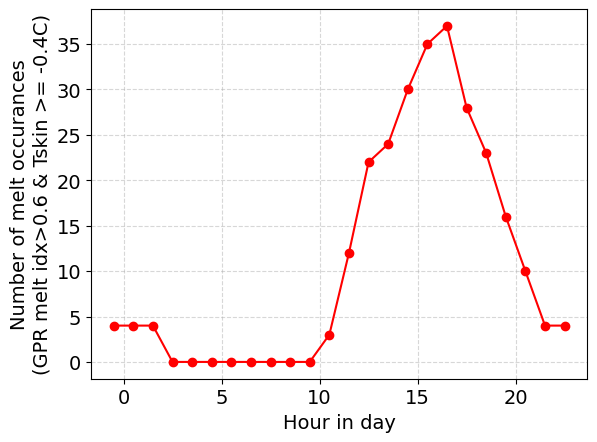

In [161]:
fig, axs = plt.subplots(1,2, sharey=True, figsize=(6,6), sharex=True, constrained_layout=True)
idxs = [agreed_nonmelt_idx,agreed_melt_idx]

hours = np.arange(0,25,1)

num_occurance = {'Melt':[],'Nonmelt':[]}

for i, (ax, m_idx) in enumerate(zip(axs.ravel(), idxs)):
    temp_midx = np.ma.copy(temps_rel_to_sfc)[m_idx[0],:]
    hours_midx = np.ma.copy(simba_hours)[m_idx[0]]

    for hr_min, hr_max in zip(hours[:-1],hours[1:]):
        col = plt.cm.plasma(((hr_min+hr_max)/2.)/24.)
        
        hr_idx = np.where((hours_midx>=hr_min)&(hours_midx<hr_max))[0]
        num_occurance[titles[i]].append(len(hr_idx))
        
        hr_temp_midx = np.ma.median(temp_midx[hr_idx,:], axis=0)
        ax.plot(hr_temp_midx, sub_depths, c=col)
    print()
    ax.grid(alpha=.5, ls='--')
    ax.set_xlabel('Median temp [C]')
    ax.set_title(titles[i])
axs[0].set_ylabel('Depth from surface [cm]')

cmappable = ScalarMappable(norm=Normalize(0,23), cmap=plt.cm.plasma)

#colorbar from https://stackoverflow.com/questions/65618997/python-matplotlib-custom-colorbar-for-plotted-lines-with-manually-assigned-color
cbar = plt.colorbar(cmappable, label='Hour in day', ax=axs[1])
# plt.tight_layout()
plt.show()

plt.plot(hours[:-1]-.5, num_occurance['Melt'], c='r', label='melt', marker='o')
# plt.plot(hours[:-1]-.5, num_occurance['Nonmelt'], c='tab:blue', label='nonmelt')
plt.ylabel('Number of melt occurances\n(GPR melt idx>0.6 & Tskin >= -0.4C)')
plt.xlabel('Hour in day')
plt.grid(alpha=.5, ls='--')
plt.show()

In [162]:
dTdz_rel_to_sfc = np.gradient(temps_rel_to_sfc, sub_depths, axis=1)

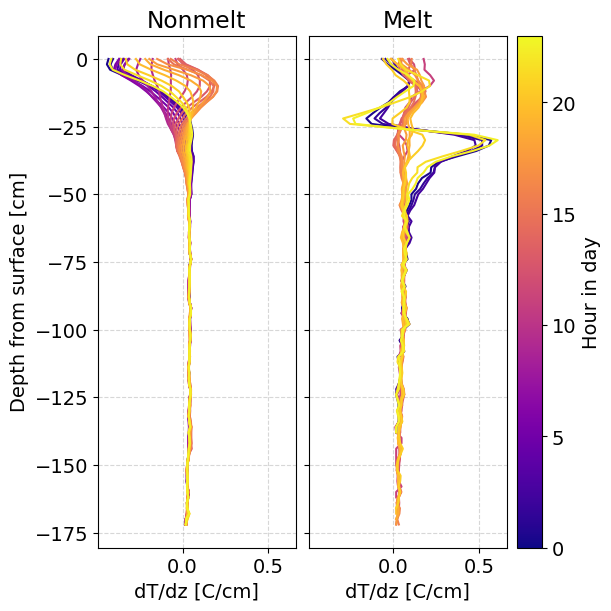

In [163]:
fig, axs = plt.subplots(1,2, sharey=True, figsize=(6,6), sharex=True, constrained_layout=True)
idxs = [agreed_nonmelt_idx,agreed_melt_idx]

hours = np.arange(0,25,1)


for i, (ax, m_idx) in enumerate(zip(axs.ravel(), idxs)):
    dTdz_midx = np.ma.copy(dTdz_rel_to_sfc)[m_idx[0],:]
    hours_midx = np.ma.copy(simba_hours)[m_idx[0]]

    for hr_min, hr_max in zip(hours[:-1],hours[1:]):
        col = plt.cm.plasma(((hr_min+hr_max)/2.)/24.)
        
        hr_idx = np.where((hours_midx>=hr_min)&(hours_midx<hr_max))[0]
        num_occurance[titles[i]].append(len(hr_idx))
        
        hr_dTdz_midx = dTdz_midx[hr_idx,:].mean(axis=0)
        ax.plot(hr_dTdz_midx, sub_depths, c=col)
    print()
    ax.grid(alpha=.5, ls='--')
    ax.set_xlabel('dT/dz [C/cm]')
    ax.set_title(titles[i])
axs[0].set_ylabel('Depth from surface [cm]')

cmappable = ScalarMappable(norm=Normalize(0,23), cmap=plt.cm.plasma)

#colorbar from https://stackoverflow.com/questions/65618997/python-matplotlib-custom-colorbar-for-plotted-lines-with-manually-assigned-color
cbar = plt.colorbar(cmappable, label='Hour in day', ax=axs[1])
# plt.tight_layout()
plt.show()


Counting different thresholds of melt

In [164]:
melt_idxs = {'neither melt':agreed_nonmelt_idx, 'both melt':agreed_melt_idx,
             'skin melt':skin_melt_idx, 'gpr melt 0.6':gpr_melt_lo_idx, 'gpr melt 0.9':gpr_melt_hi_idx}

hours = np.arange(0,25,1)

all_num_occurance = {'both melt':[],'neither melt':[],'skin melt':[],'gpr melt 0.6':[], 'gpr melt 0.9':[]}

for melt_type in melt_idxs:
    m_idx = melt_idxs[melt_type]
    
    temp_midx = np.ma.copy(temps_rel_to_sfc)[m_idx[0],:]
    hours_midx = np.ma.copy(simba_hours)[m_idx[0]]

    for hr_min, hr_max in zip(hours[:-1],hours[1:]):
        col = plt.cm.plasma(((hr_min+hr_max)/2.)/24.)
        
        hr_idx = np.where((hours_midx>=hr_min)&(hours_midx<hr_max))[0]
        all_num_occurance[melt_type].append(len(hr_idx))

Should add net ATM?

In [168]:
plrams_fpath = '/home/asledd/ICECAPS/polarAMS2025/'

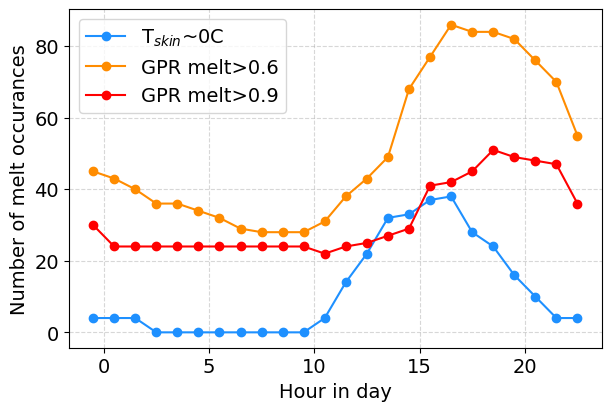

In [170]:
labels = {'skin melt':'T$_{skin}$~0C','gpr melt 0.6':'GPR melt>0.6','gpr melt 0.9':'GPR melt>0.9'}
fig, ax = plt.subplots(1, figsize=(6,4), constrained_layout=True)
# for melt_type in ['both melt','skin melt','gpr melt 0.6','gpr melt 0.9']:

for melt_type, c in zip(['skin melt','gpr melt 0.6','gpr melt 0.9'],['dodgerblue','darkorange','red']):
    
    plt.plot(hours[:-1]-.5, all_num_occurance[melt_type], label=labels[melt_type], marker='o', c=c)

plt.legend(loc='best')
plt.ylabel('Number of melt occurances')
plt.xlabel('Hour in day')
plt.grid(alpha=.5, ls='--')
# plt.savefig(plrams_fpath+'GPR-Tskin_diurnal-melt-occurances.png', dpi=300)

plt.show()